Installations

In [1]:
!pip install powerlaw
!pip install python-igraph
!pip install numpy==1.23.5 # in the new version of numpy, there is a problem with np.array

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 67.0 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.25.2
    Uninstalling numpy-1.25.2:
      Successfully uninstalled numpy-1.25.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
chex 0.1.86 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
pandas-stubs 2.0.3.230814 requires numpy>=1.25.0; python_version >= "3.9", but you have numpy 1.23.5 which is incompatible.


**Graph U-Nets Integration**
<br>
We integrate into preproc_data method the gpool operation. We will not use the coarse graph of misc-gan that generated in parse_data (R, P, W and c values). We used gpool operation instead.

In the second approach, in the generate_network, misc-gan performs Multi-Resolution Reconstruction and sigma operations. After that, we will apply the gunpool on the generated network.

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
class GNet(nn.Module):
    def __init__(self, in_dim, n_classes, args):
        super(GNet, self).__init__()
        self.n_act = getattr(nn, args.act_n)()
        self.c_act = getattr(nn, args.act_c)()
        self.s_gcn = GCN(in_dim, args.l_dim, self.n_act, args.drop_n)
        self.g_unet = GraphUnet(
            args.ks, args.l_dim, args.l_dim, args.l_dim, self.n_act,
            args.drop_n)
        self.out_l_1 = nn.Linear(3*args.l_dim*(args.l_num+1), args.h_dim)
        self.out_l_2 = nn.Linear(args.h_dim, n_classes)
        self.out_drop = nn.Dropout(p=args.drop_c)
        Initializer.weights_init(self)

    def forward(self, gs, hs, labels):
        hs = self.embed(gs, hs)
        logits = self.classify(hs)
        return self.metric(logits, labels)

    def embed(self, gs, hs):
        o_hs = []
        for g, h in zip(gs, hs):
            h = self.embed_one(g, h)
            o_hs.append(h)
        hs = torch.stack(o_hs, 0)
        return hs

    def embed_one(self, g, h):
        g = norm_g(g)
        h = self.s_gcn(g, h)
        hs = self.g_unet(g, h)
        h = self.readout(hs)
        return h

    def readout(self, hs):
        h_max = [torch.max(h, 0)[0] for h in hs]
        h_sum = [torch.sum(h, 0) for h in hs]
        h_mean = [torch.mean(h, 0) for h in hs]
        h = torch.cat(h_max + h_sum + h_mean)
        return h

    def classify(self, h):
        h = self.out_drop(h)
        h = self.out_l_1(h)
        h = self.c_act(h)
        h = self.out_drop(h)
        h = self.out_l_2(h)
        return F.log_softmax(h, dim=1)

    def metric(self, logits, labels):
        loss = F.nll_loss(logits, labels)
        _, preds = torch.max(logits, 1)
        acc = torch.mean((preds == labels).float())
        return loss, acc


In [3]:
class GraphUnet(nn.Module):

    def __init__(self, ks, in_dim, out_dim, dim, act, drop_p):
        super(GraphUnet, self).__init__()
        self.ks = ks
        self.bottom_gcn = GCN(dim, dim, act, drop_p)
        self.down_gcns = nn.ModuleList()
        self.up_gcns = nn.ModuleList()
        self.pools = nn.ModuleList()
        self.unpools = nn.ModuleList()
        self.l_n = len(ks)
        for i in range(self.l_n):
            self.down_gcns.append(GCN(dim, dim, act, drop_p))
            self.up_gcns.append(GCN(dim, dim, act, drop_p))
            self.pools.append(Pool(ks[i], dim, drop_p))
            self.unpools.append(Unpool(dim, dim, drop_p))

    def forward(self, g, h):
        adj_ms = []
        indices_list = []
        down_outs = []
        hs = []
        org_h = h
        for i in range(self.l_n):
            h = self.down_gcns[i](g, h)
            adj_ms.append(g)
            down_outs.append(h)
            g, h, idx = self.pools[i](g, h)
            indices_list.append(idx)
        h = self.bottom_gcn(g, h)
        for i in range(self.l_n):
            up_idx = self.l_n - i - 1
            g, idx = adj_ms[up_idx], indices_list[up_idx]
            g, h = self.unpools[i](g, h, down_outs[up_idx], idx)
            h = self.up_gcns[i](g, h)
            h = h.add(down_outs[up_idx])
            hs.append(h)
        h = h.add(org_h)
        hs.append(h)
        return hs


class GCN(nn.Module):

    def __init__(self, in_dim, out_dim, act, p):
        super(GCN, self).__init__()
        self.proj = nn.Linear(in_dim, out_dim)
        self.act = act
        self.drop = nn.Dropout(p=p) if p > 0.0 else nn.Identity()

    def forward(self, g, h):
        h = self.drop(h)
        h = torch.matmul(g, h)
        h = self.proj(h)
        h = self.act(h)
        return h

class Pool(nn.Module):

    def __init__(self, k, in_dim, p):
        super(Pool, self).__init__()
        self.k = k
        self.sigmoid = nn.Sigmoid()
        self.proj = nn.Linear(in_dim, 1)
        self.drop = nn.Dropout(p=p) if p > 0 else nn.Identity()

    def forward(self, g, h):
        Z = self.drop(h)
        weights = self.proj(Z).squeeze()
        scores = self.sigmoid(weights)
        return top_k_graph(scores, g, h, self.k)


class Unpool(nn.Module):
    def __init__(self, *args):
        super(Unpool, self).__init__()

    def forward(self, g, h, pre_h, idx):
        new_h = h.new_zeros([g.shape[0], h.shape[1]])
        # Subset h to match the size of idx
        h_subset = h[:len(idx)]
        # Debug: Print shapes before assignment
        print(f"Shape of new_h before assignment: {new_h.shape}")
        print(f"Shape of h_subset: {h_subset.shape}")
        print(f"Shape of idx: {idx.shape}")
        new_h[idx] = h_subset
        return g, new_h
    '''ddef forward(self, g, h, pre_h, idx):
        new_h = h.new_zeros([g.shape[0], h.shape[1]])
        new_h[idx] = h
        return g, new_h'''


def top_k_graph(scores, g, h, k):
    num_nodes = g.shape[0]
    values, idx = torch.topk(scores, max(2, int(k*num_nodes)))
    new_h = h[idx, :]
    values = torch.unsqueeze(values, -1)
    new_h = torch.mul(new_h, values)
    un_g = g.bool().float()
    un_g = torch.matmul(un_g, un_g).bool().float()
    un_g = un_g[idx, :]
    un_g = un_g[:, idx]
    g = norm_g(un_g)
    return g, new_h, idx


def norm_g(g):
    degrees = torch.sum(g, 1)
    g = g / degrees
    return g

In [4]:
class Initializer(object):

    @classmethod
    def _glorot_uniform(cls, w):
        if len(w.size()) == 2:
            fan_in, fan_out = w.size()
        elif len(w.size()) == 3:
            fan_in = w.size()[1] * w.size()[2]
            fan_out = w.size()[0] * w.size()[2]
        else:
            fan_in = np.prod(w.size())
            fan_out = np.prod(w.size())
        limit = np.sqrt(6.0 / (fan_in + fan_out))
        w.uniform_(-limit, limit)

    @classmethod
    def _param_init(cls, m):
        if isinstance(m, nn.parameter.Parameter):
            cls._glorot_uniform(m.data)
        elif isinstance(m, nn.Linear):
            m.bias.data.zero_()
            cls._glorot_uniform(m.weight.data)

    @classmethod
    def weights_init(cls, m):
        for p in m.modules():
            if isinstance(p, nn.ParameterList):
                for pp in p:
                    cls._param_init(pp)
            else:
                cls._param_init(p)

        for name, p in m.named_parameters():
            if '.' not in name:
                cls._param_init(p)

In [5]:
class GNetArgs:
    seed = 1
    data = 'PROTEINS'
    fold = 1
    num_epochs = 100
    batch = 32
    lr = 0.001
    deg_as_tag = 0
    l_num = 3
    h_dim = 128
    l_dim = 48
    drop_n = 0.5
    drop_c = 0.5
    act_n = 'ELU'
    act_c = 'ELU'
    ks = [0.9, 0.8, 0.7]
    acc_file = 're'
    in_dim = 3  # Set to 3 because of the size of Graph Data of PROTEINS
    save_model = '/content/drive/MyDrive/TrainedGraphU-Nets/proteins_graph_unet_model.pth'

gnet_args = GNetArgs()
net = GNet(in_dim=gnet_args.in_dim, n_classes=2, args=gnet_args)

def load_model_parameters(model, model_path):
    pretrained_dict = torch.load(model_path)
    model_dict = model.state_dict()
    pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and model_dict[k].size() == v.size()}
    model_dict.update(pretrained_dict)
    model.load_state_dict(model_dict)

model_path = gnet_args.save_model
load_model_parameters(net, model_path)
net.eval()

# for g-unets integration
global_params = {
    "down_outs_list": [],
    "indices_list_list": []
}

Imports

In [6]:
import tensorflow as tf
import numpy as np
import pickle as pkl
import argparse
import networkx as nx
import scipy.sparse as sp
import scipy.io as sio
import sys
import os
from collections import namedtuple
import math
import time
from google.colab import drive
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from scipy.sparse.csgraph import connected_components
from __future__ import division
from __future__ import print_function
import copy
import powerlaw
import collections
import igraph
import tf_slim as slim # import tensorflow.contrib.slim as slim also legacy and goolge colab removed it
from tensorflow.python.framework import ops

print(np.__version__)

1.23.5


In [7]:
class Args:
  def __init__(self, version=-1):
    self.demo = False
    self.dataset_A = f'cora_{version}.mat' if version > -1 else 'cora.mat'  # path of the data set
    self.checkpoint = f'/content/Misc-Gan_Project/checkpoint_training_cora_{version}' if version > -1 else '/content/Misc-Gan_Project/checkpoint_training_cora'  # path of the checkpoint
    self.filename = f'cora_output_network_{version}' if version > -1 else 'cora_output_network'  # the filename of output network
    self.output_dir = f'/content/Misc-Gan_Project/output_dir_cora_{version}' if version > -1 else '/content/Misc-Gan_Project/output_dir_cora'  # results are saved here
    self.epoch = 250  # number of epoch
    self.layer = 5  # number of layers
    self.clusters = 2  # number of clusters (2 or 3)
    self.use_resnet = True  # generation network using reidule block
    self.use_lsgan = True  # gan loss defined in lsgan
    self.which_direction = 'BtoA'  # AtoB or BtoA
    self.which_stage = 'training'  # training stage or testing stage
    self.starting_layer = 1  # the starting layer
    self.shuffle = True  # Shuffle the graph
    self.gpu = True  # Use gpu to train the model or not
    self.kernel_number = 32  # Shuffle the graph
    self.iter = 5  # Iterations of residule_block function for generator to train graph

args = Args()

Gae Module

initializations.py

In [8]:
def weight_variable_glorot(input_dim, output_dim, name=""):
    """Create a weight variable with Glorot & Bengio (AISTATS 2010)
    initialization.
    """
    init_range = np.sqrt(6.0 / (input_dim + output_dim))
    initial = tf.compat.v1.random_uniform([input_dim, output_dim], minval=-init_range,
                                maxval=init_range, dtype=tf.compat.v1.float32)
    return tf.compat.v1.Variable(initial, name=name)


input_data.py

In [9]:
def parse_index_file(filename):
    index = []
    for line in open(filename):
        index.append(int(line.strip()))
    return index

In [10]:
def load_data(dataset):
    # load the data: x, tx, allx, graph
    names = ['x', 'tx', 'allx', 'graph']
    objects = []
    for i in range(len(names)):
        objects.append(pkl.load(open("/content/drive/MyDrive/Misc-Gan_Project/data/ind.{}.{}".format(dataset, names[i]))))
    x, tx, allx, graph = tuple(objects)
    test_idx_reorder = parse_index_file("/content/drive/MyDrive/Misc-Gan_Project/data/ind.{}.test.index".format(dataset))
    test_idx_range = np.sort(test_idx_reorder)

    if dataset == 'citeseer':
        # Fix citeseer dataset (there are some isolated nodes in the graph)
        # Find isolated nodes, add them as zero-vecs into the right position
        test_idx_range_full = range(min(test_idx_reorder), max(test_idx_reorder)+1)
        tx_extended = sp.lil_matrix((len(test_idx_range_full), x.shape[1]))
        tx_extended[test_idx_range-min(test_idx_range), :] = tx
        tx = tx_extended

    features = sp.vstack((allx, tx)).tolil()
    features[test_idx_reorder, :] = features[test_idx_range, :]
    adj = nx.adjacency_matrix(nx.from_dict_of_lists(graph))
    return adj, features

In [11]:
def load_network_data(filename):
    network_A = sio.loadmat('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(filename))
    A = network_A['A']
    R = network_A['R'].transpose()
    edges = network_A['edges']
    return A, R, edges

layers.py

In [12]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

# global unique layer ID dictionary for layer name assignment
_LAYER_UIDS = {}

In [13]:
def get_layer_uid(layer_name=''):
    """Helper function, assigns unique layer IDs
    """
    if layer_name not in _LAYER_UIDS:
        _LAYER_UIDS[layer_name] = 1
        return 1
    else:
        _LAYER_UIDS[layer_name] += 1
        return _LAYER_UIDS[layer_name]

In [14]:
def dropout_sparse(x, keep_prob, num_nonzero_elems):
    """Dropout for sparse tensors. Currently fails for very large sparse tensors (>1M elements)
    """
    noise_shape = [num_nonzero_elems]
    random_tensor = keep_prob
    random_tensor += tf.compat.v1.random_uniform(noise_shape)
    dropout_mask = tf.cast(tf.compat.v1.floor(random_tensor), dtype=tf.compat.v1.bool)
    pre_out = tf.compat.v1.sparse_retain(x, dropout_mask)
    return pre_out * (1./keep_prob)

In [15]:
class Layer(object):
    """Base layer class. Defines basic API for all layer objects.

    # Properties
        name: String, defines the variable scope of the layer.

    # Methods
        _call(inputs): Defines computation graph of layer
            (i.e. takes input, returns output)
        __call__(inputs): Wrapper for _call()
    """
    def __init__(self, **kwargs):
        allowed_kwargs = {'name', 'logging'}
        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg
        name = kwargs.get('name')
        if not name:
            layer = self.__class__.__name__.lower()
            name = layer + '_' + str(get_layer_uid(layer))
        self.name = name
        self.vars = {}
        logging = kwargs.get('logging', False)
        self.logging = logging
        self.issparse = False

    def _call(self, inputs):
        return inputs

    def __call__(self, inputs):
        with tf.compat.v1.name_scope(self.name):
            outputs = self._call(inputs)
            return outputs

In [16]:
class GraphConvolution(Layer):
    """Basic graph convolution layer for undirected graph without edge labels."""
    def __init__(self, input_dim, output_dim, adj, dropout=0., act=tf.compat.v1.nn.relu, **kwargs):
        super(GraphConvolution, self).__init__(**kwargs)
        with tf.compat.v1.variable_scope(self.name + '_vars'):
            self.vars['weights'] = weight_variable_glorot(input_dim, output_dim, name="weights")
        self.dropout = dropout
        self.adj = adj
        self.act = act

    def _call(self, inputs):
        x = inputs
        x = tf.compat.v1.nn.dropout(x, 1-self.dropout)
        x = tf.compat.v1.matmul(x, self.vars['weights'])
        x = tf.compat.v1.sparse_tensor_dense_matmul(self.adj, x)
        outputs = self.act(x)
        return outputs

In [17]:

class GraphConvolutionSparse(Layer):
    """Graph convolution layer for sparse inputs."""
    def __init__(self, input_dim, output_dim, adj, features_nonzero, dropout=0., act=tf.compat.v1.nn.relu, **kwargs):
        super(GraphConvolutionSparse, self).__init__(**kwargs)
        with tf.compat.v1.variable_scope(self.name + '_vars'):
            self.vars['weights'] = weight_variable_glorot(input_dim, output_dim, name="weights")
        self.dropout = dropout
        self.adj = adj
        self.act = act
        self.issparse = True
        self.features_nonzero = features_nonzero

    def _call(self, inputs):
        x = inputs
        x = dropout_sparse(x, 1-self.dropout, self.features_nonzero)
        x = tf.compat.v1.sparse_tensor_dense_matmul(x, self.vars['weights'])
        x = tf.compat.v1.sparse_tensor_dense_matmul(self.adj, x)
        outputs = self.act(x)
        return outputs


In [18]:
class InnerProductDecoder(Layer):
    """Decoder model layer for link prediction."""
    def __init__(self, input_dim, dropout=0., act=tf.compat.v1.nn.sigmoid, **kwargs):
        super(InnerProductDecoder, self).__init__(**kwargs)
        self.dropout = dropout
        self.act = act

    def _call(self, inputs):
        inputs = tf.compat.v1.nn.dropout(inputs, 1-self.dropout)
        x = tf.compat.v1.transpose(inputs)
        x = tf.compat.v1.matmul(inputs, x)
        x = tf.compat.v1.reshape(x, [-1])
        outputs = self.act(x)
        return outputs

model.py

In [19]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

class Model(object):
    def __init__(self, **kwargs):
        allowed_kwargs = {'name', 'logging'}
        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg

        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg
        name = kwargs.get('name')
        if not name:
            name = self.__class__.__name__.lower()
        self.name = name

        logging = kwargs.get('logging', False)
        self.logging = logging

        self.vars = {}

    def _build(self):
        raise NotImplementedError

    def build(self):
        """ Wrapper for _build() """
        with tf.compat.v1.variable_scope(self.name):
            self._build()
        variables = tf.compat.v1.get_collection(tf.compat.v1.GraphKeys.GLOBAL_VARIABLES, scope=self.name)
        self.vars = {var.name: var for var in variables}

    def fit(self):
        pass

    def predict(self):
        pass

In [20]:
class GCNModelAE(Model):
    def __init__(self, placeholders, num_features, features_nonzero, **kwargs):
        super(GCNModelAE, self).__init__(**kwargs)

        self.inputs = placeholders['features']
        self.input_dim = num_features
        self.features_nonzero = features_nonzero
        self.adj = placeholders['adj']
        self.dropout = placeholders['dropout']
        self.build()

    def _build(self):
        self.hidden1 = GraphConvolutionSparse(input_dim=self.input_dim,
                                              output_dim=FLAGS.hidden1,
                                              adj=self.adj,
                                              features_nonzero=self.features_nonzero,
                                              act=tf.compat.v1.nn.relu,
                                              dropout=self.dropout,
                                              logging=self.logging)(self.inputs)

        self.embeddings = GraphConvolution(input_dim=FLAGS.hidden1,
                                           output_dim=FLAGS.hidden2,
                                           adj=self.adj,
                                           act=lambda x: x,
                                           dropout=self.dropout,
                                           logging=self.logging)(self.hidden1)

        self.z_mean = self.embeddings

        self.reconstructions = InnerProductDecoder(input_dim=FLAGS.hidden2,
                                      act=lambda x: x,
                                      logging=self.logging)(self.embeddings)

In [21]:
class GCNModelVAE(Model):
    def __init__(self, placeholders, num_features, num_nodes, features_nonzero, **kwargs):
        super(GCNModelVAE, self).__init__(**kwargs)

        self.inputs = placeholders['features']
        self.input_dim = num_features
        self.features_nonzero = features_nonzero
        self.n_samples = num_nodes
        self.adj = placeholders['adj']
        self.dropout = placeholders['dropout']
        self.build()

    def _build(self):
        self.hidden1 = GraphConvolutionSparse(input_dim=self.input_dim,
                                              output_dim=FLAGS.hidden1,
                                              adj=self.adj,
                                              features_nonzero=self.features_nonzero,
                                              act=tf.compat.v1.nn.relu,
                                              dropout=self.dropout,
                                              logging=self.logging)(self.inputs)

        self.z_mean = GraphConvolution(input_dim=FLAGS.hidden1,
                                       output_dim=FLAGS.hidden2,
                                       adj=self.adj,
                                       act=lambda x: x,
                                       dropout=self.dropout,
                                       logging=self.logging)(self.hidden1)

        self.z_log_std = GraphConvolution(input_dim=FLAGS.hidden1,
                                          output_dim=FLAGS.hidden2,
                                          adj=self.adj,
                                          act=lambda x: x,
                                          dropout=self.dropout,
                                          logging=self.logging)(self.hidden1)

        self.z = self.z_mean + tf.compat.v1.random_normal([self.n_samples, FLAGS.hidden2]) * tf.compat.v1.exp(self.z_log_std)

        self.reconstructions = InnerProductDecoder(input_dim=FLAGS.hidden2,
                                      act=lambda x: x,
                                      logging=self.logging)(self.z)

optimizer.py

In [22]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

class OptimizerAE(object):
    def __init__(self, preds, labels, pos_weight, norm):
        preds_sub = preds
        labels_sub = labels

        self.cost = norm * tf.compat.v1.reduce_mean(tf.compat.v1.nn.weighted_cross_entropy_with_logits(logits=preds_sub, targets=labels_sub, pos_weight=pos_weight))
        self.optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=FLAGS.learning_rate)  # Adam Optimizer

        self.opt_op = self.optimizer.minimize(self.cost)
        self.grads_vars = self.optimizer.compute_gradients(self.cost)

        self.correct_prediction = tf.compat.v1.equal(tf.compat.v1.cast(tf.compat.v1.greater_equal(tf.compat.v1.sigmoid(preds_sub), 0.5), tf.compat.v1.int32),
                                           tf.compat.v1.cast(labels_sub, tf.compat.v1.int32))
        self.accuracy = tf.compat.v1.reduce_mean(tf.compat.v1.cast(self.correct_prediction, tf.compat.v1.float32))


In [23]:
class OptimizerVAE(object):
    def __init__(self, preds, labels, model, num_nodes, pos_weight, norm):
        preds_sub = preds
        labels_sub = labels

        self.cost = norm * tf.compat.v1.reduce_mean(tf.compat.v1.nn.weighted_cross_entropy_with_logits(logits=preds_sub, targets=labels_sub, pos_weight=pos_weight))
        self.optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=FLAGS.learning_rate)  # Adam Optimizer

        # Latent loss
        self.log_lik = self.cost
        self.kl = (0.5 / num_nodes) * tf.compat.v1.reduce_mean(tf.compat.v1.reduce_sum(1 + 2 * model.z_log_std - tf.compat.v1.square(model.z_mean) -
                                                                   tf.compat.v1.square(tf.compat.v1.exp(model.z_log_std)), 1))
        self.cost -= self.kl

        self.opt_op = self.optimizer.minimize(self.cost)
        self.grads_vars = self.optimizer.compute_gradients(self.cost)

        self.correct_prediction = tf.compat.v1.equal(tf.compat.v1.cast(tf.compat.v1.greater_equal(tf.compat.v1.sigmoid(preds_sub), 0.5), tf.compat.v1.int32),
                                           tf.compat.v1.cast(labels_sub, tf.compat.v1.int32))
        self.accuracy = tf.compat.v1.reduce_mean(tf.compat.v1.cast(self.correct_prediction, tf.compat.v1.float32))

preprocessing.py

In [24]:
def sparse_to_tuple(sparse_mx):
    if not sp.isspmatrix_coo(sparse_mx):
        sparse_mx = sparse_mx.tocoo()
    coords = np.vstack((sparse_mx.row, sparse_mx.col)).transpose()
    values = sparse_mx.data
    shape = sparse_mx.shape
    return coords, values, shape

In [25]:
def preprocess_graph(adj):
    adj = sp.coo_matrix(adj)
    adj_ = adj + sp.eye(adj.shape[0])
    rowsum = np.array(adj_.sum(1))
    degree_mat_inv_sqrt = sp.diags(np.power(rowsum, -0.5).flatten())
    adj_normalized = adj_.dot(degree_mat_inv_sqrt).transpose().dot(degree_mat_inv_sqrt).tocoo()
    return sparse_to_tuple(adj_normalized)

In [26]:
def construct_feed_dict(adj_normalized, adj, features, placeholders):
    # construct feed dictionary
    feed_dict = dict()
    feed_dict.update({placeholders['features']: features})
    feed_dict.update({placeholders['adj']: adj_normalized})
    feed_dict.update({placeholders['adj_orig']: adj})
    return feed_dict

In [27]:
def mask_test_edges(adj):
    # Function to build test set with 10% positive links
    # NOTE: Splits are randomized and results might slightly deviate from reported numbers in the paper.
    # TODO: Clean up.

    # Remove diagonal elements
    adj = adj - sp.dia_matrix((adj.diagonal()[np.newaxis, :], [0]), shape=adj.shape)
    adj.eliminate_zeros()
    # Check that diag is zero:
    # assert np.diag(adj.todense()).sum() == 0

    adj_triu = sp.triu(adj)
    adj_tuple = sparse_to_tuple(adj_triu)
    edges = adj_tuple[0]
    # edges_all = sparse_to_tuple(adj)[0]
    # num_test = int(np.floor(edges.shape[0] / 10.))
    # num_val = int(np.floor(edges.shape[0] / 20.))

    # all_edge_idx = range(edges.shape[0])
    # np.random.shuffle(all_edge_idx)
    # val_edge_idx = all_edge_idx[:num_val]
    # test_edge_idx = all_edge_idx[num_val:(num_val + num_test)]
    # test_edges = edges[test_edge_idx]
    # val_edges = edges[val_edge_idx]
    # train_edges = np.delete(edges, np.hstack([test_edge_idx, val_edge_idx]), axis=0)
    train_edges = edges

    # def ismember(a, b, tol=5):
    #     rows_close = np.all(np.round(a - b[:, None], tol) == 0, axis=-1)
    #     return np.any(rows_close)
    #
    # test_edges_false = []
    # while len(test_edges_false) < len(test_edges):
    #     idx_i = np.random.randint(0, adj.shape[0])
    #     idx_j = np.random.randint(0, adj.shape[0])
    #     if idx_i == idx_j:
    #         continue
    #     if ismember([idx_i, idx_j], edges_all):
    #         continue
    #     if test_edges_false:
    #         if ismember([idx_j, idx_i], np.array(test_edges_false)):
    #             continue
    #         if ismember([idx_i, idx_j], np.array(test_edges_false)):
    #             continue
    #     test_edges_false.append([idx_i, idx_j])

    # val_edges_false = []
    # while len(val_edges_false) < len(val_edges):
    #     idx_i = np.random.randint(0, adj.shape[0])
    #     idx_j = np.random.randint(0, adj.shape[0])
    #     if idx_i == idx_j:
    #         continue
    #     if ismember([idx_i, idx_j], train_edges):
    #         continue
    #     if ismember([idx_j, idx_i], train_edges):
    #         continue
    #     if ismember([idx_i, idx_j], val_edges):
    #         continue
    #     if ismember([idx_j, idx_i], val_edges):
    #         continue
    #     if val_edges_false:
    #         if ismember([idx_j, idx_i], np.array(val_edges_false)):
    #             continue
    #         if ismember([idx_i, idx_j], np.array(val_edges_false)):
    #             continue
    #     val_edges_false.append([idx_i, idx_j])
    #
    # assert ~ismember(test_edges_false, edges_all)
    # assert ~ismember(val_edges_false, edges_all)
    # assert ~ismember(val_edges, train_edges)
    # assert ~ismember(test_edges, train_edges)
    # assert ~ismember(val_edges, test_edges)

    data = np.ones(train_edges.shape[0])

    # Re-build adj matrix
    adj_train = sp.csr_matrix((data, (train_edges[:, 0], train_edges[:, 1])), shape=adj.shape)
    adj_train = adj_train + adj_train.T

    # NOTE: these edge lists only contain single direction of edge!
    return adj_train, train_edges #, val_edges, val_edges_false, test_edges, test_edges_false

utils_network.py

In [28]:
# new added functions for cyclegan
class ImagePool(object):
    def __init__(self, maxsize=50):
        self.maxsize = maxsize
        self.num_img = 0
        self.images = []

    def __call__(self, image):
        if self.maxsize <= 0:
            return image
        if self.num_img < self.maxsize:
            self.images.append(image)
            self.num_img += 1
            return image
        if np.random.rand() > 0.5:
            idx = int(np.random.rand()*self.maxsize)
            tmp1 = copy.copy(self.images[idx])[0]
            self.images[idx][0] = image[0]
            idx = int(np.random.rand()*self.maxsize)
            tmp2 = copy.copy(self.images[idx])[1]
            self.images[idx][1] = image[1]
            return [tmp1, tmp2]
        else:
            return image

In [29]:
# --- loading dataset --- #
def load_mat_file():
    network_A = sio.loadmat('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A))
    A = network_A['A']
    P = network_A['P'].transpose()
    W = network_A['W']
    R = network_A['R'].transpose()
    edges = network_A['edges']
    cluster_info = network_A['IDX'].flatten()
    c = network_A['c'][0]
    clusters_info = []
    prev = 1
    for j in range(len(c)):
        idx = np.zeros(R[j, 0].shape[1], dtype=np.int16)
        for i in range(len(idx)):
            if i+1 not in c[j][0]:
                idx[i] = prev
            else:
                idx[i] = cluster_info[i]
                prev = idx[i]
        clusters_info.append(np.array(idx))
    clusters_info = np.array(clusters_info)
    indices = [[] for _ in range(len(clusters_info))]
    min_value = np.min(clusters_info[0])
    for j in range(len(clusters_info)):
        index = [[] for _ in range(args.clusters)]
        for c in range(args.clusters):
            for i in range(len(clusters_info[j])):
                if clusters_info[j][i] == c + min_value:
                    index[c].append(i)
        indices[j] = np.array(index)
    indices = np.array(indices)
    return A, P, W, R, indices, edges

In [30]:
def gpool_operation(A_copy, net, gnet_args):
    A_copy_tensor = torch.tensor(A_copy, dtype=torch.float32)
    feature_tensor = torch.randn((A_copy_tensor.shape[0], gnet_args.l_dim), dtype=torch.float32)

    down_outs = []
    indices_list = []

    with torch.no_grad():
        for j in range(net.g_unet.l_n):
            feature_tensor = net.g_unet.down_gcns[j](A_copy_tensor, feature_tensor)
            down_outs.append(feature_tensor.clone())
            A_copy_tensor, feature_tensor, coarsening_indices = net.g_unet.pools[j](A_copy_tensor, feature_tensor)
            indices_list.append(coarsening_indices)

        coarsened_graph, coarsened_features = A_copy_tensor, feature_tensor

    return coarsened_graph, coarsened_features, down_outs, indices_list

def preproc_data(sess, net, gnet_args):
    init_op = tf.compat.v1.global_variables_initializer()
    sess.run(init_op)
    A, P, W, R, indices, edges = load_mat_file()

    # Preserve the original graph
    A_copy = np.array(A.todense(), copy=True) if hasattr(A, 'todense') else np.array(A, copy=True)
    data_A = dict()
    data_B = dict()
    A_layer = []

    global_params["down_outs_list"].clear()
    global_params["indices_list_list"].clear()

    for i in range(1, args.layer + 1):
        # Store the intermediate coarse graph before G-Pool operation
        A_layer.append(A_copy.copy())

        # Perform G-Pool operation
        coarsened_graph, coarsened_features, down_outs, indices_list = gpool_operation(A_copy, net, gnet_args)
        A_copy = coarsened_graph.detach().numpy()

        # Ensure shuffle_list indices are within the valid range
        shuffle_list = np.array(indices[i-1][0] + indices[i-1][1])
        shuffle_list = shuffle_list[shuffle_list < A_copy.shape[0]]

        if args.shuffle:
            data_A['l{}_{}'.format(i, 1)] = zero_padding(A_copy[shuffle_list, :][:, shuffle_list])
            data_B['l{}_{}'.format(i, 1)] = zero_padding(W[0, i - 1].todense()[shuffle_list, :][:, shuffle_list])
        else:
            data_A['l{}_{}'.format(i, 1)] = zero_padding(A_copy)
            data_B['l{}_{}'.format(i, 1)] = zero_padding(W[0, i - 1].todense())

        global_params["down_outs_list"].append(down_outs)
        global_params["indices_list_list"].append(indices_list)

    return data_A, data_B, indices, P, A_layer, edges, R

In [31]:
# --- add zero padding such that height and the width of the adjacent matrix can be divided by 4 --- #
def zero_padding(data):
    dim = data.shape[1]
    if dim % 4 != 0:
        dim = (int(dim / 4) + 1) * 4
        new_data = np.zeros((1, dim, dim, 1), dtype=np.float16)
        max = np.max(data)
        if max > 1:
            data = np.divide(data, max)
        new_data[0, :data.shape[1], :data.shape[1], 0] = data
        return new_data
    else:
        new_data = np.zeros((1, dim, dim, 1), dtype=np.float16)
        max = np.max(data)
        if max > 1:
            data = np.divide(data, max)
        if len(data.shape) == 2:
            new_data[0, :dim, :dim, 0] = data
        else:
            new_data[0, :dim, :dim, :] = data
        return new_data

In [32]:
def squares(g):
    """
    Count the number of squares for each node
    Parameters
    ----------
    g: igraph Graph object
       The input graph.

    Returns
    -------
    List with N entries (N is number of nodes) that give the number of squares a node is part of.
    """

    cliques = g.cliques(min=4, max=4)
    result = [0] * g.vcount()
    for i, j, k, l in cliques:
        result[i] += 1
        result[j] += 1
        result[k] += 1
        result[l] += 1
    return result

In [33]:
def statistics_degrees(A_in):
    """
    Compute min, max, mean degree

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    d_max. d_min, d_mean
    """

    degrees = A_in.sum(axis=0)
    return np.max(degrees), np.min(degrees), np.mean(degrees)

In [34]:
def statistics_LCC(A_in):
    """
    Compute the size of the largest connected component (LCC)

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Size of LCC

    """

    unique, counts = np.unique(connected_components(A_in)[1], return_counts=True)
    LCC = np.where(connected_components(A_in)[1] == np.argmax(counts))[0]
    return LCC

In [35]:
def statistics_wedge_count(A_in):
    """
    Compute the wedge count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    The wedge count.
    """

    degrees = A_in.sum(axis=0)
    return float(np.sum(np.array([0.5 * x * (x - 1) for x in degrees])))

In [36]:
def statistics_claw_count(A_in):
    """
    Compute the claw count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Claw count
    """

    degrees = A_in.sum(axis=0)
    return float(np.sum(np.array([1 / 6. * x * (x - 1) * (x - 2) for x in degrees])))

In [37]:
def statistics_triangle_count(A_in):
    """
    Compute the triangle count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Triangle count
    """

    A_graph = nx.from_numpy_array(A_in)
    triangles = nx.triangles(A_graph)
    t = np.sum(list(triangles.values())) / 3
    return int(t)

In [38]:
def statistics_square_count(A_in):
    """
    Compute the square count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Square count
    """

    A_igraph = igraph.Graph.Adjacency((A_in > 0).tolist()).as_undirected()
    return int(np.sum(squares(A_igraph)) / 4)

In [39]:
def statistics_power_law_alpha(A_in):
    """
    Compute the power law coefficient of the degree distribution of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Power law coefficient
    """

    degrees = A_in.sum(axis=0)
    return powerlaw.Fit(degrees, xmin=max(np.min(degrees), 1)).power_law.alpha

In [40]:

def statistics_gini(A_in):
    """
    Compute the Gini coefficient of the degree distribution of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Gini coefficient
    """

    n = A_in.shape[0]
    degrees = A_in.sum(axis=0)
    degrees_sorted = np.sort(degrees)
    G = (2 * np.sum(np.array([i * degrees_sorted[i] for i in range(len(degrees))]))) / (n * np.sum(degrees)) - (
            n + 1) / n
    return float(G)

In [41]:
def statistics_edge_distribution_entropy(A_in):
    """
    Compute the relative edge distribution entropy of the input graph.

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Rel. edge distribution entropy
    """

    degrees = A_in.sum(axis=0)
    m = 0.5 * np.sum(np.square(A_in))
    n = A_in.shape[0]

    H_er = 1 / np.log(n) * np.sum(-degrees / (2 * float(m)) * np.log((degrees + .0001) / (2 * float(m))))
    return H_er

In [42]:
def statistics_cluster_props(A, Z_obs):
    def get_blocks(A_in, Z_obs, normalize=True):
        block = Z_obs.T.dot(A_in.dot(Z_obs))
        counts = np.sum(Z_obs, axis=0)
        blocks_outer = counts[:, None].dot(counts[None, :])
        if normalize:
            blocks_outer = np.multiply(block, 1 / blocks_outer)
        return blocks_outer

    in_blocks = get_blocks(A, Z_obs)
    diag_mean = np.multiply(in_blocks, np.eye(in_blocks.shape[0])).mean()
    offdiag_mean = np.multiply(in_blocks, 1 - np.eye(in_blocks.shape[0])).mean()
    return diag_mean, offdiag_mean

In [43]:
def statistics_compute_cpl(A):
    """Compute characteristic path length."""
    P = sp.csgraph.shortest_path(sp.csr_matrix(A))
    return P[((1 - np.isinf(P)) * (1 - np.eye(P.shape[0]))).astype(np.bool)].mean()

In [44]:
def compute_graph_statistics(A_in, Z_obs=None):
    """

    Parameters
    ----------
    A_in: sparse matrix
          The input adjacency matrix.
    Z_obs: np.matrix [N, K], where K is the number of classes.
          Matrix whose rows are one-hot vectors indicating the class membership of the respective node.

    Returns
    -------
    Dictionary containing the following statistics:
             * Maximum, minimum, mean degree of nodes
             * Size of the largest connected component (LCC)
             * Wedge count
             * Claw count
             * Triangle count
             * Square count
             * Power law exponent
             * Gini coefficient
             * Relative edge distribution entropy
             * Assortativity
             * Clustering coefficient
             * Number of connected components
             * Intra- and inter-community density (if Z_obs is passed)
             * Characteristic path length
    """

    A = A_in.copy()

    # assert ((A == A.T).all())
    A_graph = nx.from_numpy_array(A).to_undirected()

    statistics = {}
    start_time = time.time()
    d_max, d_min, d_mean = statistics_degrees(A)
    print("--- %s seconds to compute statistics_degrees ---" % (time.time() - start_time))
    # Degree statistics
    statistics['d_max'] = d_max
    statistics['d_min'] = d_min
    statistics['d'] = d_mean

    # largest connected component
    start_time = time.time()
    LCC = statistics_LCC(A)
    print("--- %s seconds to compute statistics_LCC ---" % (time.time() - start_time))
    statistics['LCC'] = LCC.shape[0]
    # wedge count
    start_time = time.time()
    statistics['wedge_count'] = statistics_wedge_count(A)
    print("--- %s seconds to compute statistics_wedge_count ---" % (time.time() - start_time))
    start_time = time.time()
    # claw count
    statistics['claw_count'] = statistics_claw_count(A)
    print("--- %s seconds to compute statistics_claw_count ---" % (time.time() - start_time))
    start_time = time.time()
    # triangle count
    statistics['triangle_count'] = statistics_triangle_count(A)
    print("--- %s seconds to compute statistics_triangle_count ---" % (time.time() - start_time))
    # start_time = time.time()
    # # Square count
    # statistics['square_count'] = statistics_square_count(A)
    # print("--- %s seconds to compute statistics_square_count ---" % (time.time() - start_time))
    start_time = time.time()
    # power law exponent
    statistics['power_law_exp'] = statistics_power_law_alpha(A)
    print("--- %s seconds to compute statistics_power_law_alpha ---" % (time.time() - start_time))
    start_time = time.time()
    # gini coefficient
    statistics['gini'] = statistics_gini(A)
    print("--- %s seconds to compute statistics_gini ---" % (time.time() - start_time))
    start_time = time.time()
    # Relative edge distribution entropy
    statistics['rel_edge_distr_entropy'] = statistics_edge_distribution_entropy(A)
    print("--- %s seconds to compute statistics_edge_distribution_entropy ---" % (time.time() - start_time))
    start_time = time.time()
    # Assortativity
    statistics['assortativity'] = nx.degree_assortativity_coefficient(A_graph)
    print("--- %s seconds to compute degree_assortativity_coefficient ---" % (time.time() - start_time))
    # Clustering coefficient
    statistics['clustering_coefficient'] = 3 * statistics['triangle_count'] / statistics['claw_count']
    start_time = time.time()
    # Number of connected components
    statistics['n_components'] = connected_components(A)[0]
    print("--- %s seconds to compute connected_components ---" % (time.time() - start_time))
    start_time = time.time()
    if Z_obs is not None:
        # inter- and intra-community density
        intra, inter = statistics_cluster_props(A, Z_obs)
        statistics['intra_community_density'] = intra
        statistics['inter_community_density'] = inter
    print("--- %s seconds to compute statistics_cluster_props ---" % (time.time() - start_time))
    # start_time = time.time()
    # statistics['cpl'] = statistics_compute_cpl(A)
    # print("--- %s seconds to compute statistics_compute_cpl ---" % (time.time() - start_time))

    return statistics

ops.py

In [45]:
def batch_norm(x, name="batch_norm"):
    return tf.compat.v1.contrib.layers.batch_norm(x, decay=0.9, updates_collections=None, epsilon=1e-5, scale=True, scope=name)

def instance_norm(input, name="instance_norm"):
    with tf.compat.v1.variable_scope(name):
        depth = input.get_shape()[3]
        scale = tf.compat.v1.get_variable("scale", [depth], initializer=tf.compat.v1.random_normal_initializer(1.0, 0.02, dtype=tf.compat.v1.float32))
        offset = tf.compat.v1.get_variable("offset", [depth], initializer=tf.compat.v1.constant_initializer(0.0))
        mean, variance = tf.compat.v1.nn.moments(input, axes=[1,2], keep_dims=True)
        epsilon = 1e-5
        inv = tf.compat.v1.rsqrt(variance + epsilon)
        normalized = (input-mean)*inv
        return scale*normalized + offset

def conv2d(input_, output_dim, ks=4, s=2, stddev=0.02, padding='SAME', name="conv2d"):
    with tf.compat.v1.variable_scope(name):
        return slim.conv2d(input_, output_dim, ks, s, padding=padding, activation_fn=None,
                            weights_initializer=tf.compat.v1.truncated_normal_initializer(stddev=stddev),
                            biases_initializer=None)

def deconv2d(input_, output_dim, ks=4, s=2, stddev=0.02, name="deconv2d"):
    with tf.compat.v1.variable_scope(name):
        return slim.conv2d_transpose(input_, output_dim, ks, s, padding='SAME', activation_fn=None,
                                    weights_initializer=tf.compat.v1.truncated_normal_initializer(stddev=stddev),
                                    biases_initializer=None)

def lrelu(x, leak=0.2, name="lrelu"):
    return tf.compat.v1.maximum(x, leak*x)

def linear(input_, output_size, scope=None, stddev=0.02, bias_start=0.0, with_w=False):

    with tf.variable_scope(scope or "Linear"):
        matrix = tf.compat.v1.get_variable("Matrix", [input_.get_shape()[-1], output_size], tf.compat.v1.float32,
                                 tf.compat.v1.random_normal_initializer(stddev=stddev))
        bias = tf.compat.v1.get_variable("bias", [output_size],
            initializer=tf.compat.v1.constant_initializer(bias_start))
        if with_w:
            return tf.compat.v1.matmul(input_, matrix) + bias, matrix, bias
        else:
            return tf.compat.v1.matmul(input_, matrix) + bias

module.py

In [46]:
def discriminator(image, options, reuse=False, name="discriminator"):

    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        h0 = lrelu(conv2d(image, options.df_dim, name='d_h0_conv'))
        # h0 is (128 x 128 x self.df_dim)
        h1 = lrelu(instance_norm(conv2d(h0, options.df_dim*2, name='d_h1_conv'), 'd_bn1'))
        # h1 is (64 x 64 x self.df_dim*2)
        h2 = lrelu(instance_norm(conv2d(h1, options.df_dim*4, name='d_h2_conv'), 'd_bn2'))
        # h2 is (32x 32 x self.df_dim*4)
        h3 = lrelu(instance_norm(conv2d(h2, options.df_dim*8, s=1, name='d_h3_conv'), 'd_bn3'))
        # h3 is (32 x 32 x self.df_dim*8)
        h4 = conv2d(h3, 1, s=1, name='d_h3_pred')
        # h4 is (32 x 32 x 1)
        return h4


def generator_unet(image, options, reuse=False, name="generator"):

    dropout_rate = 0.5 if options.is_training else 1.0
    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        # image is (256 x 256 x input_c_dim)
        e1 = instance_norm(conv2d(image, options.gf_dim, name='g_e1_conv'))
        # e1 is (128 x 128 x self.gf_dim)
        e2 = instance_norm(conv2d(lrelu(e1), options.gf_dim*2, name='g_e2_conv'), 'g_bn_e2')
        # e2 is (64 x 64 x self.gf_dim*2)
        e3 = instance_norm(conv2d(lrelu(e2), options.gf_dim*4, name='g_e3_conv'), 'g_bn_e3')
        # e3 is (32 x 32 x self.gf_dim*4)
        e4 = instance_norm(conv2d(lrelu(e3), options.gf_dim*8, name='g_e4_conv'), 'g_bn_e4')
        # e4 is (16 x 16 x self.gf_dim*8)
        e5 = instance_norm(conv2d(lrelu(e4), options.gf_dim*8, name='g_e5_conv'), 'g_bn_e5')
        # e5 is (8 x 8 x self.gf_dim*8)
        e6 = instance_norm(conv2d(lrelu(e5), options.gf_dim*8, name='g_e6_conv'), 'g_bn_e6')
        # e6 is (4 x 4 x self.gf_dim*8)
        e7 = instance_norm(conv2d(lrelu(e6), options.gf_dim*8, name='g_e7_conv'), 'g_bn_e7')
        # e7 is (2 x 2 x self.gf_dim*8)
        e8 = instance_norm(conv2d(lrelu(e7), options.gf_dim*8, name='g_e8_conv'), 'g_bn_e8')
        # e8 is (1 x 1 x self.gf_dim*8)

        d1 = deconv2d(tf.compat.v1.nn.relu(e8), options.gf_dim*8, name='g_d1')
        d1 = tf.compat.v1.nn.dropout(d1, dropout_rate)
        d1 = tf.compat.v1.concat([instance_norm(d1, 'g_bn_d1'), e7], 3)
        # d1 is (2 x 2 x self.gf_dim*8*2)

        d2 = deconv2d(tf.compat.v1.nn.relu(d1), options.gf_dim*8, name='g_d2')
        d2 = tf.compat.v1.nn.dropout(d2, dropout_rate)
        d2 = tf.compat.v1.concat([instance_norm(d2, 'g_bn_d2'), e6], 3)
        # d2 is (4 x 4 x self.gf_dim*8*2)

        d3 = deconv2d(tf.compat.v1.nn.relu(d2), options.gf_dim*8, name='g_d3')
        d3 = tf.compat.v1.nn.dropout(d3, dropout_rate)
        d3 = tf.compat.v1.concat([instance_norm(d3, 'g_bn_d3'), e5], 3)
        # d3 is (8 x 8 x self.gf_dim*8*2)

        d4 = deconv2d(tf.compat.v1.nn.relu(d3), options.gf_dim*8, name='g_d4')
        d4 = tf.compat.v1.concat([instance_norm(d4, 'g_bn_d4'), e4], 3)
        # d4 is (16 x 16 x self.gf_dim*8*2)

        d5 = deconv2d(tf.compat.v1.nn.relu(d4), options.gf_dim*4, name='g_d5')
        d5 = tf.compat.v1.concat([instance_norm(d5, 'g_bn_d5'), e3], 3)
        # d5 is (32 x 32 x self.gf_dim*4*2)

        d6 = deconv2d(tf.compat.v1.nn.relu(d5), options.gf_dim*2, name='g_d6')
        d6 = tf.compat.v1.concat([instance_norm(d6, 'g_bn_d6'), e2], 3)
        # d6 is (64 x 64 x self.gf_dim*2*2)

        d7 = deconv2d(tf.compat.v1.nn.relu(d6), options.gf_dim, name='g_d7')
        d7 = tf.compat.v1.concat([instance_norm(d7, 'g_bn_d7'), e1], 3)
        # d7 is (128 x 128 x self.gf_dim*1*2)

        d8 = deconv2d(tf.compat.v1.nn.relu(d7), options.output_c_dim, name='g_d8')
        # d8 is (256 x 256 x output_c_dim)

        return tf.compat.v1.nn.tanh(d8)


def generator_resnet(image, options, reuse=False, name="generator"):
    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        def residule_block(x, dim, ks=4, s=1, name='res'):
            y = instance_norm(conv2d(x, dim, ks, s, padding='SAME', name=name+'_c1'), name+'_bn1')
            y = instance_norm(conv2d(y, dim, ks, s, padding='SAME', name=name+'_c2'), name+'_bn2')
            return y + x
        dim = 4
        if image.get_shape().as_list()[1] % 8 != 0:
            dim = 2
        c2 = tf.compat.v1.nn.relu(instance_norm(conv2d(image, options.gf_dim, 4, dim, name='g_e2_c'), 'g_e2_bn'))
        c3 = tf.compat.v1.nn.relu(instance_norm(conv2d(c2, options.gf_dim*2, 4, 2, name='g_e3_c'), 'g_e3_bn'))
        r = c3
        for i in range(options.iters):
            r = residule_block(r, options.gf_dim * 2, name='g_r{}'.format(i))

        d1 = deconv2d(r, options.gf_dim*2, 4, 2, name='g_d1_dc')
        d1 = tf.compat.v1.nn.relu(instance_norm(d1, 'g_d1_bn'))
        d2 = deconv2d(d1, options.output_c_dim, 4, dim, name='g_d2_dc')
        d2 = tf.compat.v1.nn.relu(instance_norm(d2, 'g_d2_bn'))
        return d2


def abs_criterion(in_, target):
    return tf.compat.v1.reduce_mean(tf.compat.v1.abs(in_ - target))


def mae_criterion(in_, target):
    return tf.compat.v1.reduce_mean((in_-target)**2)


def sce_criterion(logits, labels):
    return tf.compat.v1.reduce_mean(tf.compat.v1.nn.sigmoid_cross_entropy_with_logits(logits=logits, labels=labels))

train.py

In [47]:
# Train on CPU (hide GPU) due to memory constraints
os.environ['CUDA_VISIBLE_DEVICES'] = ""

def draw_graph(final_network, edges, output_dir):
    network_B = final_network
    print('Generating graph by GAE algorithm.')
    for l in range(len(network_B)):
        DD = np.sort(network_B[l].flatten())
        threshold = DD[edges[0, l]]
        # threshold = DD[edges[0, l]]
        network_C = np.array([[0 if network_B[l][i, j] < threshold else 1 for i in range(network_B[l].shape[0])] for j in range(network_B[l].shape[1])])
        G = nx.from_numpy_matrix(network_C)
        pos = nx.spring_layout(G)
        nx.draw_networkx_nodes(G, pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue', alpha=0.8)
        plt.savefig('./{}/GAE_graph_l_{}_no_edge'.format(output_dir, l+1), dpi=1000)
        if l > 1:
            nx.draw_networkx_edges(G, pos, alpha=0.1)
            plt.savefig('./{}/GAE_graph_l_{}_with_edge'.format(output_dir, l+1), dpi=1000)
        plt.close()

def gae(filename, output_dir):
    # Settings
    flags = tf.compat.v1.flags
    FLAGS = flags.FLAGS

    flag_names = [
        'learning_rate',
        'epochs',
        'hidden1',
        'hidden2',
        'weight_decay',
        'dropout',
        'filename',
        'model',
        'dataset',
        'features',
        'f'
    ]

    for flag_name in flag_names:
        try:
            # Attempt to delete the flag
            delattr(FLAGS, flag_name)
        except AttributeError:
            # If the flag does not exist, just pass and continue
            print(f"Flag {flag_name} not found. Continuing...")
            pass

    flags.DEFINE_string('f','','')
    flags.DEFINE_float('learning_rate', 0.01, 'Initial learning rate.')
    flags.DEFINE_integer('epochs', 200, 'Number of epochs to train.')
    flags.DEFINE_integer('hidden1', 32, 'Number of units in hidden layer 1.')
    flags.DEFINE_integer('hidden2', 16, 'Number of units in hidden layer 2.')
    flags.DEFINE_float('weight_decay', 0., 'Weight for L2 loss on embedding matrix.')
    flags.DEFINE_float('dropout', 0., 'Dropout rate (1 - keep probability).')
    flags.DEFINE_string('filename', 'email-Eu-core.mat', 'dataset')
    flags.DEFINE_string('model', 'gcn_vae', 'Model string.')
    flags.DEFINE_string('dataset', 'cora', 'Dataset string.')
    flags.DEFINE_integer('features', 0, 'Whether to use features (1) or not (0).')

    model_str = FLAGS.model
    # dataset_str = FLAGS.dataset

    # Load data
    # adj, features = load_data(dataset_str)
    adj, R, edges = load_network_data(filename)

    num_edges = np.sum(adj)
    length = adj.shape[0]
    A = np.array(adj, copy=True)
    adj = sp.csr_matrix(adj)
    # Store original adjacency matrix (without diagonal entries) for later
    adj_orig = adj
    adj_orig = adj_orig - sp.dia_matrix((adj_orig.diagonal()[np.newaxis, :], [0]), shape=adj_orig.shape)
    adj_orig.eliminate_zeros()

    adj_train, train_edges = mask_test_edges(adj)
    adj = adj_train

    if FLAGS.features == 0:
        features = sp.identity(adj.shape[0])  # featureless

    # Some preprocessing
    adj_norm = preprocess_graph(adj)

    # Define placeholders
    placeholders = {
        'features': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'adj': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'adj_orig': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'dropout': tf.compat.v1.placeholder_with_default(0., shape=())
    }

    num_nodes = adj.shape[0]

    features = sparse_to_tuple(features.tocoo())
    num_features = features[2][1]
    features_nonzero = features[1].shape[0]

    # Create model
    model = None
    if model_str == 'gcn_ae':
        model = GCNModelAE(placeholders, num_features, features_nonzero)
    elif model_str == 'gcn_vae':
        model = GCNModelVAE(placeholders, num_features, num_nodes, features_nonzero)

    pos_weight = float(adj.shape[0] * adj.shape[0] - adj.sum()) / adj.sum()
    norm = adj.shape[0] * adj.shape[0] / float((adj.shape[0] * adj.shape[0] - adj.sum()) * 2)

    # Optimizer
    with tf.compat.v1.name_scope('optimizer'):
        if model_str == 'gcn_ae':
            opt = OptimizerAE(preds=model.reconstructions,
                              labels=tf.compat.v1.reshape(tf.compat.v1.sparse_tensor_to_dense(placeholders['adj_orig'],
                                                                          validate_indices=False), [-1]),
                              pos_weight=pos_weight,
                              norm=norm)
        elif model_str == 'gcn_vae':
            opt = OptimizerVAE(preds=model.reconstructions,
                               labels=tf.compat.v1.reshape(tf.compat.v1.sparse_tensor_to_dense(placeholders['adj_orig'],
                                                                           validate_indices=False), [-1]),
                               model=model, num_nodes=num_nodes,
                               pos_weight=pos_weight,
                               norm=norm)

    # Initialize session
    sess = tf.compat.v1.Session()
    sess.run(tf.compat.v1.global_variables_initializer())
    adj_label = adj_train + sp.eye(adj_train.shape[0])
    adj_label = sparse_to_tuple(adj_label)

    # Train model
    for epoch in range(FLAGS.epochs):

        t = time.time()
        # Construct feed dictionary
        feed_dict = construct_feed_dict(adj_norm, adj_label, features, placeholders)
        feed_dict.update({placeholders['dropout']: FLAGS.dropout})
        # Run single weight update
        outs = sess.run([opt.opt_op, opt.cost, opt.accuracy], feed_dict=feed_dict)
        # Compute average loss
        # avg_cost = outs[1]
        # avg_accuracy = outs[2]
        #
        # if (epoch + 1) % 10 == 0:
        #     print("Epoch:", '%04d' % (epoch + 1), "train_loss=", "{:.5f}".format(avg_cost),
        #           "train_acc=", "{:.5f}".format(avg_accuracy), "time=", "{:.5f}".format(time.time() - t))

    print("GAE Optimization Finished!")

    feed_dict.update({placeholders['dropout']: 0})
    emb = sess.run(model.z_mean, feed_dict=feed_dict)
    def sigmoid(x):
        return 1 / (1 + np.exp(-x))
    # Predict on test set of edges
    adj_rec = np.dot(emb, emb.T)
    adj_rec = np.array(adj_rec)
    # adj_rec = adj_rec[1:length, :][:, 1:length]
    DD = np.sort(adj_rec.flatten())
    threshold = DD[int(-1*num_edges)]
    network_C = np.array([[0 if adj_rec[i, j] < threshold else 1 for i in range(adj_rec.shape[0])] for j in range(adj_rec.shape[1])], dtype=np.int8)
    # np.save('../data/GAE_network.npy', network_C[1:length, :][:, 1:length])
    os.chdir('../')
    np.save('{}/GAE_network.npy'.format(output_dir, filename), network_C[1:length, :][:, 1:length])





    A_copy = adj_rec
    final_network = [A_copy]
    # orinal_network = [A]
    for i in range(1, 5):
        adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
        R_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=R[i - 1, 0].shape)
        A_copy = sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(R_matrix, adjacent_matrix), tf.compat.v1.transpose(R_matrix)),
                               feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: A_copy})
        final_network.append(np.array(A_copy))

        # adjacent_matrix = tf.placeholder(tf.float32, shape=A.shape)
        # R_matrix = tf.placeholder(tf.float32, shape=R[i - 1, 0].shape)
        # A = sess.run(tf.matmul(tf.matmul(R_matrix, adjacent_matrix), tf.transpose(R_matrix)),
        #                        feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: A})
        # orinal_network.append(A)
    # draw_graph(final_network, edges, output_dir)
    network_B = final_network[0]
    print('Generating graph by GAE algorithm.')
    DD = np.sort(network_B.flatten())[::-1]
    threshold = DD[edges[0, 0]]
    network_C = np.array([[0 if network_B[i, j] < threshold else 1 for i in range(network_B.shape[0])] for j in range(network_B.shape[1])])
    _A_obs = network_C + network_C.T
    _A_obs[_A_obs > 1] = 1
    _A_obs = np.array(_A_obs)
    print('Computing metrics for graph generated by GAE')
    c = compute_graph_statistics(_A_obs)
    with open('{}/gae_network_statistics.pickle'.format(output_dir), 'wb') as handle:
        pkl.dump(c, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(c)

model_network.py

In [48]:
class cyclegan(object):
    # --- cyclegan initialization  --- #
    def __init__(self, data_A, data_B):
        # need to modify the value
        self.output_dir = args.output_dir
        self.checkpoint_dir = args.checkpoint
        tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
        tfconfig.gpu_options.allow_growth = True
        self.sess = tf.compat.v1.Session(config=tfconfig)
        self.starting_layer = args.starting_layer
        self.filename = args.filename
        self.shuffle = args.shuffle
        self.batch_size = 1
        self.image_size = 28
        self.input_c_dim = 1
        self.output_c_dim = 1
        self.output_nc = 1
        self.L1_lambda = 10
        self.ngf = args.kernel_number
        self.ndf = args.kernel_number
        self.epoch = args.epoch
        self.phase = 'train'
        self.max_size = 5
        self.learning_rate = 0.0002
        self.print_freq = 1000
        self.save_freq = 100
        self.epoch_step = 100
        self.sample_dir = './sample'
        self.C = args.clusters
        self.direction = args.which_direction
        self.num_layer = args.layer
        # generate coarse network for each layer
        self.data_B = data_B
        self.data_A = data_A
        self.discriminator = discriminator
        if args.use_resnet:
            self.generator = generator_resnet
        else:
            self.generator = generator_unet
        if args.use_lsgan:
            self.criterionGAN = mae_criterion
        else:
            self.criterionGAN = sce_criterion
        self.iter = args.iter
        OPTIONS = namedtuple('OPTIONS', 'batch_size image_size \
                              gf_dim df_dim output_c_dim is_training iters')
        self.options = OPTIONS._make((self.batch_size, self.image_size,
                                      self.ngf, self.ndf, self.output_nc,
                                      self.phase == 'train', self.iter))
        # self._build_model()
        # self.saver = tf.train.Saver()
        self.pool = ImagePool(self.max_size)


    def _build_model(self):
        self.real_A = tf.compat.v1.placeholder(tf.compat.v1.float32, [None, self.image_size, self.image_size, self.input_c_dim],
                                     name='real_A_images')
        self.real_B = tf.compat.v1.placeholder(tf.compat.v1.float32, [None, self.image_size, self.image_size, self.output_c_dim],
                                     name='real_B_images')
        self.fake_B = self.generator(self.real_A, self.options, False, name="generatorA2B")
        self.fake_A_ = self.generator(self.fake_B, self.options, False, name="generatorB2A")
        self.fake_A = self.generator(self.real_B, self.options, True, name="generatorB2A")
        self.fake_B_ = self.generator(self.fake_A, self.options, True, name="generatorA2B")
        self.DB_fake = self.discriminator(self.fake_B, self.options, reuse=False, name="discriminatorB")
        self.DA_fake = self.discriminator(self.fake_A, self.options, reuse=False, name="discriminatorA")
        self.g_loss_a2b = self.criterionGAN(self.DB_fake, tf.compat.v1.ones_like(self.DB_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)
        self.g_loss_b2a = self.criterionGAN(self.DA_fake, tf.compat.v1.ones_like(self.DA_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)
        self.g_loss = self.criterionGAN(self.DA_fake, tf.compat.v1.ones_like(self.DA_fake)) \
            + self.criterionGAN(self.DB_fake, tf.compat.v1.ones_like(self.DB_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)




        self.fake_A_sample = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                            [None, self.image_size, self.image_size,
                                             self.input_c_dim], name='fake_A_sample')
        self.fake_B_sample = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                            [None, self.image_size, self.image_size,
                                             self.output_c_dim], name='fake_B_sample')
        self.DB_real = self.discriminator(self.real_B, self.options, reuse=True, name="discriminatorB")
        self.DA_real = self.discriminator(self.real_A, self.options, reuse=True, name="discriminatorA")
        self.DB_fake_sample = self.discriminator(self.fake_B_sample, self.options, reuse=True, name="discriminatorB")
        self.DA_fake_sample = self.discriminator(self.fake_A_sample, self.options, reuse=True, name="discriminatorA")

        self.db_loss_real = self.criterionGAN(self.DB_real, tf.compat.v1.ones_like(self.DB_real))
        self.db_loss_fake = self.criterionGAN(self.DB_fake_sample, tf.compat.v1.zeros_like(self.DB_fake_sample))
        self.db_loss = (self.db_loss_real + self.db_loss_fake) / 2
        self.da_loss_real = self.criterionGAN(self.DA_real, tf.compat.v1.ones_like(self.DA_real))
        self.da_loss_fake = self.criterionGAN(self.DA_fake_sample, tf.compat.v1.zeros_like(self.DA_fake_sample))
        self.da_loss = (self.da_loss_real + self.da_loss_fake) / 2
        self.d_loss = self.da_loss + self.db_loss

        self.g_loss_a2b_sum = tf.compat.v1.summary.scalar("g_loss_a2b", self.g_loss_a2b)
        self.g_loss_b2a_sum = tf.compat.v1.summary.scalar("g_loss_b2a", self.g_loss_b2a)
        self.g_loss_sum = tf.compat.v1.summary.scalar("g_loss", self.g_loss)
        self.g_sum = tf.compat.v1.summary.merge([self.g_loss_a2b_sum, self.g_loss_b2a_sum, self.g_loss_sum])
        self.db_loss_sum = tf.compat.v1.summary.scalar("db_loss", self.db_loss)
        self.da_loss_sum = tf.compat.v1.summary.scalar("da_loss", self.da_loss)
        self.d_loss_sum = tf.compat.v1.summary.scalar("d_loss", self.d_loss)
        self.db_loss_real_sum = tf.compat.v1.summary.scalar("db_loss_real", self.db_loss_real)
        self.db_loss_fake_sum = tf.compat.v1.summary.scalar("db_loss_fake", self.db_loss_fake)
        self.da_loss_real_sum = tf.compat.v1.summary.scalar("da_loss_real", self.da_loss_real)
        self.da_loss_fake_sum = tf.compat.v1.summary.scalar("da_loss_fake", self.da_loss_fake)
        self.d_sum = tf.compat.v1.summary.merge(
            [self.da_loss_sum, self.da_loss_real_sum, self.da_loss_fake_sum,
             self.db_loss_sum, self.db_loss_real_sum, self.db_loss_fake_sum,
             self.d_loss_sum]
        )

        self.test_A = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                     [None, self.image_size, self.image_size,
                                      self.input_c_dim], name='test_A')
        self.test_B = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                     [None, self.image_size, self.image_size,
                                      self.output_c_dim], name='test_B')
        self.testB = self.generator(self.test_A, self.options, True, name="generatorA2B")
        self.testA = self.generator(self.test_B, self.options, True, name="generatorB2A")

        t_vars = tf.compat.v1.trainable_variables()
        self.d_vars = [var for var in t_vars if 'discriminator' in var.name]
        self.g_vars = [var for var in t_vars if 'generator' in var.name]


    # --- training process  --- #
    def train(self, layer_idx):
        """Train cyclegan"""
        l = layer_idx
        print('Starting training Layer {}'.format(l))
        # dataA = self.data_A['l%d_1' % l]
        # dataB = self.data_B['l%d_1' % l]
        dataA = self.data_A
        dataB = self.data_B
        self.image_size = dataA.shape[1]
        self._build_model()
        self.saver = tf.compat.v1.train.Saver()
        self.lr = tf.compat.v1.placeholder(tf.compat.v1.float32, None, name='learning_rate')
        self.d_optim = tf.compat.v1.train.AdamOptimizer(self.lr, beta1=0.5) \
            .minimize(self.d_loss, var_list=self.d_vars)
        self.g_optim = tf.compat.v1.train.AdamOptimizer(self.lr, beta1=0.5) \
            .minimize(self.g_loss, var_list=self.g_vars)

        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        self.writer = tf.compat.v1.summary.FileWriter("./logs", self.sess.graph)

        counter = 1
        start_time = time.time()
        # a = dataA.shape[0]
        for epoch in range(1, self.epoch + 1):
            lr = self.learning_rate if epoch < self.epoch_step \
                else self.learning_rate*(self.epoch-epoch)/(self.epoch-self.epoch_step)
            fake_A, fake_B, _, summary_str = self.sess.run(
                [self.fake_A, self.fake_B, self.g_optim, self.g_sum],
                feed_dict={self.real_A: dataA,
                           self.real_B: dataB, self.lr: lr})
            self.writer.add_summary(summary_str, counter)
            [fake_A, fake_B] = self.pool([fake_A, fake_B])

            # Update D network
            _, summary_str = self.sess.run(
                [self.d_optim, self.d_sum],
                feed_dict={self.real_A: dataA, self.real_B: dataB,
                           self.fake_A_sample: fake_A,
                           self.fake_B_sample: fake_B,
                           self.lr: lr})
            self.writer.add_summary(summary_str, counter)
            counter += 1
            print(("Epoch: [%2d] time: %4.4f" % (epoch,  time.time() - start_time)))
            if epoch % 50 == 0:
                self.save(self.checkpoint_dir, epoch, l)
            # when the job is done, save the model.
        self.save(self.checkpoint_dir, epoch, l)
        print('Finish layer %d'%l)
        tf.compat.v1.reset_default_graph()

    # --- save the trained models --- #
    def save(self, checkpoint_dir, epoch, num_layer):
        model_name = "cyclegan.model"
        layer_name = "l{}_{}".format(num_layer, epoch)
        checkpoint_dir = os.path.join(checkpoint_dir, layer_name)
        if not os.path.exists(checkpoint_dir):
            os.makedirs(checkpoint_dir, exist_ok=True)
        self.saver.save(self.sess, os.path.join(checkpoint_dir, model_name))

    # --- load the trained models --- #
    def load(self, checkpoint_dir, num_layer, epoch):
        print(" [*] Reading checkpoint...")
        layer_name = "l{}_{}".format(num_layer, epoch)
        checkpoint_dir = os.path.join(checkpoint_dir, layer_name)
        ckpt = tf.compat.v1.train.get_checkpoint_state(checkpoint_dir)
        if ckpt and ckpt.model_checkpoint_path:
            ckpt_name = os.path.basename(ckpt.model_checkpoint_path)
            self.saver.restore(self.sess, os.path.join(checkpoint_dir, ckpt_name))
            return True
        else:
            return False

    # --- testing process  --- #
    def test(self, direction, indices, testing_data, P, l):
        """Test cyclegan"""
        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        if direction == 'AtoB':
            raise Exception('The direction should be BtoA!')
        else:
            data = self.data_A
            self.image_size = data['l{}_1'.format(l+1)].shape[1]
            self._build_model()
            self.saver = tf.compat.v1.train.Saver()
            if self.load(self.checkpoint_dir, l, self.epoch):
                print(" [*] Load SUCCESS")
            else:
                print(" [!] Load failed...")

            out_var, in_var = (self.testB, self.test_A) if direction == 'AtoB' else (self.testA, self.test_B)

            # Generate fake network
            for j in range(1, self.C):
                fake_A = self.sess.run(out_var, feed_dict={in_var: testing_data['l{}_{}'.format(l+1, j)]})
                A_copy = np.array(fake_A, copy=True)

            # Remove zero-padding
            length = sum(len(indices[l, i]) for i in range(len(indices[l])))
            new_A = np.zeros((length, length))

            # Adjust the shape of A_copy to match the shape of new_A
            min_dim = min(new_A.shape[0], A_copy.shape[1])
            new_A[:min_dim, :min_dim] = A_copy[0, :min_dim, :min_dim, 0]
            A_copy = new_A

            # Reshuffle the adjacency matrix
            shuffle_list = np.array([node for sublist in indices[l] for node in sublist])
            shuffle_list = np.argsort(shuffle_list)
            if self.shuffle:
                A_copy = A_copy[shuffle_list, :][:, shuffle_list]

            network_A = np.array(A_copy, copy=True)
            n = P[0, 0].shape[1]
            if A_copy.shape[0] < n:
                P[l-1, 0] = P[l-1, 0][:, :A_copy.shape[0]]
                P[l, 0] = P[l, 0][:A_copy.shape[0], :]

            # Coarse graph to fine graph transformation
            for i in reversed(range(1, l+1)):
                adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
                P_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=P[i-1, 0].shape)
                A_copy = self.sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(P_matrix, adjacent_matrix), tf.compat.v1.transpose(P_matrix)),
                                      feed_dict={P_matrix: P[i - 1, 0].todense(), adjacent_matrix: A_copy})

        return A_copy, network_A



    def test2(self, direction, indices, testing_data, P, l):
        """Test cyclegan"""
        #
        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        if direction == 'AtoB':
            Exception('The direction should be BtoA!')
        else:
            data = self.data_A
            self.image_size = data['l{}_1'.format(l+1)].shape[1]
            self._build_model()
            self.saver = tf.compat.v1.train.Saver()
            if self.load(self.checkpoint_dir, l, self.epoch):
                print(" [*] Load SUCCESS")
            else:
                print(" [!] Load failed...")
            out_var, in_var = (self.testB, self.test_A) if direction == 'AtoB' else (self.testA, self.test_B)
            # use generator to create fake network
            for j in range(1, self.C):
                fake_A = self.sess.run(out_var, feed_dict={in_var: testing_data['l{}_{}'.format(l+1, j)]})
                A_copy = np.array(fake_A, copy=True)
            # get rid of the zero-padding
            length = 0
            for i in range(len(indices[l])):
                length = len(indices[l, i]) + length
            new_A = np.zeros((length, length))
            new_A[:, :] = A_copy[0, :length, :length, 0]
            A_copy = new_A

            # re-shuffle the adjacent matrix
            shuffle_list = []
            for k in range(len(indices[l])):
                shuffle_list = shuffle_list + indices[l][k]
            shuffle_list = np.array(shuffle_list)
            shuffle_list = np.argsort(shuffle_list)
            if self.shuffle:
                A_copy = A_copy[shuffle_list, :][:, shuffle_list]
            else:
                A_copy = A_copy
            network_A = np.array(A_copy, copy=True)
            # coarse graph to fine graph
            for i in list(reversed(range(1, l+1))):
                adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
                P_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=P[i-1, 0].shape)
                A_copy = self.sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(P_matrix, adjacent_matrix), tf.compat.v1.transpose(P_matrix)),
                                  feed_dict={P_matrix: P[i - 1, 0].todense(), adjacent_matrix: A_copy})
        return A_copy, network_A

metrics.py

In [49]:
# In the context of machine learning, KL(P|Q) is often called the information gain achieved if Q is used instead of P
def kl(p, q):
    p = np.asarray(p, dtype=np.float)
    q = np.asarray(q, dtype=np.float)
    return np.sum(p * np.log(p / q))

def bd(p,q):
    return -np.log(np.sum(np.sqrt(np.multiply(p, q))))

# --- the KL divergence of the degree of graphs  --- #
def degree(output_dir):
    print('Start computing graph degree')
    random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network = load_data(output_dir)
    ds = np.array(sorted([d for n, d in original_network.degree()], reverse=True))
    mean = np.mean(ds)
    max = np.max(ds)
    original_network_ds = degree_distribution(original_network, mean, max)

    random_G_ds = degree_distribution(random_G, mean, max)
    random_bara_G_ds = degree_distribution(random_bara_G, mean, max)
    generated_network_ds = degree_distribution(generated_network, mean, max)
    GAE_network_ds = degree_distribution(GAE_network, mean, max)
    # NetGAN_network_ds = degree_distribution(NetGAN_network, mean, max)

    data_1 = kl(original_network_ds, generated_network_ds)
    data_2 = kl(original_network_ds, random_G_ds)
    data_3 = kl(original_network_ds, random_bara_G_ds)
    data_4 = kl(original_network_ds, GAE_network_ds)
    # data_5 = kl(original_network_ds, NetGAN_network_ds)
    print('KL divergence between original network and the network generated by Music_GAN: {}'.format(data_1))
    print('KL divergence between original network and the network generated by Random E-R: {}'.format(data_2))
    print('KL divergence between original network and the network generated by Random B-A: {}'.format(data_3))
    print('KL divergence between original network and the network generated by GAE: {}'.format(data_4))
    # print('KL divergence between original network and the network generated by NETGAN: {}'.format(data_5))

    # data_1 = bd(original_network_ds, generated_network_ds)
    # data_2 = bd(original_network_ds, random_G_ds)
    # data_3 = bd(original_network_ds, random_bara_G_ds)
    # data_4 = bd(original_network_ds, GAE_network_ds)
    # data_5 = bd(original_network_ds, NetGAN_network_ds)
    # print('Bhattacharyya distance between original network and the network generated by Music_GAN: {}'.format(data_1))
    # print('Bhattacharyya distance between original network and the network generated by Random E-R: {}'.format(data_2))
    # print('Bhattacharyya distance between original network and the network generated by Random B-A: {}'.format(data_3))
    # print('Bhattacharyya distance between original network and the network generated by GAE: {}'.format(data_4))
    # print('Bhattacharyya distance between original network and the network generated by NETGAN: {}'.format(data_5))


def softmax(x, mean, max):
    e_x = np.exp((x-max)/mean)
    return e_x / e_x.sum()


def degree_distribution(graph, mean, max):
    ds = np.array(sorted([d for n, d in graph.degree()], reverse=True))
    ds[ds==0]=1
    # ds = np.array([d for n, d in graph.degree()])
    # degreeCount = collections.Counter(ds)
    # deg, cnt = zip(*degreeCount.items())
    return softmax(ds, mean, max)


# --- the KL divergence of the coefficient of graphs  --- #
def coefficient(output_dir):
    random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network = load_data(output_dir)
    print('Start computing graph coefficient')
    a = np.array(sorted([x[1] for x in nx.clustering(original_network).items()]))
    mean = np.mean(a)
    max = np.max(a)
    original_network_coef = coef(original_network, mean, max)
    random_G_coef = coef(random_G, mean, max)
    random_bara_G_coef = coef(random_bara_G, mean, max)
    generated_network_coef = coef(generated_network, mean, max)
    GAE_network_coef = coef(GAE_network, mean, max)
    # NetGAN_network_coef = coef(NetGAN_network, mean, max)

    data_1 = kl(generated_network_coef, original_network_coef)
    data_2 = kl(original_network_coef, random_G_coef)
    data_3 = kl(original_network_coef, random_bara_G_coef)
    data_4 = kl(GAE_network_coef, original_network_coef)
    # data_5 = kl(GAE_network_coef, NetGAN_network_coef)
    print('KL divergence between original network and the network generated by Music_GAN: {}'.format(data_1))
    print('KL divergence between original network and the network generated by Random E-R: {}'.format(data_2))
    print('KL divergence between original network and the network generated by Random B-A: {}'.format(data_3))
    print('KL divergence between original network and the network generated by GAE: {}'.format(data_4))
    # print('KL divergence between original network and the network generated by NETGAN: {}'.format(data_5))

    # data_1 = bd(generated_network_coef, original_network_coef)
    # data_2 = bd(original_network_coef, random_G_coef)
    # data_3 = bd(original_network_coef, random_bara_G_coef)
    # data_4 = bd(GAE_network_coef, original_network_coef)
    # data_5 = bd(GAE_network_coef, NetGAN_network_coef)
    # print('Bhattacharyya distance between original network and the network generated by Music_GAN: {}'.format(data_1))
    # print('Bhattacharyya distance between original network and the network generated by Random E-R: {}'.format(data_2))
    # print('Bhattacharyya distance between original network and the network generated by Random B-A: {}'.format(data_3))
    # print('Bhattacharyya distance between original network and the network generated by GAE: {}'.format(data_4))
    # print('Bhattacharyya distance between original network and the network generated by NETGAN: {}'.format(data_5))

def coef(graph, mean, max):
    coef = np.array(sorted([x[1] for x in nx.clustering(graph).items()]))
    return softmax(coef, mean, max)

def load_data(output_dir):
    NetGAN_network = None
    generated_network = np.load('{}/{}.npy'.format(args.output_dir, args.filename))
    original_network = np.load('{}/org_network.npy'.format(output_dir))
    GAE_network = np.load('{}/GAE_network.npy'.format(output_dir))
    # NetGAN_network = np.load('{}/netgan_network.npy'.format(output_dir))[1]
    n = original_network.shape[0]
    generated_network = generated_network + np.identity(n)
    original_network = original_network + np.identity(n)
    original_network[original_network > 2] = 1
    generated_network[generated_network > 2] = 1
    GAE_network = GAE_network + np.identity(n)
    m = int(np.sum(original_network))
    random_G = nx.gnm_random_graph(n, m)
    random_bara_G = nx.generators.random_graphs.barabasi_albert_graph(n, 800)
    GAE_network = nx.from_numpy_array(GAE_network)
    generated_network = nx.from_numpy_array(generated_network)
    original_network = nx.from_numpy_array(original_network)
    # if NetGAN_network.shape[0] < n:
    #     Net = np.zeros((n, n))
    #     Net[:NetGAN_network.shape[0], :NetGAN_network.shape[1]] = NetGAN_network
    #     NetGAN_network = Net
    # NetGAN_network = nx.from_numpy_matrix(NetGAN_network[:n, :n])
    return random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network

Main

In [50]:
# Enable inline plotting in Colab
%matplotlib inline

def save_graph(R, edges):
    filename = args.filename
    A = np.load('{}/org_network.npy'.format(args.output_dir))
    network_B = np.load('{}/{}.npy'.format(args.output_dir, filename))
    # netgan = np.load('{}/netgan_network.npy'.format(args.output_dir))[1]
    tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
    tfconfig.gpu_options.allow_growth = True
    sess = tf.compat.v1.Session(config=tfconfig)
    n = R[0, 0].shape[1]
    # if netgan.shape[0] < n:
    #     # Net = np.zeros((n, n))
    #     R[0, 0] = R[0, 0][:netgan.shape[0], :netgan.shape[1]]
    # netgan_copy = netgan
    # netgan_disp = [netgan]
    # for i in range(1, args.layer):
    #     adjacent_matrix = tf.placeholder(tf.float32, shape=netgan_copy.shape)
    #     R_matrix = tf.placeholder(tf.float32, shape=R[i - 1, 0].shape)
    #     netgan_copy = sess.run(tf.matmul(tf.matmul(R_matrix, adjacent_matrix), tf.transpose(R_matrix)),
    #                       feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: netgan_copy})
    #     DD = np.sort(netgan_copy.flatten())[::-1]
    #     threshold = DD[edges[0, i]]
    #     network_C = np.array([[0 if netgan_copy[i, j] < threshold else 1 for i in range(netgan_copy.shape[0])] for j in
    #                           range(netgan_copy.shape[1])], dtype=np.int8)
    #     netgan_disp.append(network_C)
    for l in range(5):
        G = nx.from_numpy_array(A)
        pos = nx.spring_layout(G)
        gen_G = nx.from_numpy_array(network_B)
        gen_pos = nx.spring_layout(gen_G)

        # Plot and show generated graph without edges
        plt.figure()
        nx.draw_networkx_nodes(gen_G, gen_pos, node_size=10, node_color='blue', alpha=0.8)
        plt.title(f'Generated Graph Layer {l + args.starting_layer} without edges')
        plt.show()

        # Plot and show original graph without edges
        plt.figure()
        nx.draw_networkx_nodes(G, pos, node_size=10, node_color='blue', alpha=0.8)
        plt.title(f'Original Graph Layer {l + args.starting_layer} without edges')
        plt.show()

        # Plot and show generated graph with edges
        plt.figure()
        nx.draw_networkx_nodes(gen_G, gen_pos, node_size=10, node_color='blue', alpha=1.0)
        nx.draw_networkx_edges(gen_G, gen_pos, alpha=0.1)
        plt.title(f'Generated Graph Layer {l + args.starting_layer} with edges')
        plt.show()

        # Plot and show original graph with edges
        plt.figure()
        nx.draw_networkx_nodes(G, pos, node_size=10, node_color='blue', alpha=1.0)
        nx.draw_networkx_edges(G, pos, alpha=0.1)
        plt.title(f'Original Graph Layer {l + args.starting_layer} with edges')
        plt.show()

        # nx.draw_networkx_nodes(netgan_G, netgan_pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue',
        #                        alpha=0.8)
        # plt.savefig('./{}/netgan_graph_l_{}_without_edge'.format(args.output_dir, l + args.starting_layer), dpi=1000)
        # plt.close()
        # nx.draw_networkx_nodes(netgan_G, netgan_pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue', alpha=0.8)
        # nx.draw_networkx_edges(netgan_G, netgan_pos, alpha=0.1)
        # plt.savefig('./{}/netgan_graph_l_{}_with_edge'.format(args.output_dir, l + args.starting_layer), dpi=1000)
        # plt.close()

In [51]:
# --- testing stage --- #
def generate_network(data_A, data_B, indices, P, A):
    #  --- for testing --- #
    filename = args.filename
    image_path = os.path.join(args.output_dir, args.which_direction)
    network_A = [[] for _ in range(args.starting_layer, args.layer)]
    network_coarse = [[] for _ in range(args.starting_layer, args.layer)]
    if not os.path.exists(image_path):
        os.makedirs(image_path)
    for l in range(args.layer - args.starting_layer):
        model = cyclegan(data_A, data_B)
        network_A[l], network_coarse[l] = model.test(args.which_direction, indices, data_B, P, l + args.starting_layer)
        tf.compat.v1.reset_default_graph()
    A = np.array(A)
    np.save('{}/{}.npy'.format(args.output_dir, filename), network_coarse)
    np.save('{}/org_network.npy'.format(args.output_dir), A[args.starting_layer:args.layer])
    network_B = np.array(np.sum(network_A, axis=0) / (args.layer - args.starting_layer))
    length = len(network_B)
    network_B = network_B[1:length, :][:, 1:length]
    A = A[0][1:length, :][:, 1:length]
    A = A + A.T
    A[A > 1] = 1
    DD = np.sort(network_B.flatten())[::-1]
    threshold = DD[int(np.sum(A))]
    network_C = np.array([[0 if network_B[i, j] < threshold else 1 for i in range(network_B.shape[0])] for j in
                          range(network_B.shape[1])], dtype=np.int8)

    # Apply GUNPOOL operation after multi-resolution graph reconstruction and summation
    adj_pooled_tensor = torch.tensor(network_C, dtype=torch.float32)
    feature_tensor = torch.ones(adj_pooled_tensor.shape[0], gnet_args.l_dim, dtype=torch.float32)  # Assuming gnet_args.l_dim is defined
    down_outs = global_params["down_outs_list"][-1]  # Using the last layer's outputs
    indices_list = global_params["indices_list_list"][-1]  # Using the last layer's indices

    with torch.no_grad():
        for i in range(net.g_unet.l_n):
            adj_pooled_tensor, feature_tensor = net.g_unet.unpools[i](adj_pooled_tensor, feature_tensor, down_outs[i], indices_list[i])
            feature_tensor = net.g_unet.up_gcns[i](adj_pooled_tensor, feature_tensor)

    network_C = adj_pooled_tensor.detach().numpy()

    np.save('{}/{}.npy'.format(args.output_dir, filename), network_C)
    np.save('{}/org_network.npy'.format(args.output_dir), A)

    print('Computing metrics for original graph')
    b = compute_graph_statistics(A)
    with open('{}/org_network_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(b, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(b)
    print('Computing metrics for graph generated by Music-GAN')
    a = compute_graph_statistics(network_C)
    print(a)
    with open('{}/music_network_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(a, handle)


In [52]:
def evaluation():
    degree(args.output_dir)
    coefficient(args.output_dir)

In [53]:
def evaluation2(original_network):
    n = original_network.shape[0]
    m = int(np.sum(original_network))
    random_ER_G = nx.gnm_random_graph(n, m)
    random_bara_G = nx.generators.random_graphs.barabasi_albert_graph(n, 250)
    ER_G = nx.to_numpy_array(random_ER_G)
    bara_G = nx.to_numpy_array(random_bara_G)
    np.save('{}/ER.npy'.format(args.output_dir), ER_G)
    np.save('{}/BA.npy'.format(args.output_dir), bara_G)
    # ER_G = ER_G  + ER_G .T
    # ER_G[ER_G  > 1] = 1
    # bara_G = bara_G  + bara_G .T
    # bara_G[bara_G  > 1] = 1
    ER_G = np.array(ER_G)
    bara_G = np.array(bara_G)
    print('Computing metrics for ER graph')
    c = compute_graph_statistics(ER_G)
    with open('{}/ER_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(c, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(c)
    print('Computing metrics for bara graph')
    d = compute_graph_statistics(bara_G)
    with open('{}/bara_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(d, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(d)


Traning cora dataset after the integration of G-Unets:

In [ ]:
args = Args()

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

# data_A, data_B, indices, P, A, edges = preproc_data(tf.Session(config=tfconfig))
# --- generating synthetic network --- #
# generate_network(data_A, data_B, indices, P, A)
# # --- evaluation --- #
# # save_graph(edges)
# print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
#     args.output_dir))
# gae(args.dataset_A, args.output_dir)
# print('Evaluation Results:')
# evaluation()

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)
/usr/local/lib/python3.10/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1697: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
Instructions for updating:
Call initializer instance

Starting training Layer 1
Epoch: [ 1] time: 11.6726
Epoch: [ 2] time: 11.7431
Epoch: [ 3] time: 11.8042
Epoch: [ 4] time: 11.8762
Epoch: [ 5] time: 11.9384
Epoch: [ 6] time: 12.0086
Epoch: [ 7] time: 12.0695
Epoch: [ 8] time: 12.1375
Epoch: [ 9] time: 12.2013
Epoch: [10] time: 12.2659
Epoch: [11] time: 12.3278
Epoch: [12] time: 12.3914
Epoch: [13] time: 12.4575
Epoch: [14] time: 12.5219
Epoch: [15] time: 12.5842
Epoch: [16] time: 12.6493
Epoch: [17] time: 12.7151
Epoch: [18] time: 12.7772
Epoch: [19] time: 12.8420
Epoch: [20] time: 12.9066
Epoch: [21] time: 12.9722
Epoch: [22] time: 13.0321
Epoch: [23] time: 13.0936
Epoch: [24] time: 13.1555
Epoch: [25] time: 13.2219
Epoch: [26] time: 13.2876
Epoch: [27] time: 13.3530
Epoch: [28] time: 13.4165
Epoch: [29] time: 13.4902
Epoch: [30] time: 13.5577
Epoch: [31] time: 13.6199
Epoch: [32] time: 13.6894
Epoch: [33] time: 13.7562
Epoch: [34] time: 13.8225
Epoch: [35] time: 13.8872
Epoch: [36] time: 13.9528
Epoch: [37] time: 14.0160
Epoch: [38] 

After we trained cora, now we will test it

<ipython-input-30-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-30-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)
/usr/local/lib/python3.10/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1697: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-52-6dcbda9c20bc>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)
/usr/local/lib/python3.10/dist-packages/numpy/lib/npyio.py:521: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


Shape of new_h before assignment: torch.Size([2707, 48])
Shape of h_subset: torch.Size([155, 48])
Shape of idx: torch.Size([155])
Shape of new_h before assignment: torch.Size([2707, 48])
Shape of h_subset: torch.Size([124, 48])
Shape of idx: torch.Size([124])
Shape of new_h before assignment: torch.Size([2707, 48])
Shape of h_subset: torch.Size([86, 48])
Shape of idx: torch.Size([86])
Computing metrics for original graph
--- 0.006095170974731445 seconds to compute statistics_degrees ---
--- 0.24797368049621582 seconds to compute statistics_LCC ---
--- 0.011291027069091797 seconds to compute statistics_wedge_count ---
--- 0.011752843856811523 seconds to compute statistics_claw_count ---
--- 0.06975340843200684 seconds to compute statistics_triangle_count ---
--- 0.007578134536743164 seconds to compute statistics_power_law_alpha ---
--- 0.007134199142456055 seconds to compute statistics_gini ---
--- 0.028795242309570312 seconds to compute statistics_edge_distribution_entropy ---
--- 0.03

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.12006092071533203 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 78, 'd_min': 0, 'd': 3.7753971185814557, 'LCC': 2473, 'wedge_count': 37571.0, 'claw_count': 322928.0, 'triangle_count': 1470, 'power_law_exp': 1.9502506717631451, 'gini': 0.39891829329917305, 'rel_edge_distr_entropy': 0.9593636190391452, 'assortativity': -0.09112625021773978, 'clustering_coefficient': 0.013656294901649903, 'n_components': 85}
Computing metrics for graph generated by Music-GAN
--- 0.002893686294555664 seconds to compute statistics_degrees ---
--- 0.24730253219604492 seconds to compute statistics_LCC ---
--- 0.013021230697631836 seconds to compute statistics_wedge_count ---
--- 0.017883777618408203 seconds to compute statistics_claw_count ---
--- 0.09659624099731445 seconds to compute statistics_triangle_count ---
--- 0.004388332366943359 seconds to compute statistics_power_law_alpha ---
--- 0.008523941040039062 seconds to

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.11872744560241699 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 76.0, 'd_min': 0.0, 'd': 3.7757666, 'LCC': 1128, 'wedge_count': 121241.0, 'claw_count': 1443536.0, 'triangle_count': 12663, 'power_law_exp': 1.5465146391226705, 'gini': 0.8418684421893445, 'rel_edge_distr_entropy': 0.8015204055633564, 'assortativity': -0.05696333634923558, 'clustering_coefficient': 0.026316628057769256, 'n_components': 1580}


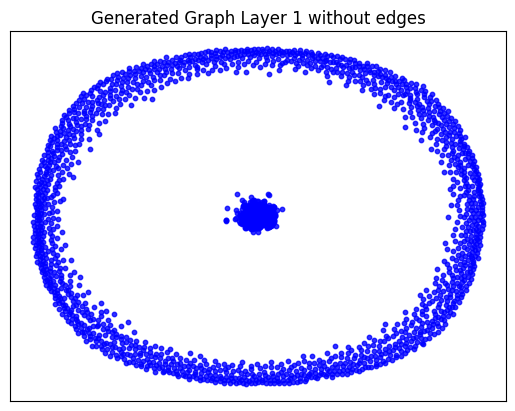

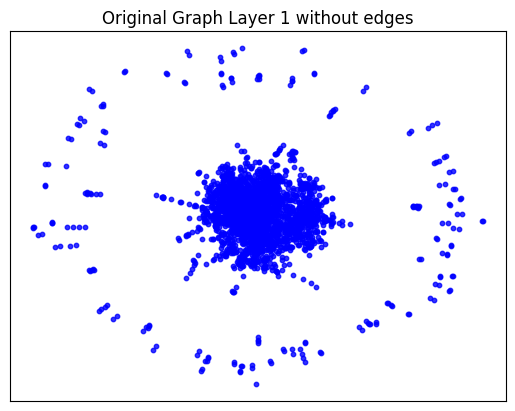

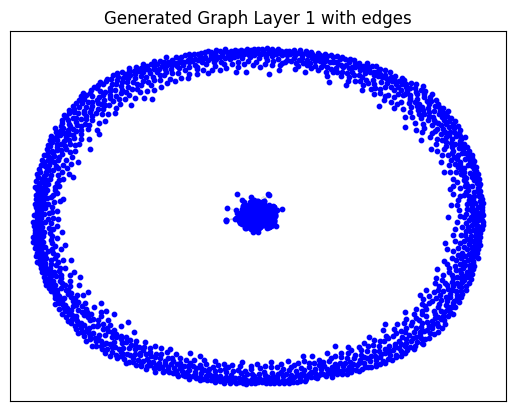

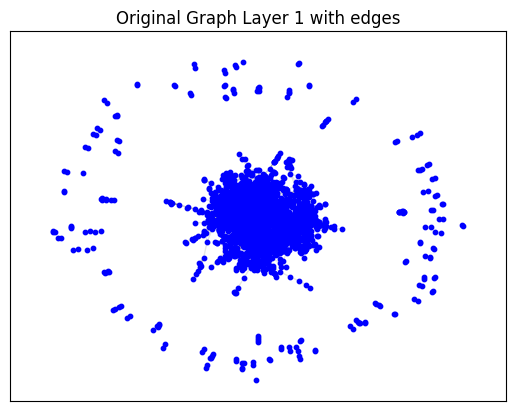

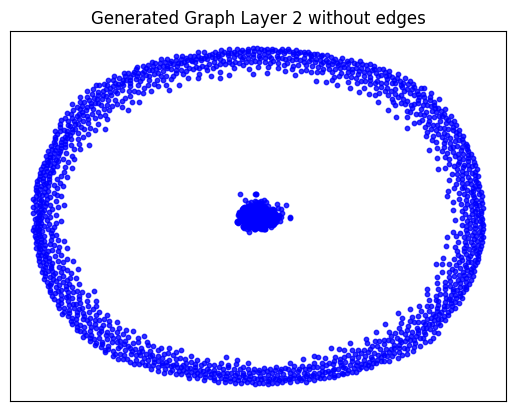

...

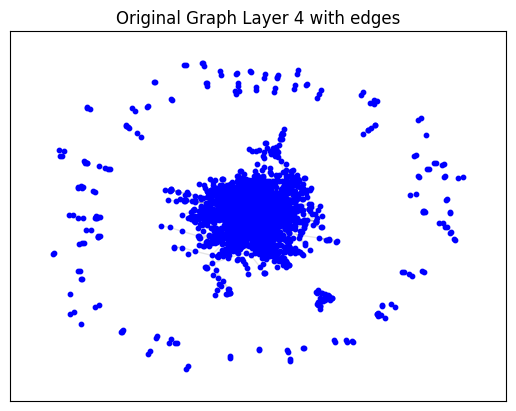

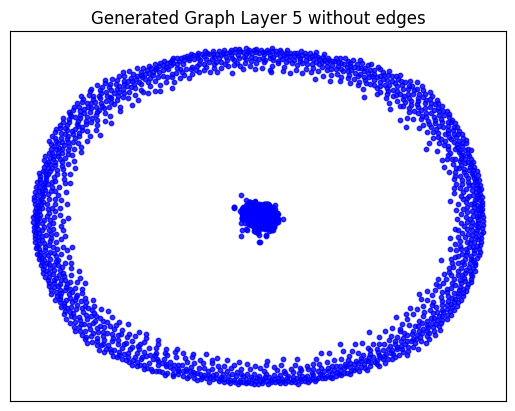

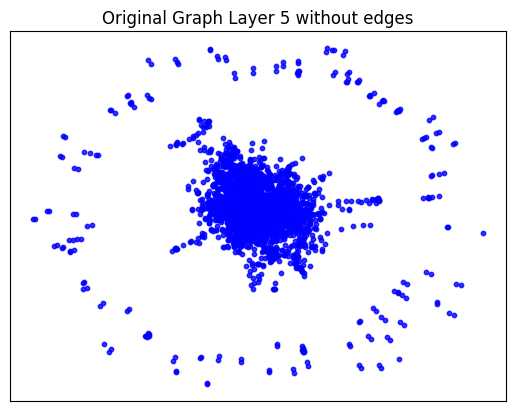

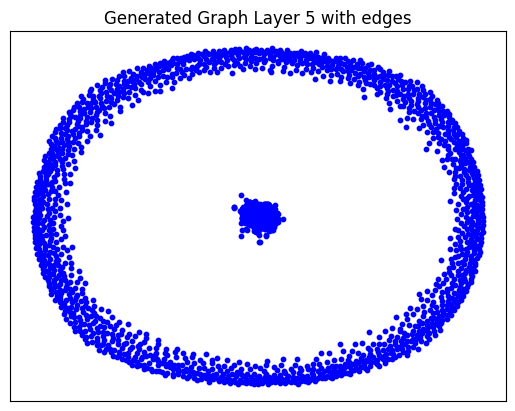

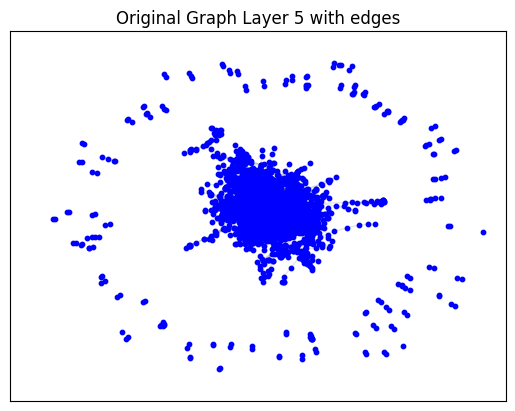

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_cora.
Flag learning_rate not found. Continuing...
Flag epochs not found. Continuing...
Flag hidden1 not found. Continuing...
Flag hidden2 not found. Continuing...
Flag weight_decay not found. Continuing...
Flag dropout not found. Continuing...
Flag filename not found. Continuing...
Flag model not found. Continuing...
Flag dataset not found. Continuing...
Flag features not found. Continuing...
Flag f not found. Continuing...


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
targets is deprecated, use labels instead


GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.005774974822998047 seconds to compute statistics_degrees ---
--- 0.23791241645812988 seconds to compute statistics_LCC ---
--- 0.011197090148925781 seconds to compute statistics_wedge_count ---
--- 0.011532068252563477 seconds to compute statistics_claw_count ---
--- 0.05269455909729004 seconds to compute statistics_triangle_count ---
--- 0.007199287414550781 seconds to compute statistics_power_law_alpha ---
--- 0.0067059993743896484 seconds to compute statistics_gini ---
--- 0.028254032135009766 seconds to compute statistics_edge_distribution_entropy ---
--- 0.023112058639526367 seconds to compute degree_assortativity_coefficient ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.11968517303466797 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 300, 'd_min': 0, 'd': 1.792466765140325, 'LCC': 1130, 'wedge_count': 121646.0, 'claw_count': 7177822.0, 'triangle_count': 2102, 'power_law_exp': 2.4797479120615433, 'gini': 0.8402657449824384, 'rel_edge_distr_entropy': 0.7480805575606806, 'assortativity': -0.33831467850107644, 'clustering_coefficient': 0.0008785394789672967, 'n_components': 1538}
Evaluation Results:
Start computing graph degree


<ipython-input-50-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-50-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  q = np.asarray(q, dtype=np.float)


KL divergence between original network and the network generated by Music_GAN: 0.45865027804210046
KL divergence between original network and the network generated by Random E-R: 4.935566539540771
KL divergence between original network and the network generated by Random B-A: 1.1476091609698669
KL divergence between original network and the network generated by GAE: 0.8139792929892055
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 0.9389975614637386
KL divergence between original network and the network generated by Random E-R: 1.2196732538088857
KL divergence between original network and the network generated by Random B-A: 0.9432112477457848
KL divergence between original network and the network generated by GAE: 0.25497909075005


In [ ]:
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

**PubMed Simulation:** <br>
The file taken from here: https://github.com/chennnM/GCNII/blob/master/data/ind.pubmed.graph <br>
Training MiscGan with the integrate G-Unets that trained with PROTEINS
<br>
We will split the dataset because of the limitation of GPU.

First batch:

In [54]:
args = Args()
args.dataset_A = 'pubmed_1.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_1'
args.filename = 'pubmed_1_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_1'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)
/usr/local/lib/python3.10/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1697: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
Instructions for updating:
Call initializer instance

Starting training Layer 1
Epoch: [ 1] time: 14.9759
Epoch: [ 2] time: 15.2023
Epoch: [ 3] time: 15.4455
Epoch: [ 4] time: 15.6573
Epoch: [ 5] time: 15.9332
Epoch: [ 6] time: 16.1452
Epoch: [ 7] time: 16.3573
Epoch: [ 8] time: 16.5695
Epoch: [ 9] time: 16.7819
Epoch: [10] time: 16.9937
Epoch: [11] time: 17.2055
Epoch: [12] time: 17.4174
Epoch: [13] time: 17.6294
Epoch: [14] time: 17.8419
Epoch: [15] time: 18.0547
Epoch: [16] time: 18.2675
Epoch: [17] time: 18.4793
Epoch: [18] time: 18.6910
Epoch: [19] time: 18.9034
Epoch: [20] time: 19.1160
Epoch: [21] time: 19.3281
Epoch: [22] time: 19.5403
Epoch: [23] time: 19.7518
Epoch: [24] time: 19.9640
Epoch: [25] time: 20.1763
Epoch: [26] time: 20.3893
Epoch: [27] time: 20.6019
Epoch: [28] time: 20.8149
Epoch: [29] time: 21.0467
Epoch: [30] time: 21.2700
Epoch: [31] time: 21.4823
Epoch: [32] time: 21.6947
Epoch: [33] time: 21.9069
Epoch: [34] time: 22.1195
Epoch: [35] time: 22.3328
Epoch: [36] time: 22.5449
Epoch: [37] time: 22.7571
Epoch: [38] 

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-51-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)
/usr/local/lib/python3.10/dist-packages/numpy/lib/npyio.py:521: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


Shape of new_h before assignment: torch.Size([6705, 48])
Shape of h_subset: torch.Size([387, 48])
Shape of idx: torch.Size([387])
Shape of new_h before assignment: torch.Size([6705, 48])
Shape of h_subset: torch.Size([309, 48])
Shape of idx: torch.Size([309])
Shape of new_h before assignment: torch.Size([6705, 48])
Shape of h_subset: torch.Size([216, 48])
Shape of idx: torch.Size([216])
Computing metrics for original graph
--- 0.03667449951171875 seconds to compute statistics_degrees ---
--- 1.6852638721466064 seconds to compute statistics_LCC ---
--- 0.047414541244506836 seconds to compute statistics_wedge_count ---
--- 0.04960155487060547 seconds to compute statistics_claw_count ---
--- 0.280393123626709 seconds to compute statistics_triangle_count ---
--- 0.03845834732055664 seconds to compute statistics_power_law_alpha ---
--- 0.03832721710205078 seconds to compute statistics_gini ---
--- 0.18055462837219238 seconds to compute statistics_edge_distribution_entropy ---
--- 0.06318306

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07910466194152832 seconds to compute degree_assortativity_coefficient ---
--- 0.8425877094268799 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 143.0, 'd_min': 0.0, 'd': 2.3756897, 'LCC': 1859, 'wedge_count': 247893.0, 'claw_count': 4282653.0, 'triangle_count': 9438, 'power_law_exp': 1.55564009061263, 'gini': 0.9188816948662337, 'rel_edge_distr_entropy': 0.746112752590141, 'assortativity': -0.13353599029658522, 'clustering_coefficient': 0.006611322467638635, 'n_components': 4846}


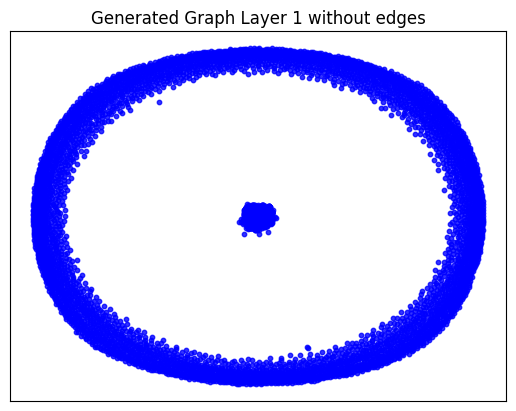

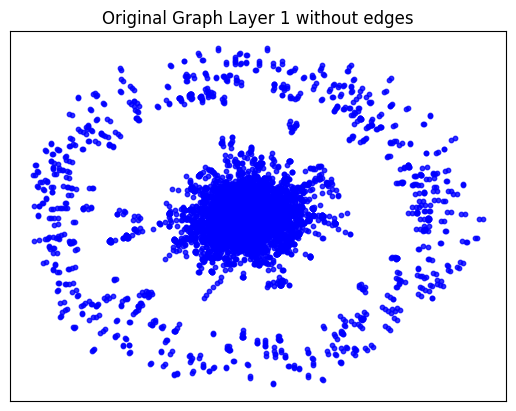

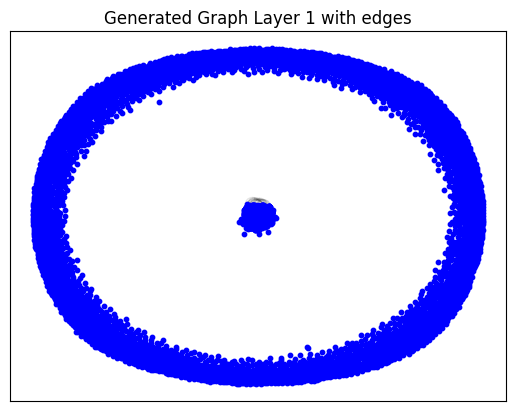

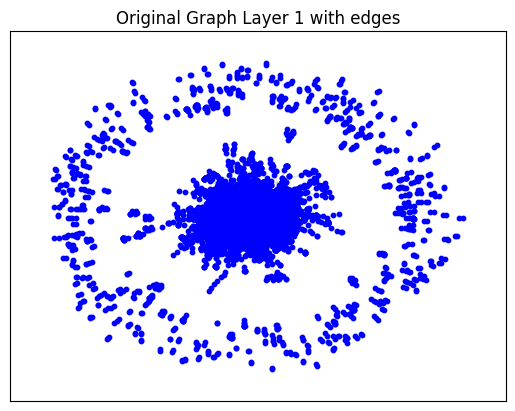

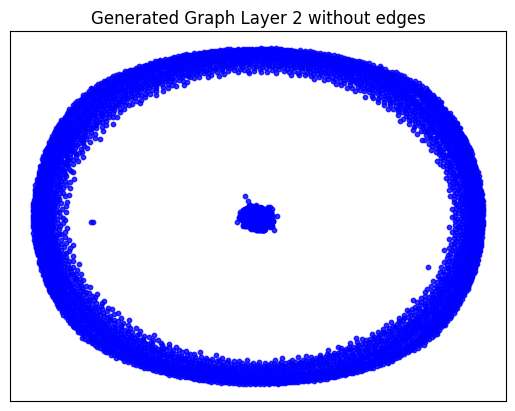

...

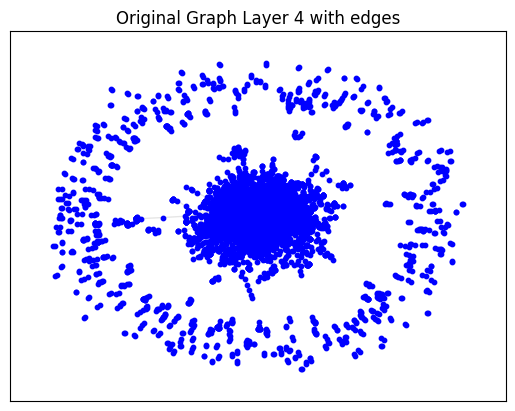

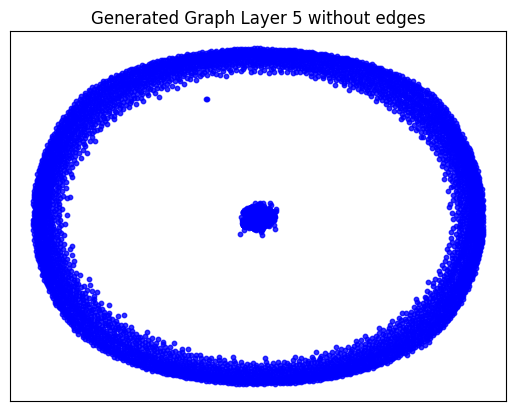

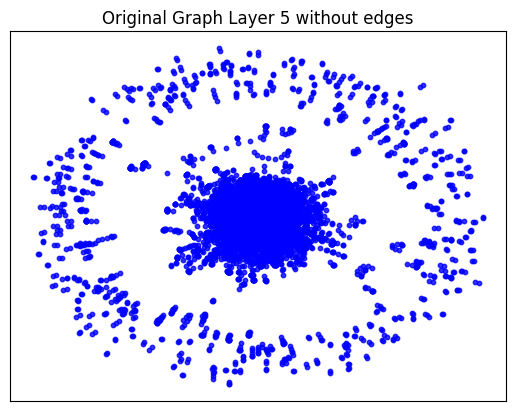

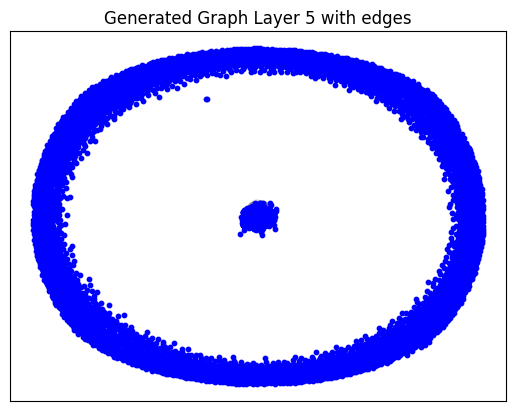

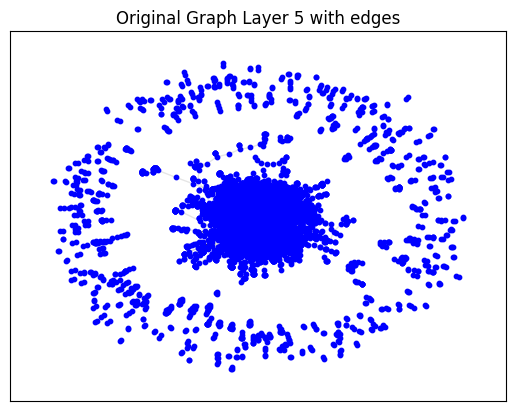

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_1.
Flag learning_rate not found. Continuing...
Flag epochs not found. Continuing...
Flag hidden1 not found. Continuing...
Flag hidden2 not found. Continuing...
Flag weight_decay not found. Continuing...
Flag dropout not found. Continuing...
Flag filename not found. Continuing...
Flag model not found. Continuing...
Flag dataset not found. Continuing...
Flag features not found. Continuing...
Flag f not found. Continuing...


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
targets is deprecated, use labels instead


GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.035788536071777344 seconds to compute statistics_degrees ---
--- 1.6438193321228027 seconds to compute statistics_LCC ---
--- 0.04748988151550293 seconds to compute statistics_wedge_count ---
--- 0.04852867126464844 seconds to compute statistics_claw_count ---
--- 0.2525370121002197 seconds to compute statistics_triangle_count ---
--- 0.03825640678405762 seconds to compute statistics_power_law_alpha ---
--- 0.0380861759185791 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.18389606475830078 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05266547203063965 seconds to compute degree_assortativity_coefficient ---
--- 0.8150866031646729 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 322, 'd_min': 0, 'd': 1.235759021771548, 'LCC': 1529, 'wedge_count': 186812.0, 'claw_count': 9471402.0, 'triangle_count': 7669, 'power_law_exp': 2.3300337390065664, 'gini': 0.9293129087916707, 'rel_edge_distr_entropy': 0.7028091191921845, 'assortativity': -0.2814285458981556, 'clustering_coefficient': 0.002429101837299272, 'n_components': 5178}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 5.6852208744406055e-05
KL divergence between original network and the network generated by Random E-R: 6.199677646987093
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.0009298024711012947
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.1652149532329372
KL divergence between original network and the network generated by Random E-R: 11.76314005479509
KL divergence between original network and the network generated by Random B-A: 1.899809586672859
KL divergence between original network and the network generated by GAE: 33.51984233930668


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Second batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_2.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_2'
args.filename = 'pubmed_2_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_2'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 11.7730
Epoch: [ 2] time: 11.9495
Epoch: [ 3] time: 12.1250
Epoch: [ 4] time: 12.3023
Epoch: [ 5] time: 12.4786
Epoch: [ 6] time: 12.6543
Epoch: [ 7] time: 12.8310
Epoch: [ 8] time: 13.0085
Epoch: [ 9] time: 13.1857
Epoch: [10] time: 13.3612
Epoch: [11] time: 13.5376
Epoch: [12] time: 13.7163
Epoch: [13] time: 13.8935
Epoch: [14] time: 14.0686
Epoch: [15] time: 14.2455
Epoch: [16] time: 14.4215
Epoch: [17] time: 14.5971
Epoch: [18] time: 14.7724
Epoch: [19] time: 14.9490
Epoch: [20] time: 15.1237
Epoch: [21] time: 15.2994
Epoch: [22] time: 15.4746
Epoch: [23] time: 15.6506
Epoch: [24] time: 15.8261
Epoch: [25] time: 16.0016
Epoch: [26] time: 16.1758
Epoch: [27] time: 16.3507
Epoch: [28] time: 16.5920
Epoch: [29] time: 16.7657
Epoch: [30] time: 16.9392
Epoch: [31] time: 17.1131
Epoch: [32] time: 17.2874
Epoch: [33] time: 17.4608
Epoch: [34] time: 17.6350
Epoch: [35] time: 17.8088
Epoch: [36] time: 17.9820
Epoch: [37] time: 18.1564
Epoch: [38] 

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-51-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6178, 48])
Shape of h_subset: torch.Size([357, 48])
Shape of idx: torch.Size([357])
Shape of new_h before assignment: torch.Size([6178, 48])
Shape of h_subset: torch.Size([285, 48])
Shape of idx: torch.Size([285])
Shape of new_h before assignment: torch.Size([6178, 48])
Shape of h_subset: torch.Size([199, 48])
Shape of idx: torch.Size([199])
Computing metrics for original graph
--- 0.030501127243041992 seconds to compute statistics_degrees ---
--- 1.294179916381836 seconds to compute statistics_LCC ---
--- 0.04140949249267578 seconds to compute statistics_wedge_count ---
--- 0.04326152801513672 seconds to compute statistics_claw_count ---
--- 0.24626779556274414 seconds to compute statistics_triangle_count ---
--- 0.032125234603881836 seconds to compute statistics_power_law_alpha ---
--- 0.032613515853881836 seconds to compute statistics_gini ---
--- 0.15074753761291504 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05678

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6649706363677979 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 120.0, 'd_min': 0.0, 'd': 2.4268372, 'LCC': 1996, 'wedge_count': 202353.0, 'claw_count': 3368685.0, 'triangle_count': 13202, 'power_law_exp': 1.5910715863126699, 'gini': 0.8998498964996657, 'rel_edge_distr_entropy': 0.7667267380754571, 'assortativity': -0.2081204384589507, 'clustering_coefficient': 0.011757109970210927, 'n_components': 4155}


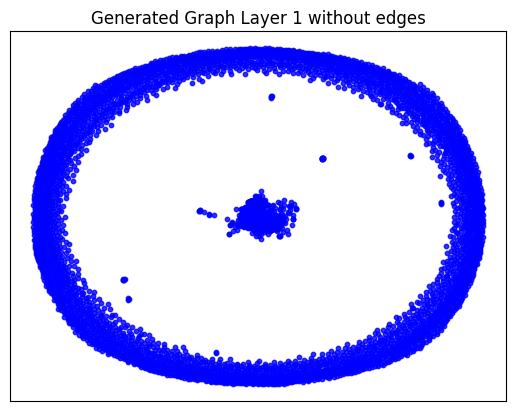

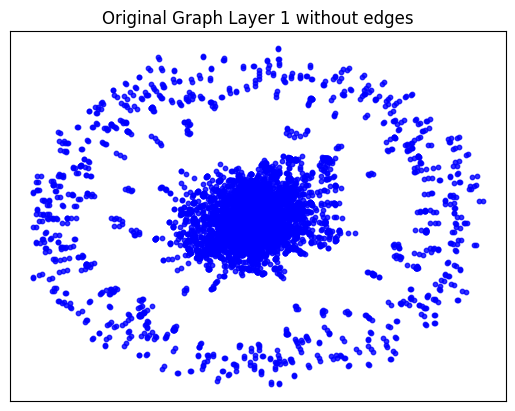

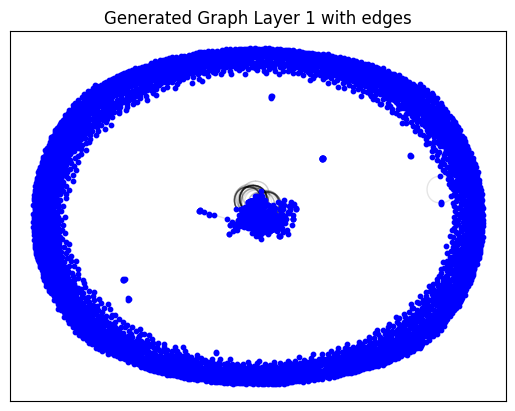

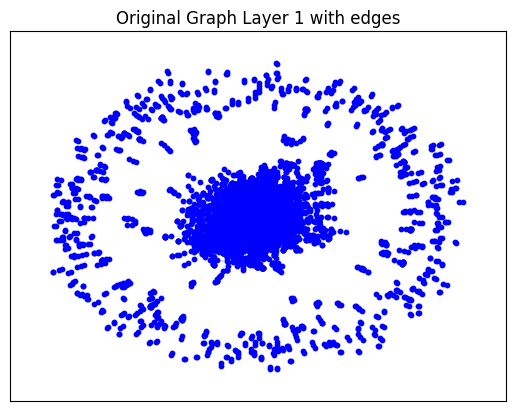

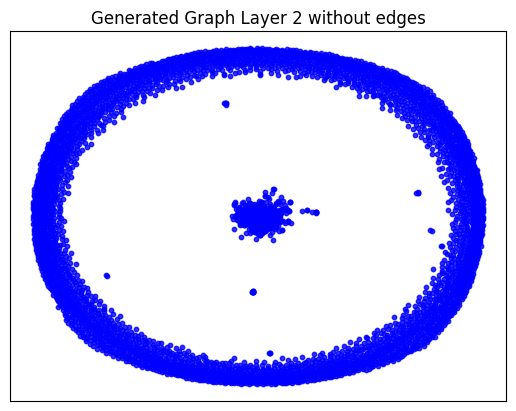

...

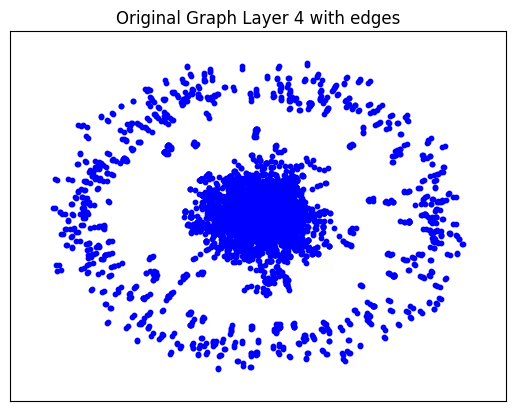

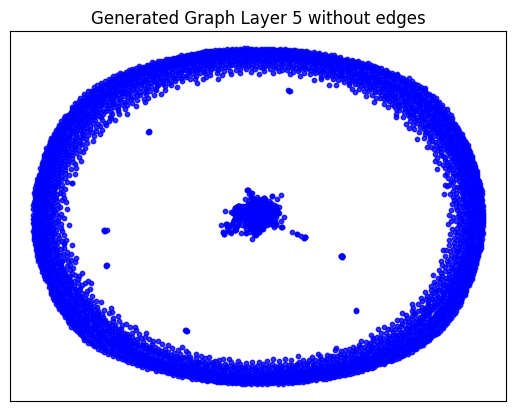

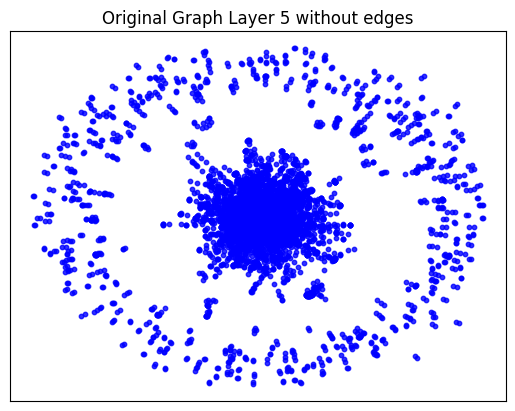

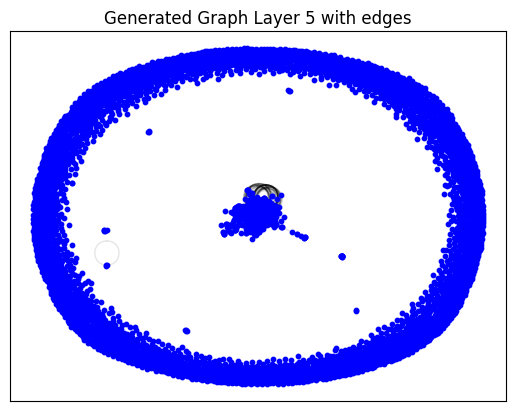

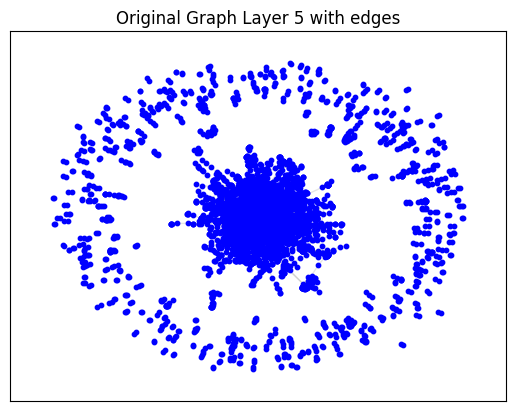

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_2.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.029532432556152344 seconds to compute statistics_degrees ---
--- 1.2714338302612305 seconds to compute statistics_LCC ---
--- 0.04081368446350098 seconds to compute statistics_wedge_count ---
--- 0.041921138763427734 seconds to compute statistics_claw_count ---
--- 0.21270513534545898 seconds to compute statistics_triangle_count ---
--- 0.030838966369628906 seconds to compute statistics_power_law_alpha ---
--- 0.031195640563964844 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14526605606079102 seconds to compute statistics_edge_distribution_entropy ---
--- 0.048099517822265625 seconds to compute degree_assortativity_coefficient ---
--- 0.6341195106506348 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 215, 'd_min': 0, 'd': 1.266062469655284, 'LCC': 1291, 'wedge_count': 181459.0, 'claw_count': 6990978.0, 'triangle_count': 12892, 'power_law_exp': 2.2557444237157434, 'gini': 0.9394615042141412, 'rel_edge_distr_entropy': 0.6849502183266911, 'assortativity': -0.31901737121777934, 'clustering_coefficient': 0.005532273166930292, 'n_components': 4889}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 1.1004231975130248
KL divergence between original network and the network generated by Random E-R: 6.395305987573299
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.04025266038738458
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 0.5352763073337705
KL divergence between original network and the network generated by Random E-R: 3.2624217567388634
KL divergence between original network and the network generated by Random B-A: 2.083552919519466
KL divergence between original network and the network generated by GAE: 28.891401535895525


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Third batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_3.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_3'
args.filename = 'pubmed_3_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_3'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 12.0546
Epoch: [ 2] time: 12.3993
Epoch: [ 3] time: 12.7436
Epoch: [ 4] time: 13.0885
Epoch: [ 5] time: 13.4329
Epoch: [ 6] time: 13.7776
Epoch: [ 7] time: 14.1225
Epoch: [ 8] time: 14.4673
Epoch: [ 9] time: 14.8122
Epoch: [10] time: 15.1568
Epoch: [11] time: 15.5012
Epoch: [12] time: 15.8454
Epoch: [13] time: 16.1904
Epoch: [14] time: 16.5360
Epoch: [15] time: 16.8802
Epoch: [16] time: 17.2253
Epoch: [17] time: 17.5700
Epoch: [18] time: 17.9146
Epoch: [19] time: 18.2599
Epoch: [20] time: 18.6054
Epoch: [21] time: 18.9499
Epoch: [22] time: 19.2944
Epoch: [23] time: 19.6390
Epoch: [24] time: 19.9835
Epoch: [25] time: 20.3360
Epoch: [26] time: 20.6810
Epoch: [27] time: 21.0254
Epoch: [28] time: 21.3702
Epoch: [29] time: 21.7145
Epoch: [30] time: 22.0595
Epoch: [31] time: 22.4041
Epoch: [32] time: 22.7490
Epoch: [33] time: 23.0936
Epoch: [34] time: 23.4379
Epoch: [35] time: 23.7820
Epoch: [36] time: 24.1261
Epoch: [37] time: 24.4711
Epoch: [38] 

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-51-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6248, 48])
Shape of h_subset: torch.Size([360, 48])
Shape of idx: torch.Size([360])
Shape of new_h before assignment: torch.Size([6248, 48])
Shape of h_subset: torch.Size([288, 48])
Shape of idx: torch.Size([288])
Shape of new_h before assignment: torch.Size([6248, 48])
Shape of h_subset: torch.Size([201, 48])
Shape of idx: torch.Size([201])
Computing metrics for original graph
--- 0.03161501884460449 seconds to compute statistics_degrees ---
--- 1.3247284889221191 seconds to compute statistics_LCC ---
--- 0.04212498664855957 seconds to compute statistics_wedge_count ---
--- 0.043790340423583984 seconds to compute statistics_claw_count ---
--- 0.25019001960754395 seconds to compute statistics_triangle_count ---
--- 0.0333096981048584 seconds to compute statistics_power_law_alpha ---
--- 0.0336155891418457 seconds to compute statistics_gini ---
--- 0.1577470302581787 seconds to compute statistics_edge_distribution_entropy ---
--- 0.060819387

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6743533611297607 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 72.0, 'd_min': 0.0, 'd': 2.397407, 'LCC': 2564, 'wedge_count': 208629.0, 'claw_count': 3009669.0, 'triangle_count': 20385, 'power_law_exp': 1.7190804141351643, 'gini': 0.8965337323725686, 'rel_edge_distr_entropy': 0.768353851983946, 'assortativity': 0.243663873103765, 'clustering_coefficient': 0.020319510218565564, 'n_components': 3629}


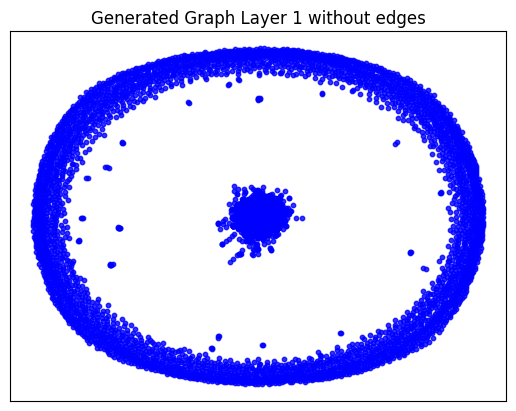

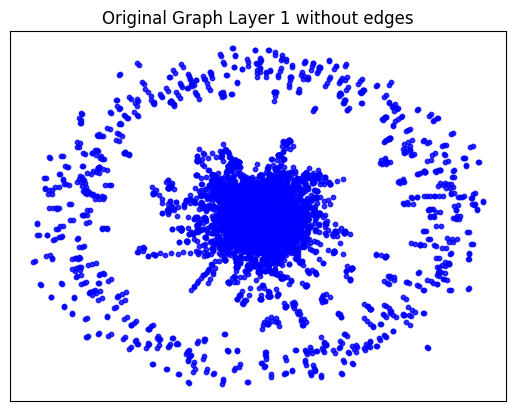

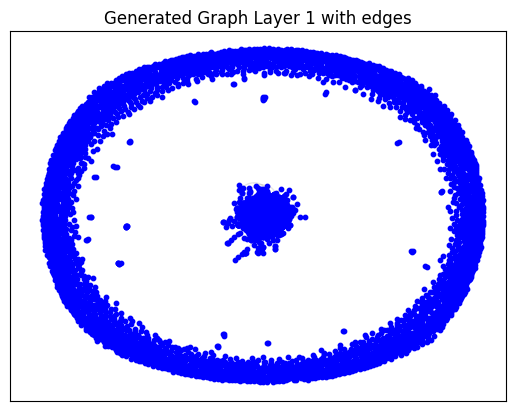

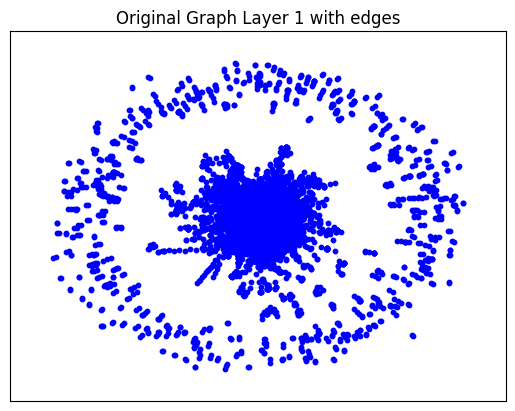

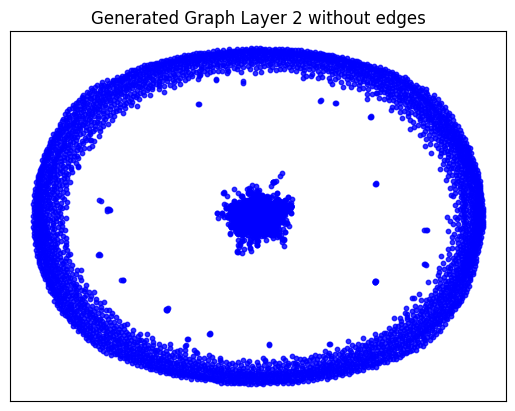

...

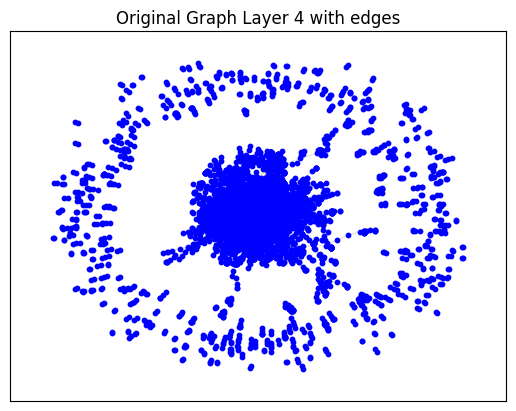

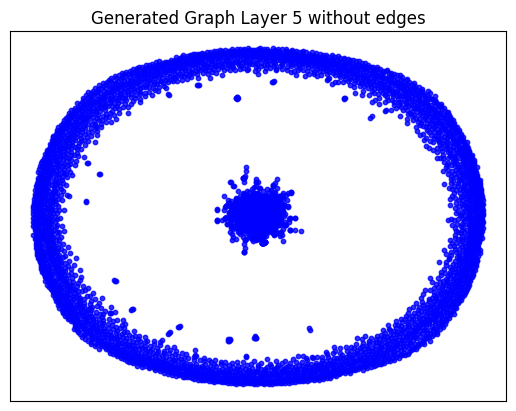

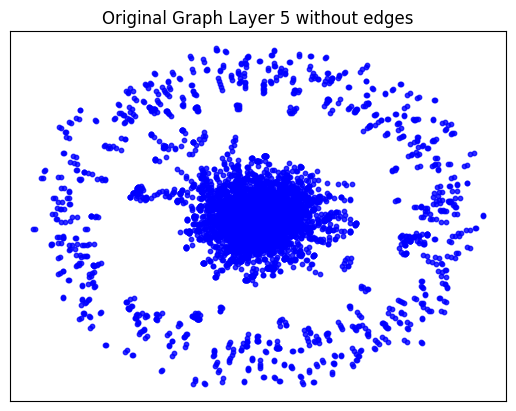

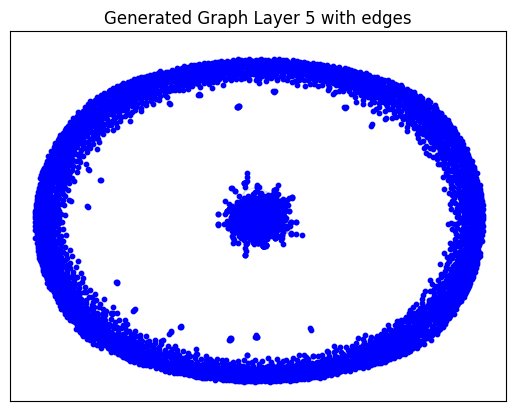

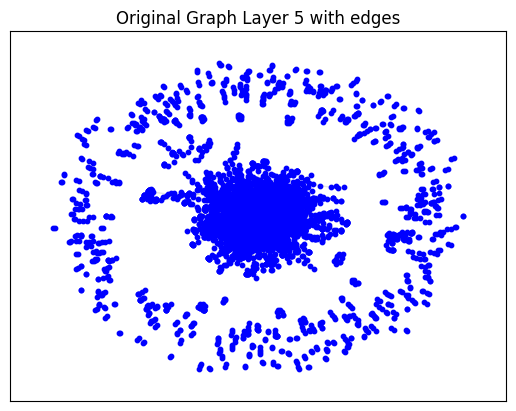

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_3.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.03209733963012695 seconds to compute statistics_degrees ---
--- 1.288724660873413 seconds to compute statistics_LCC ---
--- 0.04198813438415527 seconds to compute statistics_wedge_count ---
--- 0.04378795623779297 seconds to compute statistics_claw_count ---
--- 0.22231698036193848 seconds to compute statistics_triangle_count ---
--- 0.03335142135620117 seconds to compute statistics_power_law_alpha ---
--- 0.03322649002075195 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15784049034118652 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05467557907104492 seconds to compute degree_assortativity_coefficient ---
--- 0.6539037227630615 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 153, 'd_min': 0, 'd': 1.247559609537526, 'LCC': 1287, 'wedge_count': 136063.0, 'claw_count': 3317776.0, 'triangle_count': 9805, 'power_law_exp': 2.1878221935090347, 'gini': 0.9363860865249984, 'rel_edge_distr_entropy': 0.6985332770030933, 'assortativity': -0.3528992925344151, 'clustering_coefficient': 0.008865878829673855, 'n_components': 4960}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.7393945236438547
KL divergence between original network and the network generated by Random E-R: 5.369674052357535
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 1.6685792236665113
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.0910424534346714
KL divergence between original network and the network generated by Random E-R: 50.91153901293955
KL divergence between original network and the network generated by Random B-A: 1.927119940167127
KL divergence between original network and the network generated by GAE: 35.88592955841357


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Fourth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_4.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_4'
args.filename = 'pubmed_4_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_4'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 12.1460
Epoch: [ 2] time: 12.4999
Epoch: [ 3] time: 12.8544
Epoch: [ 4] time: 13.2078
Epoch: [ 5] time: 13.5610
Epoch: [ 6] time: 13.9147
Epoch: [ 7] time: 14.2688
Epoch: [ 8] time: 14.6225
Epoch: [ 9] time: 14.9762
Epoch: [10] time: 15.3297
Epoch: [11] time: 15.6832
Epoch: [12] time: 16.0370
Epoch: [13] time: 16.3906
Epoch: [14] time: 16.7438
Epoch: [15] time: 17.0975
Epoch: [16] time: 17.4515
Epoch: [17] time: 17.8054
Epoch: [18] time: 18.1591
Epoch: [19] time: 18.5131
Epoch: [20] time: 18.8769
Epoch: [21] time: 19.2373
Epoch: [22] time: 19.6007
Epoch: [23] time: 19.9548
Epoch: [24] time: 20.3084
Epoch: [25] time: 20.6620
Epoch: [26] time: 21.0156
Epoch: [27] time: 21.3696
Epoch: [28] time: 21.7234
Epoch: [29] time: 22.0769
Epoch: [30] time: 22.4306
Epoch: [31] time: 22.7846
Epoch: [32] time: 23.1388
Epoch: [33] time: 23.4928
Epoch: [34] time: 23.8460
Epoch: [35] time: 24.1992
Epoch: [36] time: 24.5527
Epoch: [37] time: 24.9066
Epoch: [38] 

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-51-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6376, 48])
Shape of h_subset: torch.Size([368, 48])
Shape of idx: torch.Size([368])
Shape of new_h before assignment: torch.Size([6376, 48])
Shape of h_subset: torch.Size([294, 48])
Shape of idx: torch.Size([294])
Shape of new_h before assignment: torch.Size([6376, 48])
Shape of h_subset: torch.Size([205, 48])
Shape of idx: torch.Size([205])
Computing metrics for original graph
--- 0.031844377517700195 seconds to compute statistics_degrees ---
--- 1.3706538677215576 seconds to compute statistics_LCC ---
--- 0.042540788650512695 seconds to compute statistics_wedge_count ---
--- 0.04404091835021973 seconds to compute statistics_claw_count ---
--- 0.25784945487976074 seconds to compute statistics_triangle_count ---
--- 0.03297781944274902 seconds to compute statistics_power_law_alpha ---
--- 0.03374147415161133 seconds to compute statistics_gini ---
--- 0.15890884399414062 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05962

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07752799987792969 seconds to compute degree_assortativity_coefficient ---
--- 0.70383620262146 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 116.0, 'd_min': 0.0, 'd': 2.364492, 'LCC': 2392, 'wedge_count': 207972.0, 'claw_count': 3112445.0, 'triangle_count': 2762, 'power_law_exp': 1.578430781476987, 'gini': 0.9100741729149473, 'rel_edge_distr_entropy': 0.756742632924288, 'assortativity': -0.0752792366781225, 'clustering_coefficient': 0.002662215717868107, 'n_components': 3966}


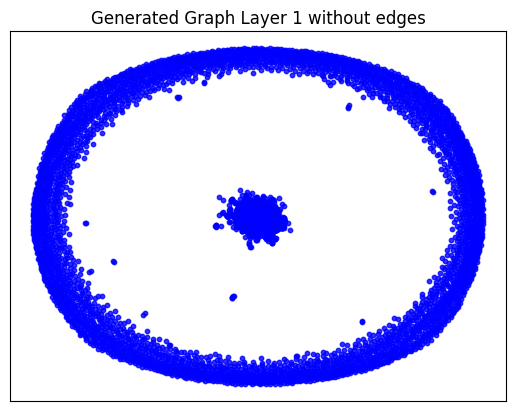

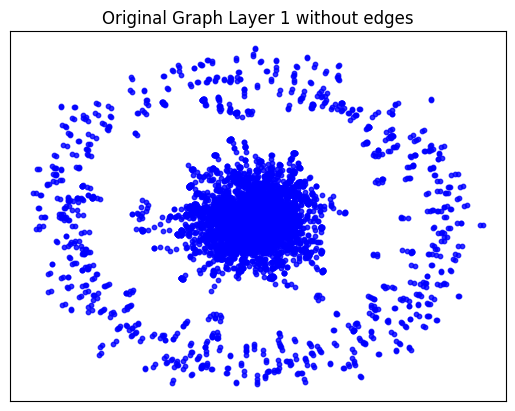

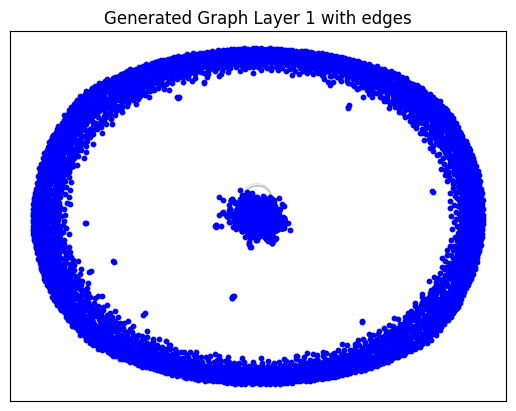

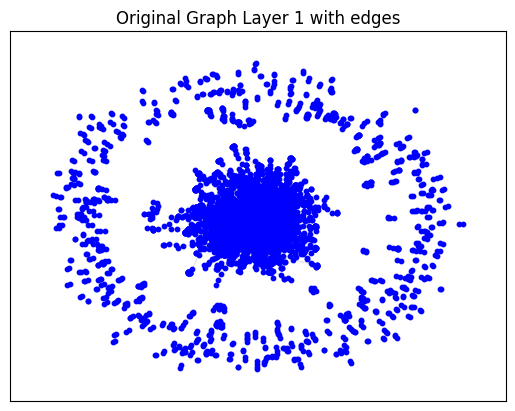

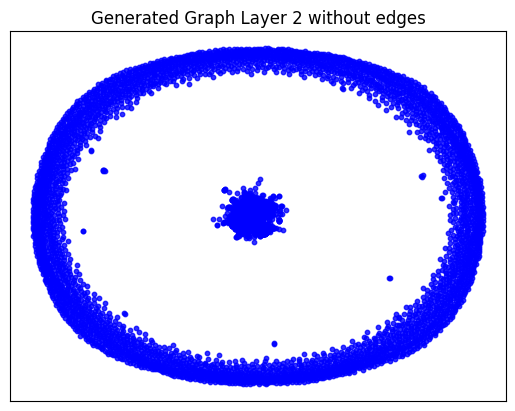

...

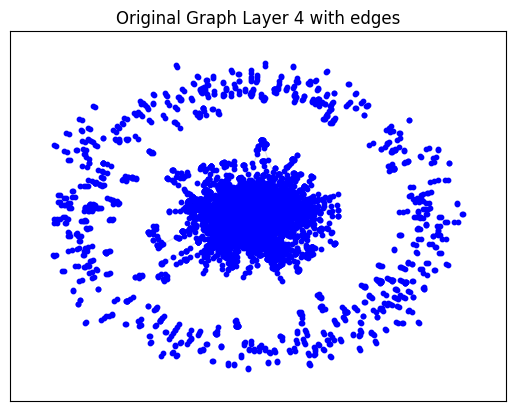

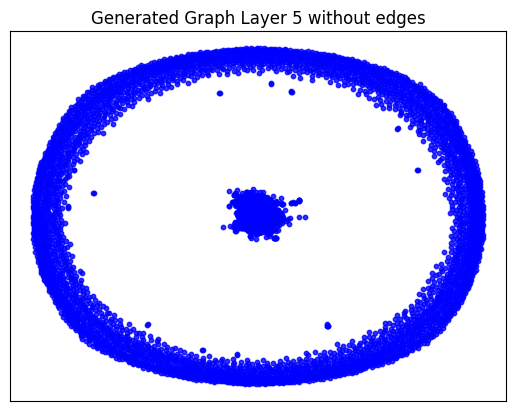

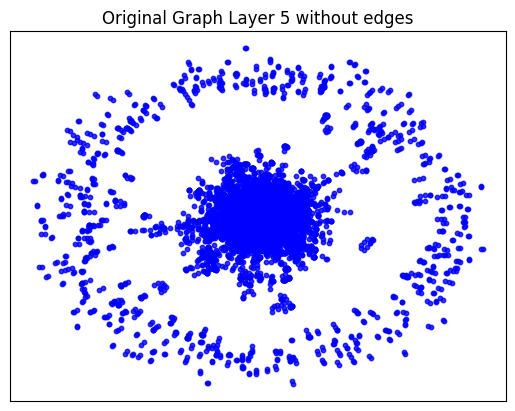

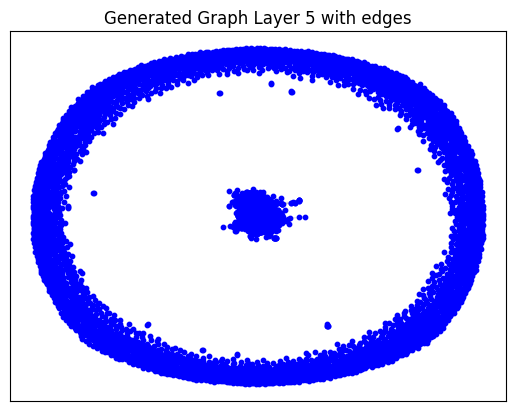

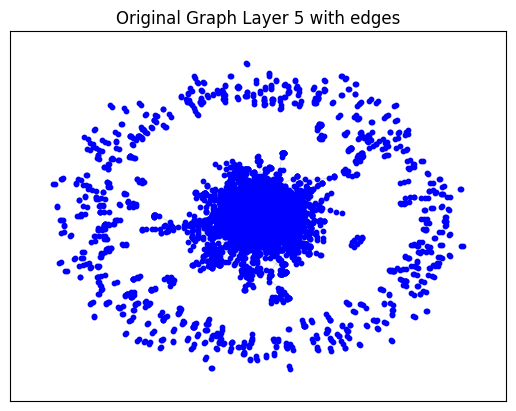

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_4.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.0325007438659668 seconds to compute statistics_degrees ---
--- 1.3707897663116455 seconds to compute statistics_LCC ---
--- 0.0448911190032959 seconds to compute statistics_wedge_count ---
--- 0.044960737228393555 seconds to compute statistics_claw_count ---
--- 0.2298128604888916 seconds to compute statistics_triangle_count ---
--- 0.035246849060058594 seconds to compute statistics_power_law_alpha ---
--- 0.03405928611755371 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1619892120361328 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05025339126586914 seconds to compute degree_assortativity_coefficient ---
--- 0.7142372131347656 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 190, 'd_min': 0, 'd': 1.228163713344833, 'LCC': 1308, 'wedge_count': 148557.0, 'claw_count': 4537627.0, 'triangle_count': 9438, 'power_law_exp': 2.1925766996611653, 'gini': 0.9361364809662149, 'rel_edge_distr_entropy': 0.6968399235473551, 'assortativity': -0.30470440925712, 'clustering_coefficient': 0.006239825353648504, 'n_components': 5069}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:48: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by it

KL divergence between original network and the network generated by Music_GAN: 0.7126450546351899
KL divergence between original network and the network generated by Random E-R: 5.2546809801107095
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 1.9039894991803612
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.9512436914916482
KL divergence between original network and the network generated by Random E-R: 3.7292064309613138
KL divergence between original network and the network generated by Random B-A: 1.9842375286822183
KL divergence between original network and the network generated by GAE: 44.21664026488621


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Fifth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_5.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_5'
args.filename = 'pubmed_5_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_5'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 6.8323
Epoch: [ 2] time: 7.1752
Epoch: [ 3] time: 7.5175
Epoch: [ 4] time: 7.8591
Epoch: [ 5] time: 8.2019
Epoch: [ 6] time: 8.5451
Epoch: [ 7] time: 8.8875
Epoch: [ 8] time: 9.2302
Epoch: [ 9] time: 9.5728
Epoch: [10] time: 9.9150
Epoch: [11] time: 10.2576
Epoch: [12] time: 10.5999
Epoch: [13] time: 10.9430
Epoch: [14] time: 11.2855
Epoch: [15] time: 11.6280
Epoch: [16] time: 11.9711
Epoch: [17] time: 12.3134
Epoch: [18] time: 12.6563
Epoch: [19] time: 12.9979
Epoch: [20] time: 13.3405
Epoch: [21] time: 13.6837
Epoch: [22] time: 14.0272
Epoch: [23] time: 14.3759
Epoch: [24] time: 14.7190
Epoch: [25] time: 15.0613
Epoch: [26] time: 15.4043
Epoch: [27] time: 15.7466
Epoch: [28] time: 16.0894
Epoch: [29] time: 16.4322
Epoch: [30] time: 16.7743
Epoch: [31] time: 17.1171
Epoch: [32] time: 17.4592
Epoch: [33] time: 17.8015
Epoch: [34] time: 18.1440
Epoch: [35] time: 18.4859
Epoch: [36] time: 18.8284
Epoch: [37] time: 19.1709
Epoch: [38] time: 19.5

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-51-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6248, 48])
Shape of h_subset: torch.Size([360, 48])
Shape of idx: torch.Size([360])
Shape of new_h before assignment: torch.Size([6248, 48])
Shape of h_subset: torch.Size([288, 48])
Shape of idx: torch.Size([288])
Shape of new_h before assignment: torch.Size([6248, 48])
Shape of h_subset: torch.Size([201, 48])
Shape of idx: torch.Size([201])
Computing metrics for original graph
--- 0.02941107749938965 seconds to compute statistics_degrees ---
--- 1.2953999042510986 seconds to compute statistics_LCC ---
--- 0.04034018516540527 seconds to compute statistics_wedge_count ---
--- 0.04178738594055176 seconds to compute statistics_claw_count ---
--- 0.2401905059814453 seconds to compute statistics_triangle_count ---
--- 0.030573368072509766 seconds to compute statistics_power_law_alpha ---
--- 0.030994892120361328 seconds to compute statistics_gini ---
--- 0.1512155532836914 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0563113

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6611330509185791 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 170.0, 'd_min': 0.0, 'd': 2.4033291, 'LCC': 2048, 'wedge_count': 306059.0, 'claw_count': 8777230.0, 'triangle_count': 6181, 'power_law_exp': 1.6300510590104285, 'gini': 0.9175029349828812, 'rel_edge_distr_entropy': 0.7402212226315851, 'assortativity': -0.23842509708466023, 'clustering_coefficient': 0.0021126255094147013, 'n_components': 4147}


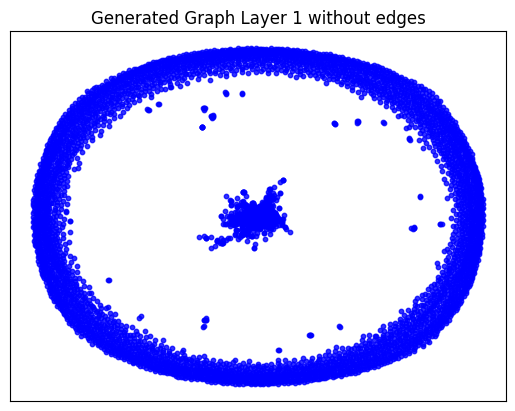

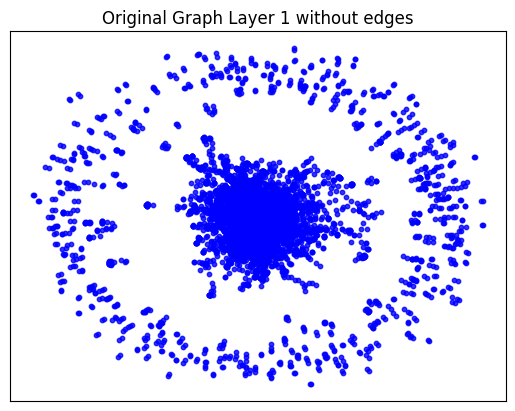

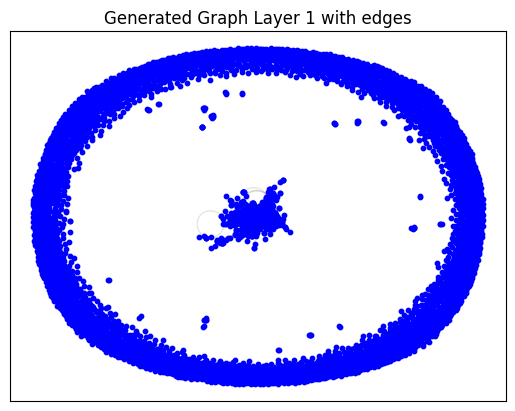

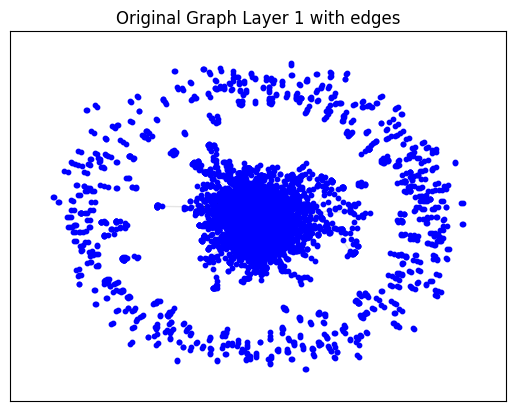

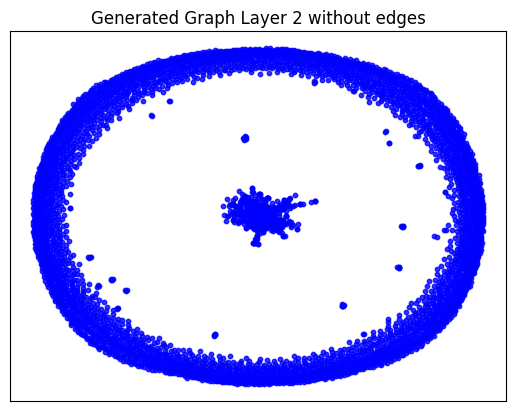

...

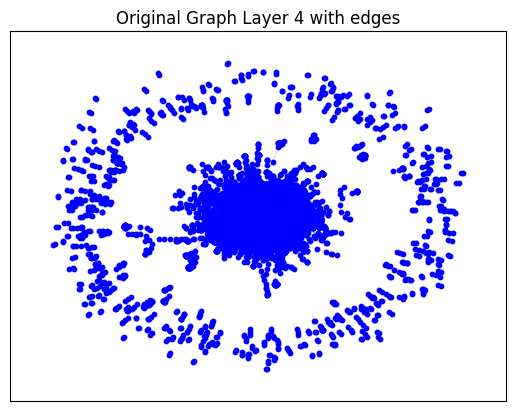

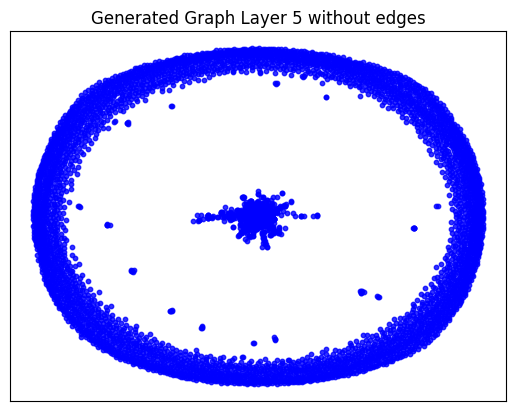

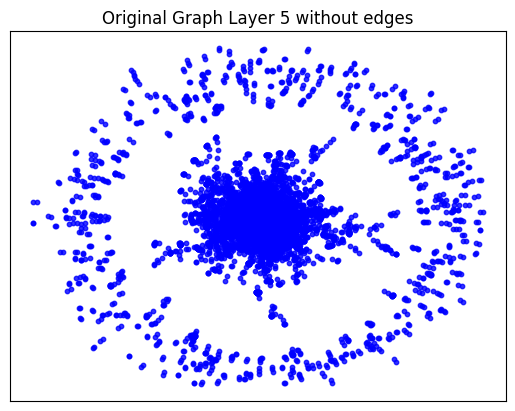

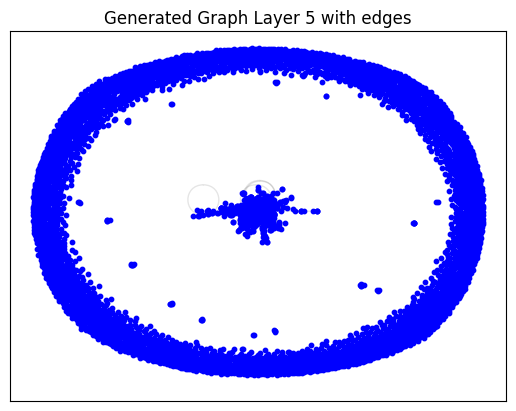

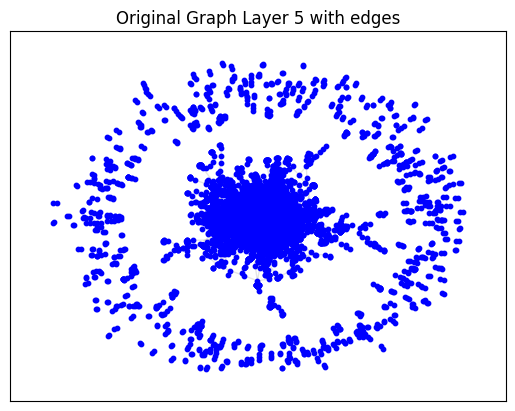

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_5.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.02982497215270996 seconds to compute statistics_degrees ---
--- 1.323671817779541 seconds to compute statistics_LCC ---
--- 0.0406951904296875 seconds to compute statistics_wedge_count ---
--- 0.04195713996887207 seconds to compute statistics_claw_count ---
--- 0.2179548740386963 seconds to compute statistics_triangle_count ---
--- 0.03200674057006836 seconds to compute statistics_power_law_alpha ---
--- 0.032114267349243164 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15276265144348145 seconds to compute statistics_edge_distribution_entropy ---
--- 0.049176692962646484 seconds to compute degree_assortativity_coefficient ---
--- 0.653639554977417 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 178, 'd_min': 0, 'd': 1.2506000960153625, 'LCC': 1032, 'wedge_count': 152184.0, 'claw_count': 4100742.0, 'triangle_count': 13325, 'power_law_exp': 1.979084393346398, 'gini': 0.9488387188655241, 'rel_edge_distr_entropy': 0.6795025332482563, 'assortativity': -0.25231974696170184, 'clustering_coefficient': 0.009748235807080768, 'n_components': 5213}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 1.378388680262548
KL divergence between original network and the network generated by Random E-R: 5.212153744419668
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 1.4463804410798944
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.2708333986415092
KL divergence between original network and the network generated by Random E-R: 9.989761839668526
KL divergence between original network and the network generated by Random B-A: 1.9791393276401243
KL divergence between original network and the network generated by GAE: 26.23316221883739


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Sixth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_6.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_6'
args.filename = 'pubmed_6_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_6'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.0759
Epoch: [ 2] time: 10.4013
Epoch: [ 3] time: 10.7255
Epoch: [ 4] time: 11.0519
Epoch: [ 5] time: 11.3772
Epoch: [ 6] time: 11.7018
Epoch: [ 7] time: 12.0260
Epoch: [ 8] time: 12.3501
Epoch: [ 9] time: 12.6737
Epoch: [10] time: 12.9976
Epoch: [11] time: 13.3213
Epoch: [12] time: 13.6440
Epoch: [13] time: 13.9673
Epoch: [14] time: 14.2933
Epoch: [15] time: 14.6187
Epoch: [16] time: 14.9424
Epoch: [17] time: 15.2661
Epoch: [18] time: 15.5893
Epoch: [19] time: 15.9128
Epoch: [20] time: 16.2369
Epoch: [21] time: 16.5611
Epoch: [22] time: 16.8842
Epoch: [23] time: 17.2087
Epoch: [24] time: 17.5334
Epoch: [25] time: 17.8573
Epoch: [26] time: 18.1807
Epoch: [27] time: 18.5039
Epoch: [28] time: 18.8278
Epoch: [29] time: 19.1517
Epoch: [30] time: 19.4751
Epoch: [31] time: 19.7982
Epoch: [32] time: 20.1225
Epoch: [33] time: 20.4461
Epoch: [34] time: 20.7695
Epoch: [35] time: 21.0931
Epoch: [36] time: 21.4169
Epoch: [37] time: 21.7403
Epoch: [38] 

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-51-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6130, 48])
Shape of h_subset: torch.Size([354, 48])
Shape of idx: torch.Size([354])
Shape of new_h before assignment: torch.Size([6130, 48])
Shape of h_subset: torch.Size([283, 48])
Shape of idx: torch.Size([283])
Shape of new_h before assignment: torch.Size([6130, 48])
Shape of h_subset: torch.Size([198, 48])
Shape of idx: torch.Size([198])
Computing metrics for original graph
--- 0.027884960174560547 seconds to compute statistics_degrees ---
--- 1.2416253089904785 seconds to compute statistics_LCC ---
--- 0.03833436965942383 seconds to compute statistics_wedge_count ---
--- 0.039850711822509766 seconds to compute statistics_claw_count ---
--- 0.22839808464050293 seconds to compute statistics_triangle_count ---
--- 0.029712677001953125 seconds to compute statistics_power_law_alpha ---
--- 0.029407978057861328 seconds to compute statistics_gini ---
--- 0.14366841316223145 seconds to compute statistics_edge_distribution_entropy ---
--- 0.054

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6395964622497559 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 218.0, 'd_min': 0.0, 'd': 2.3848288, 'LCC': 2395, 'wedge_count': 393304.0, 'claw_count': 18948293.0, 'triangle_count': 4007, 'power_law_exp': 1.7756037730069796, 'gini': 0.8998846614837983, 'rel_edge_distr_entropy': 0.7462660748478115, 'assortativity': -0.26129377378659624, 'clustering_coefficient': 0.0006344107091863103, 'n_components': 3701}


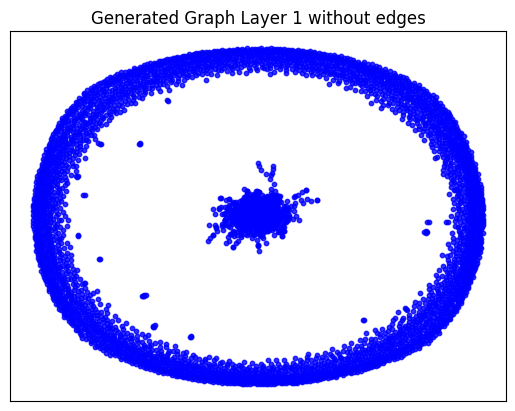

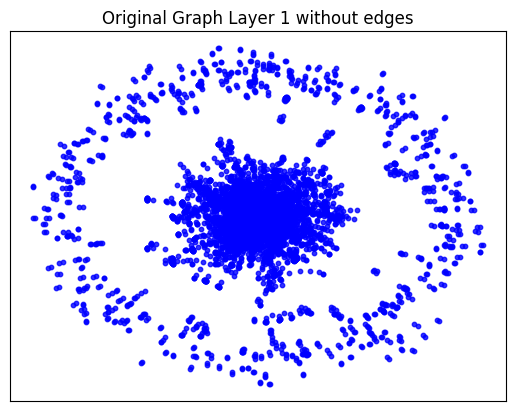

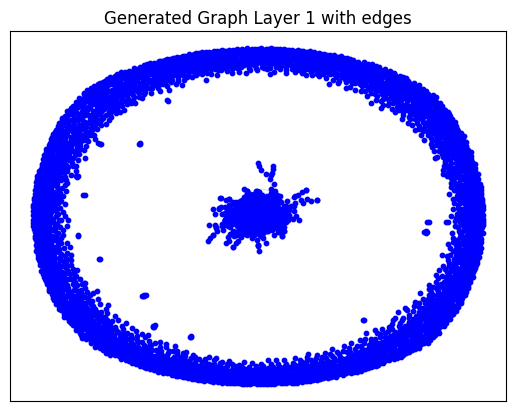

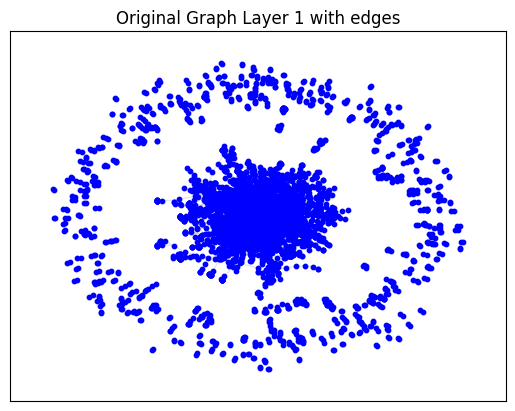

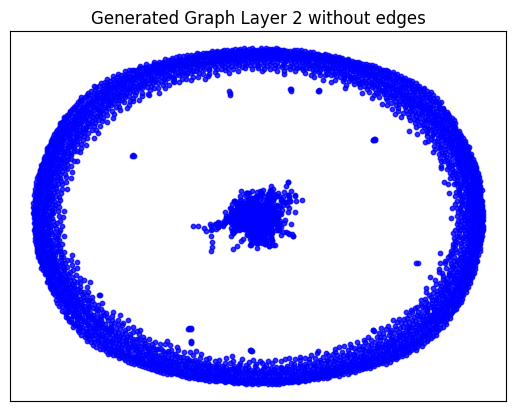

...

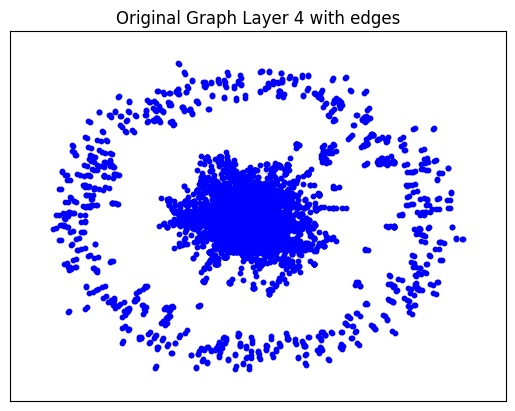

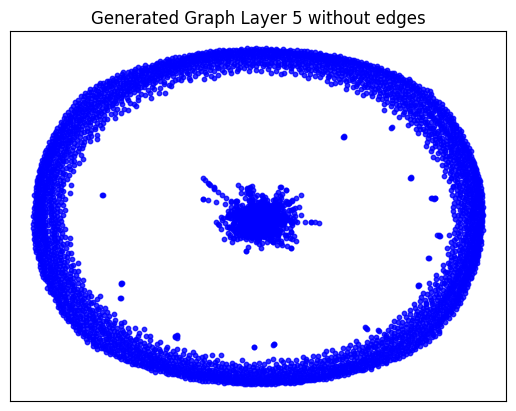

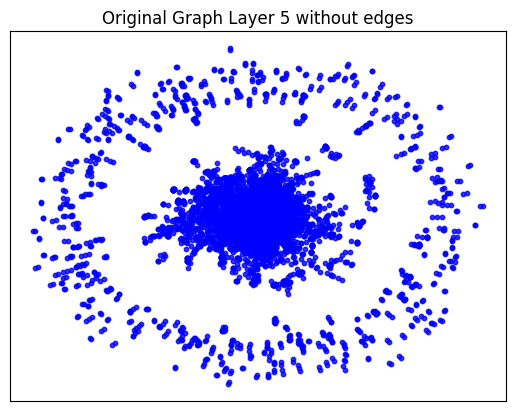

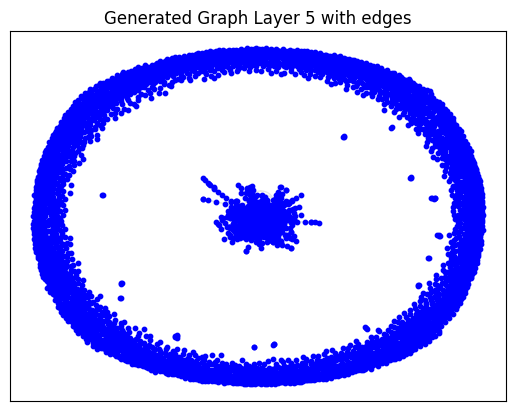

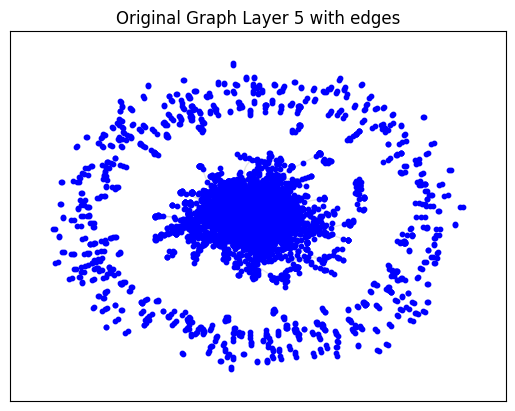

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_6.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.02904367446899414 seconds to compute statistics_degrees ---
--- 1.247572660446167 seconds to compute statistics_LCC ---
--- 0.04051780700683594 seconds to compute statistics_wedge_count ---
--- 0.04146528244018555 seconds to compute statistics_claw_count ---
--- 0.2089705467224121 seconds to compute statistics_triangle_count ---
--- 0.03195691108703613 seconds to compute statistics_power_law_alpha ---
--- 0.0312802791595459 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14598321914672852 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04767012596130371 seconds to compute degree_assortativity_coefficient ---
--- 0.623837947845459 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 138, 'd_min': 0, 'd': 1.2435165552112217, 'LCC': 907, 'wedge_count': 150640.0, 'claw_count': 3769629.0, 'triangle_count': 14682, 'power_law_exp': 1.9061533631898855, 'gini': 0.9531103693869576, 'rel_edge_distr_entropy': 0.671236569013935, 'assortativity': -0.27733706193426266, 'clustering_coefficient': 0.011684438972641605, 'n_components': 5221}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.9413840350321407
KL divergence between original network and the network generated by Random E-R: 5.618907830537719
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.0468925903097963
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.90872088191873
KL divergence between original network and the network generated by Random E-R: 12.647277894556481
KL divergence between original network and the network generated by Random B-A: 1.9487344757962908
KL divergence between original network and the network generated by GAE: 37.13707275573397


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Seventh batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_7.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_7'
args.filename = 'pubmed_7_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_7'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.2944
Epoch: [ 2] time: 10.5830
Epoch: [ 3] time: 10.8712
Epoch: [ 4] time: 11.1589
Epoch: [ 5] time: 11.4474
Epoch: [ 6] time: 11.7357
Epoch: [ 7] time: 12.0316
Epoch: [ 8] time: 12.3276
Epoch: [ 9] time: 12.6164
Epoch: [10] time: 12.9055
Epoch: [11] time: 13.1940
Epoch: [12] time: 13.4829
Epoch: [13] time: 13.8260
Epoch: [14] time: 14.1162
Epoch: [15] time: 14.4035
Epoch: [16] time: 14.6914
Epoch: [17] time: 14.9792
Epoch: [18] time: 15.2674
Epoch: [19] time: 15.5551
Epoch: [20] time: 15.8435
Epoch: [21] time: 16.1318
Epoch: [22] time: 16.4207
Epoch: [23] time: 16.7092
Epoch: [24] time: 16.9975
Epoch: [25] time: 17.2854
Epoch: [26] time: 17.5736
Epoch: [27] time: 17.8618
Epoch: [28] time: 18.1501
Epoch: [29] time: 18.4378
Epoch: [30] time: 18.7255
Epoch: [31] time: 19.0125
Epoch: [32] time: 19.3003
Epoch: [33] time: 19.5884
Epoch: [34] time: 19.8762
Epoch: [35] time: 20.1641
Epoch: [36] time: 20.4515
Epoch: [37] time: 20.7391
Epoch: [38] 

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-51-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([5713, 48])
Shape of h_subset: torch.Size([330, 48])
Shape of idx: torch.Size([330])
Shape of new_h before assignment: torch.Size([5713, 48])
Shape of h_subset: torch.Size([264, 48])
Shape of idx: torch.Size([264])
Shape of new_h before assignment: torch.Size([5713, 48])
Shape of h_subset: torch.Size([184, 48])
Shape of idx: torch.Size([184])
Computing metrics for original graph
--- 0.025028228759765625 seconds to compute statistics_degrees ---
--- 1.085723876953125 seconds to compute statistics_LCC ---
--- 0.03529000282287598 seconds to compute statistics_wedge_count ---
--- 0.03641176223754883 seconds to compute statistics_claw_count ---
--- 0.2029571533203125 seconds to compute statistics_triangle_count ---
--- 0.026590585708618164 seconds to compute statistics_power_law_alpha ---
--- 0.027252674102783203 seconds to compute statistics_gini ---
--- 0.12765192985534668 seconds to compute statistics_edge_distribution_entropy ---
--- 0.052864

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5566771030426025 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 72.0, 'd_min': 0.0, 'd': 2.3983896, 'LCC': 2235, 'wedge_count': 158249.0, 'claw_count': 1821877.0, 'triangle_count': 1156, 'power_law_exp': 1.6066052439687364, 'gini': 0.8942470346588456, 'rel_edge_distr_entropy': 0.7727216410623678, 'assortativity': 0.07218893900722514, 'clustering_coefficient': 0.0019035313580444784, 'n_components': 3468}


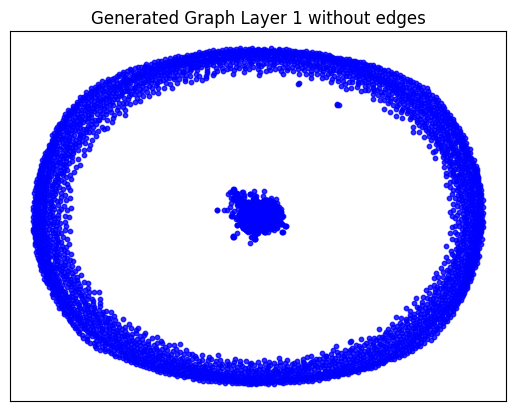

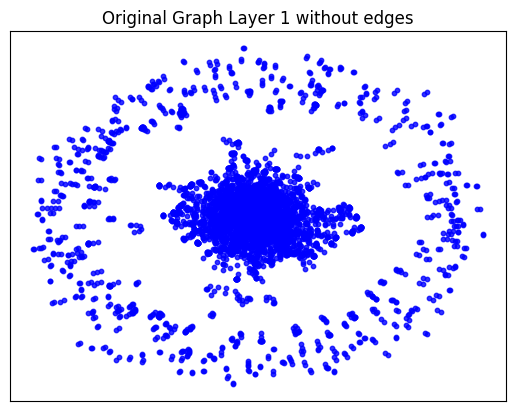

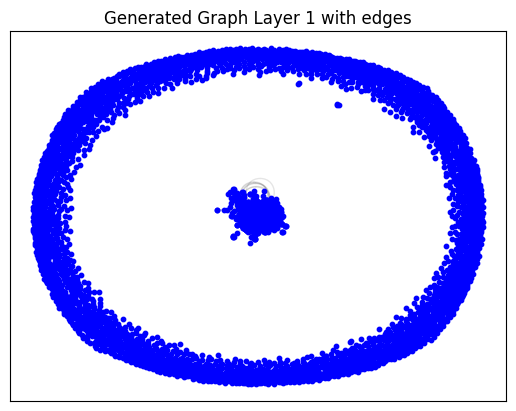

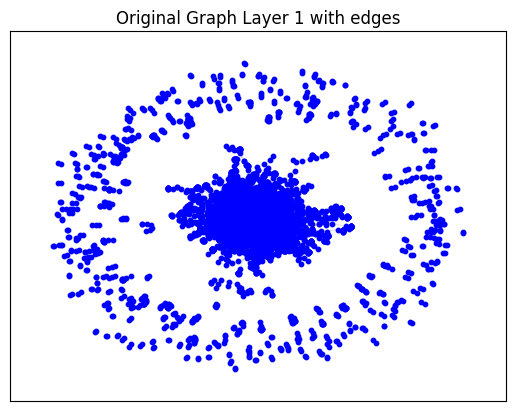

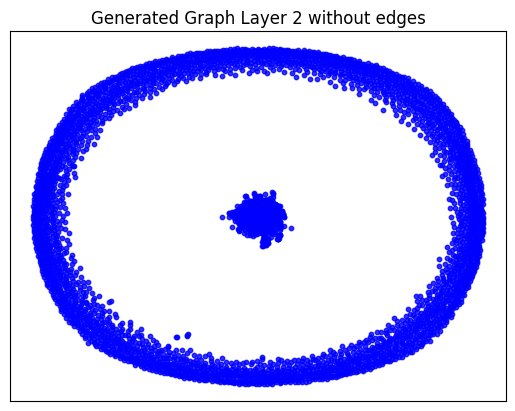

...

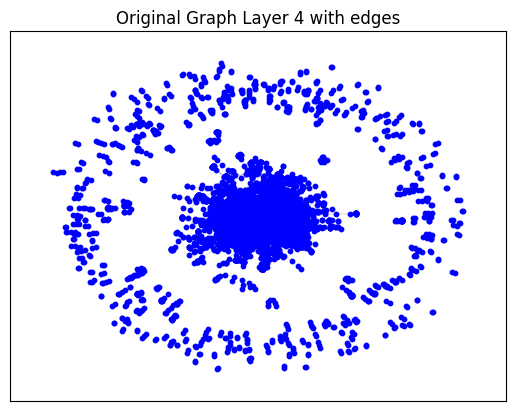

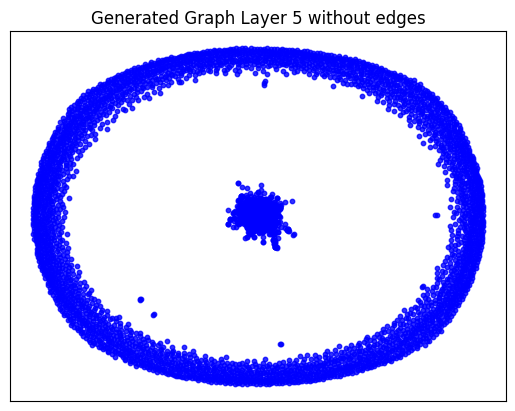

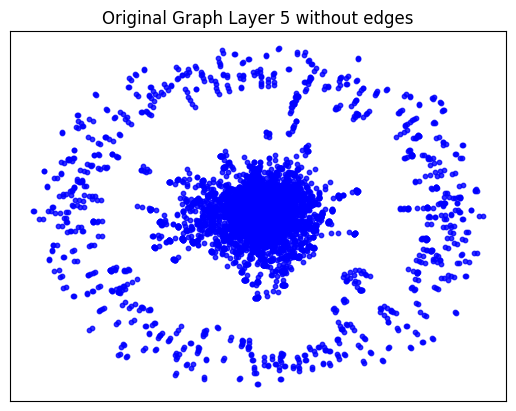

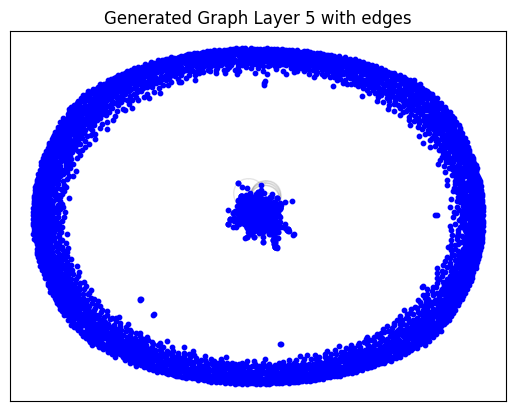

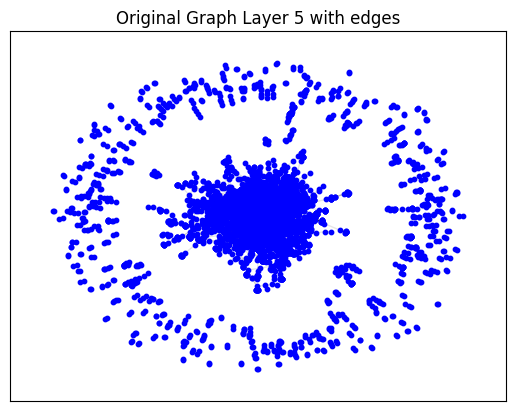

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_7.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.024537086486816406 seconds to compute statistics_degrees ---
--- 1.0803565979003906 seconds to compute statistics_LCC ---
--- 0.03512144088745117 seconds to compute statistics_wedge_count ---
--- 0.03603076934814453 seconds to compute statistics_claw_count ---
--- 0.18250536918640137 seconds to compute statistics_triangle_count ---
--- 0.02570819854736328 seconds to compute statistics_power_law_alpha ---
--- 0.026183128356933594 seconds to compute statistics_gini ---
--- 0.12653732299804688 seconds to compute statistics_edge_distribution_entropy ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04580235481262207 seconds to compute degree_assortativity_coefficient ---
--- 0.5430521965026855 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 311, 'd_min': 0, 'd': 1.23871193559678, 'LCC': 1199, 'wedge_count': 206410.0, 'claw_count': 13212359.0, 'triangle_count': 5884, 'power_law_exp': 2.1641002910663767, 'gini': 0.9303916170660187, 'rel_edge_distr_entropy': 0.6875371716674141, 'assortativity': -0.33406319782404537, 'clustering_coefficient': 0.001336021826231031, 'n_components': 4487}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.3987411807395501
KL divergence between original network and the network generated by Random E-R: 6.185963107972975
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.04587493327070871
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.3900155071089504
KL divergence between original network and the network generated by Random E-R: 34.59189207419034
KL divergence between original network and the network generated by Random B-A: 2.0061942526716097
KL divergence between original network and the network generated by GAE: 27.911176778563163


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Eighth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_8.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_8'
args.filename = 'pubmed_8_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_8'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 9.8128
Epoch: [ 2] time: 10.1309
Epoch: [ 3] time: 10.4488
Epoch: [ 4] time: 10.7670
Epoch: [ 5] time: 11.0851
Epoch: [ 6] time: 11.4033
Epoch: [ 7] time: 11.7210
Epoch: [ 8] time: 12.0391
Epoch: [ 9] time: 12.3570
Epoch: [10] time: 12.6749
Epoch: [11] time: 12.9929
Epoch: [12] time: 13.3203
Epoch: [13] time: 13.6549
Epoch: [14] time: 13.9738
Epoch: [15] time: 14.2920
Epoch: [16] time: 14.6115
Epoch: [17] time: 14.9305
Epoch: [18] time: 15.2491
Epoch: [19] time: 15.5672
Epoch: [20] time: 15.8854
Epoch: [21] time: 16.2034
Epoch: [22] time: 16.5217
Epoch: [23] time: 16.8398
Epoch: [24] time: 17.1581
Epoch: [25] time: 17.4766
Epoch: [26] time: 17.7950
Epoch: [27] time: 18.1128
Epoch: [28] time: 18.4308
Epoch: [29] time: 18.7490
Epoch: [30] time: 19.0670
Epoch: [31] time: 19.3851
Epoch: [32] time: 19.7038
Epoch: [33] time: 20.0226
Epoch: [34] time: 20.3410
Epoch: [35] time: 20.6593
Epoch: [36] time: 20.9773
Epoch: [37] time: 21.2955
Epoch: [38] t

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-51-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6065, 48])
Shape of h_subset: torch.Size([350, 48])
Shape of idx: torch.Size([350])
Shape of new_h before assignment: torch.Size([6065, 48])
Shape of h_subset: torch.Size([280, 48])
Shape of idx: torch.Size([280])
Shape of new_h before assignment: torch.Size([6065, 48])
Shape of h_subset: torch.Size([196, 48])
Shape of idx: torch.Size([196])
Computing metrics for original graph
--- 0.02859044075012207 seconds to compute statistics_degrees ---
--- 1.2281811237335205 seconds to compute statistics_LCC ---
--- 0.039492130279541016 seconds to compute statistics_wedge_count ---
--- 0.040792226791381836 seconds to compute statistics_claw_count ---
--- 0.22445106506347656 seconds to compute statistics_triangle_count ---
--- 0.0304110050201416 seconds to compute statistics_power_law_alpha ---
--- 0.03028583526611328 seconds to compute statistics_gini ---
--- 0.14259672164916992 seconds to compute statistics_edge_distribution_entropy ---
--- 0.053685

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6310646533966064 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 117.0, 'd_min': 0.0, 'd': 2.2669415, 'LCC': 2725, 'wedge_count': 173985.0, 'claw_count': 3029715.0, 'triangle_count': 1826, 'power_law_exp': 1.7248239602401256, 'gini': 0.8771757604255355, 'rel_edge_distr_entropy': 0.7838086940380585, 'assortativity': 0.03426873268841419, 'clustering_coefficient': 0.001808090860031389, 'n_components': 3328}


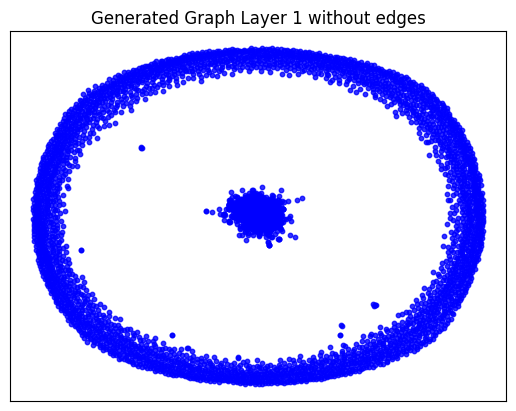

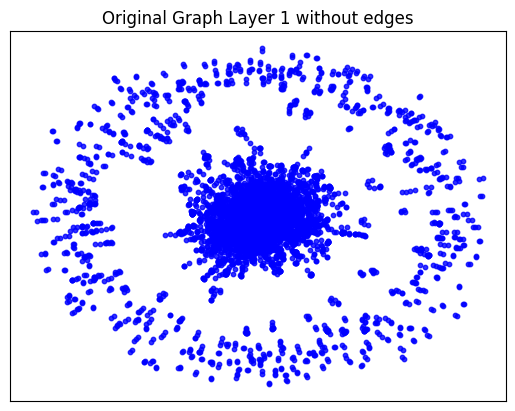

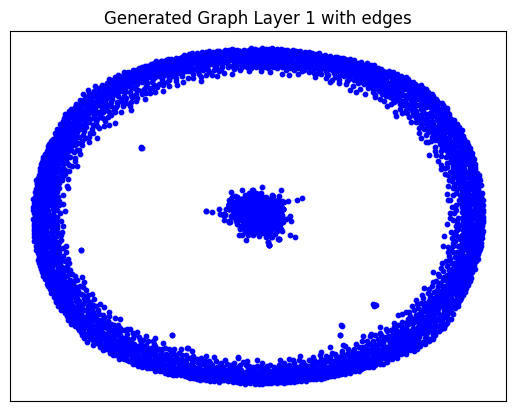

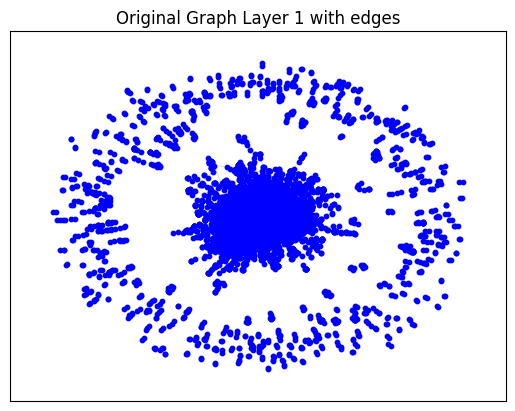

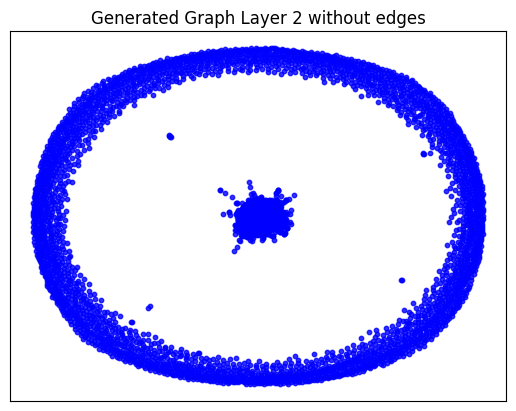

...

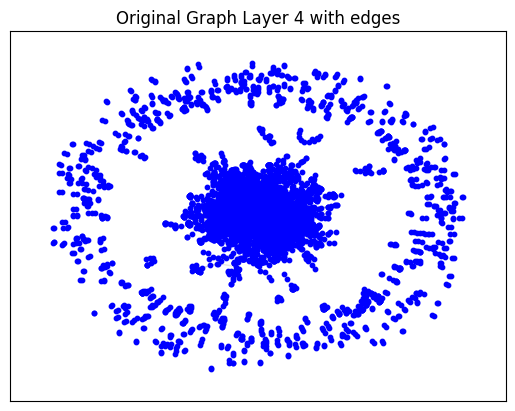

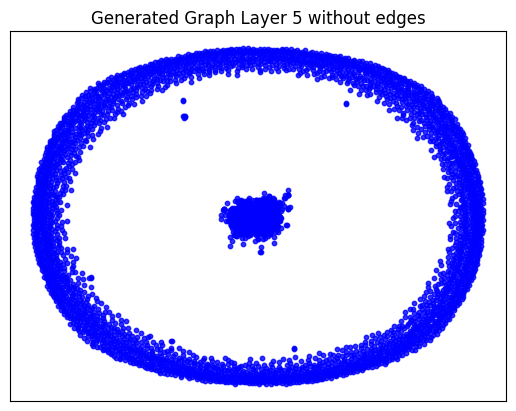

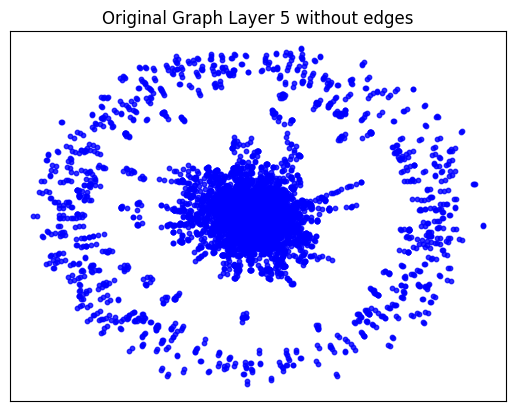

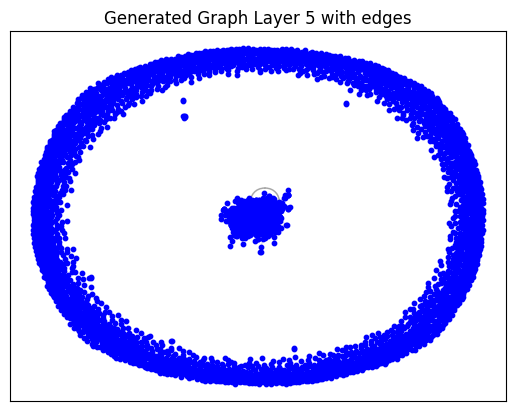

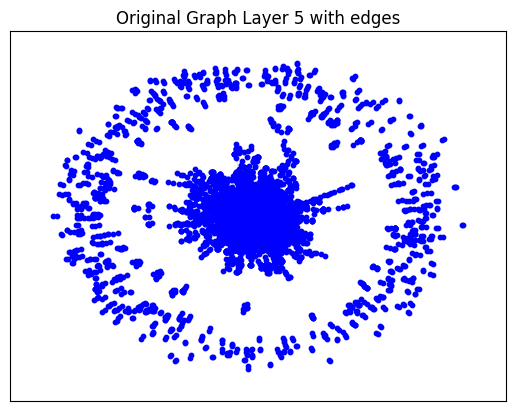

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_8.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.027778148651123047 seconds to compute statistics_degrees ---
--- 1.2192456722259521 seconds to compute statistics_LCC ---
--- 0.038062334060668945 seconds to compute statistics_wedge_count ---
--- 0.03921627998352051 seconds to compute statistics_claw_count ---
--- 0.20469164848327637 seconds to compute statistics_triangle_count ---
--- 0.029638051986694336 seconds to compute statistics_power_law_alpha ---
--- 0.029509305953979492 seconds to compute statistics_gini ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1431434154510498 seconds to compute statistics_edge_distribution_entropy ---
--- 0.049802541732788086 seconds to compute degree_assortativity_coefficient ---
--- 0.6100435256958008 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 329, 'd_min': 0, 'd': 1.1795252225519288, 'LCC': 1287, 'wedge_count': 165339.0, 'claw_count': 9223800.0, 'triangle_count': 5985, 'power_law_exp': 2.191357085324211, 'gini': 0.9309190103826464, 'rel_edge_distr_entropy': 0.6973534382898272, 'assortativity': -0.2588025856623438, 'clustering_coefficient': 0.001946594678982632, 'n_components': 4777}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 1.1446932393926985
KL divergence between original network and the network generated by Random E-R: 6.4484746084715985
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 2.841529800510808e-05
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.931195813972705
KL divergence between original network and the network generated by Random E-R: 44.06335887650915
KL divergence between original network and the network generated by Random B-A: 1.9736478849535064
KL divergence between original network and the network generated by GAE: 33.91945738465602


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Ninth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_9.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_9'
args.filename = 'pubmed_9_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_9'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 10.1866
Epoch: [ 2] time: 10.4986
Epoch: [ 3] time: 10.8099
Epoch: [ 4] time: 11.1207
Epoch: [ 5] time: 11.4313
Epoch: [ 6] time: 11.7421
Epoch: [ 7] time: 12.0538
Epoch: [ 8] time: 12.3645
Epoch: [ 9] time: 12.6759
Epoch: [10] time: 12.9872
Epoch: [11] time: 13.2985
Epoch: [12] time: 13.6099
Epoch: [13] time: 13.9212
Epoch: [14] time: 14.2315
Epoch: [15] time: 14.5426
Epoch: [16] time: 14.8541
Epoch: [17] time: 15.1645
Epoch: [18] time: 15.4756
Epoch: [19] time: 15.7868
Epoch: [20] time: 16.1000
Epoch: [21] time: 16.4110
Epoch: [22] time: 16.7220
Epoch: [23] time: 17.0326
Epoch: [24] time: 17.3436
Epoch: [25] time: 17.6549
Epoch: [26] time: 17.9662
Epoch: [27] time: 18.2774
Epoch: [28] time: 18.5886
Epoch: [29] time: 18.8993
Epoch: [30] time: 19.2105
Epoch: [31] time: 19.5214
Epoch: [32] time: 19.8326
Epoch: [33] time: 20.1459
Epoch: [34] time: 20.4568
Epoch: [35] time: 20.7759
Epoch: [36] time: 21.0947
Epoch: [37] time: 21.4073
Epoch: [38] 

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-51-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([5935, 48])
Shape of h_subset: torch.Size([342, 48])
Shape of idx: torch.Size([342])
Shape of new_h before assignment: torch.Size([5935, 48])
Shape of h_subset: torch.Size([273, 48])
Shape of idx: torch.Size([273])
Shape of new_h before assignment: torch.Size([5935, 48])
Shape of h_subset: torch.Size([191, 48])
Shape of idx: torch.Size([191])
Computing metrics for original graph
--- 0.02770376205444336 seconds to compute statistics_degrees ---
--- 1.1808888912200928 seconds to compute statistics_LCC ---
--- 0.03764176368713379 seconds to compute statistics_wedge_count ---
--- 0.039237260818481445 seconds to compute statistics_claw_count ---
--- 0.21657490730285645 seconds to compute statistics_triangle_count ---
--- 0.02881479263305664 seconds to compute statistics_power_law_alpha ---
--- 0.0285336971282959 seconds to compute statistics_gini ---
--- 0.13756132125854492 seconds to compute statistics_edge_distribution_entropy ---
--- 0.0536215

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6004288196563721 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 205.0, 'd_min': 0.0, 'd': 2.3229992, 'LCC': 1872, 'wedge_count': 280897.0, 'claw_count': 7636507.0, 'triangle_count': 19189, 'power_law_exp': 1.6663622260637392, 'gini': 0.9232478809109763, 'rel_edge_distr_entropy': 0.7313592835212307, 'assortativity': -0.21269979641536896, 'clustering_coefficient': 0.0075383941899090775, 'n_components': 4029}


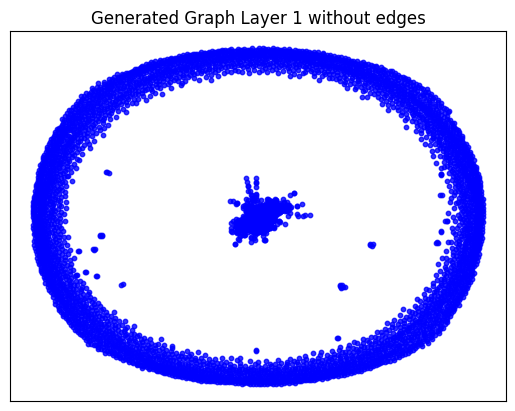

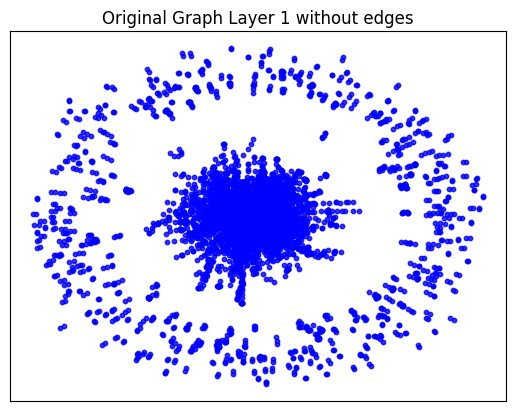

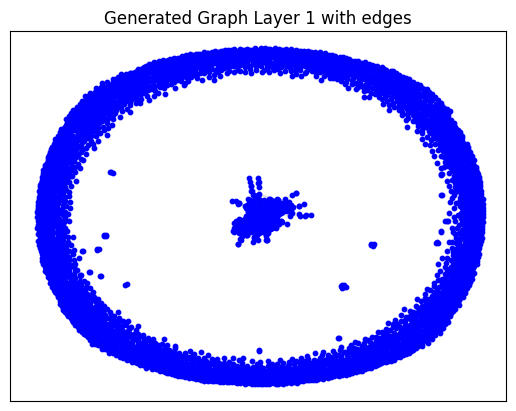

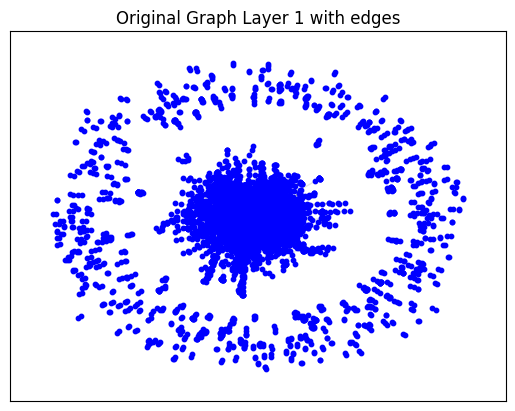

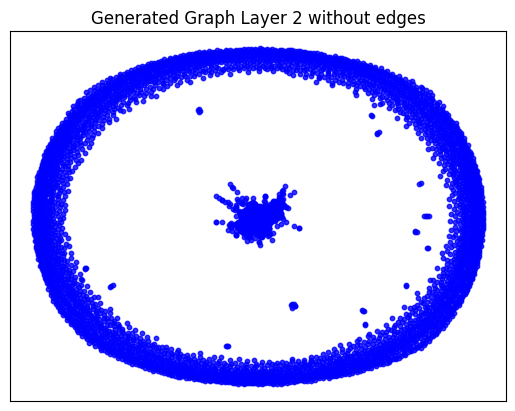

...

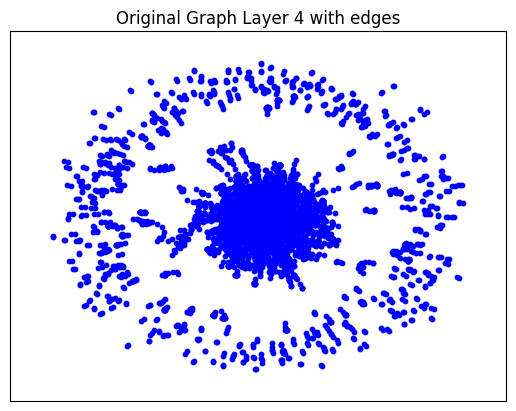

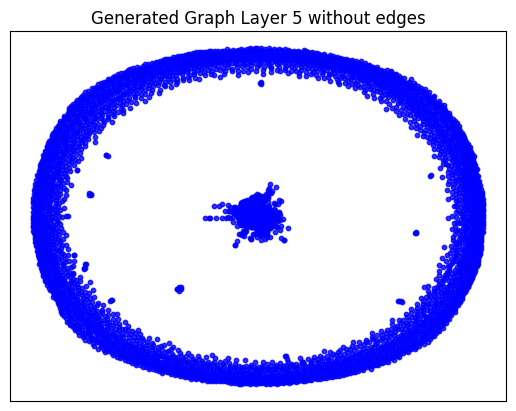

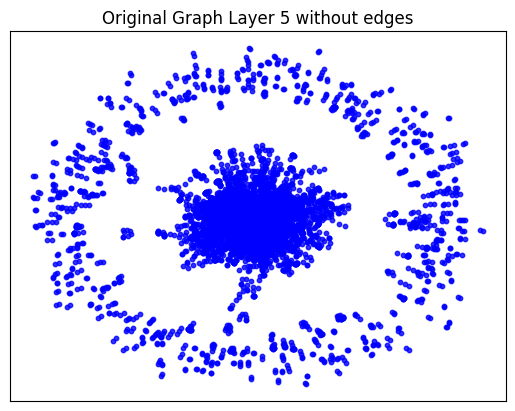

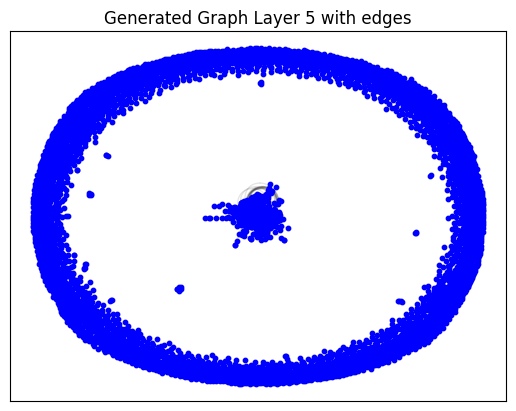

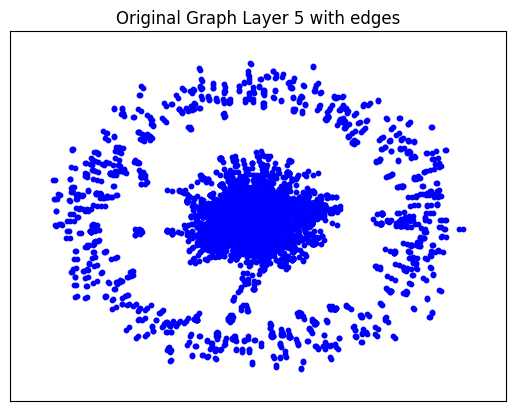

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_9.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.026453018188476562 seconds to compute statistics_degrees ---
--- 1.168506383895874 seconds to compute statistics_LCC ---
--- 0.03719282150268555 seconds to compute statistics_wedge_count ---
--- 0.03806710243225098 seconds to compute statistics_claw_count ---
--- 0.19510602951049805 seconds to compute statistics_triangle_count ---
--- 0.028167009353637695 seconds to compute statistics_power_law_alpha ---
--- 0.02805614471435547 seconds to compute statistics_gini ---
--- 0.1356184482574463 seconds to compute statistics_edge_distribution_entropy ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.05240035057067871 seconds to compute degree_assortativity_coefficient ---
--- 0.5879936218261719 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 207, 'd_min': 0, 'd': 1.198955525606469, 'LCC': 1102, 'wedge_count': 167265.0, 'claw_count': 6605332.0, 'triangle_count': 8192, 'power_law_exp': 2.1009634523539495, 'gini': 0.9419925839084657, 'rel_edge_distr_entropy': 0.6793793965226307, 'assortativity': -0.35474054567425123, 'clustering_coefficient': 0.00372063054514141, 'n_components': 4829}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.04935617692174397
KL divergence between original network and the network generated by Random E-R: 6.035312500440518
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.0417686993790509
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.329136556247633
KL divergence between original network and the network generated by Random E-R: 12.620169067342982
KL divergence between original network and the network generated by Random B-A: 1.8871946538477868
KL divergence between original network and the network generated by GAE: 40.313621333826596


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

10 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_10.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_10'
args.filename = 'pubmed_10_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_10'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 9.7185
Epoch: [ 2] time: 9.8878
Epoch: [ 3] time: 10.0563
Epoch: [ 4] time: 10.2241
Epoch: [ 5] time: 10.3921
Epoch: [ 6] time: 10.5616
Epoch: [ 7] time: 10.7305
Epoch: [ 8] time: 10.8997
Epoch: [ 9] time: 11.0684
Epoch: [10] time: 11.2375
Epoch: [11] time: 11.4067
Epoch: [12] time: 11.5763
Epoch: [13] time: 11.7453
Epoch: [14] time: 11.9144
Epoch: [15] time: 12.0827
Epoch: [16] time: 12.2504
Epoch: [17] time: 12.4192
Epoch: [18] time: 12.5877
Epoch: [19] time: 12.7573
Epoch: [20] time: 12.9263
Epoch: [21] time: 13.0936
Epoch: [22] time: 13.2631
Epoch: [23] time: 13.4327
Epoch: [24] time: 13.6014
Epoch: [25] time: 13.7711
Epoch: [26] time: 13.9411
Epoch: [27] time: 14.1093
Epoch: [28] time: 14.2788
Epoch: [29] time: 14.4478
Epoch: [30] time: 14.6160
Epoch: [31] time: 14.7853
Epoch: [32] time: 14.9536
Epoch: [33] time: 15.1218
Epoch: [34] time: 15.2904
Epoch: [35] time: 15.4588
Epoch: [36] time: 15.6280
Epoch: [37] time: 15.7966
Epoch: [38] ti

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-51-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([5918, 48])
Shape of h_subset: torch.Size([342, 48])
Shape of idx: torch.Size([342])
Shape of new_h before assignment: torch.Size([5918, 48])
Shape of h_subset: torch.Size([273, 48])
Shape of idx: torch.Size([273])
Shape of new_h before assignment: torch.Size([5918, 48])
Shape of h_subset: torch.Size([191, 48])
Shape of idx: torch.Size([191])
Computing metrics for original graph
--- 0.026931047439575195 seconds to compute statistics_degrees ---
--- 1.166689157485962 seconds to compute statistics_LCC ---
--- 0.03707695007324219 seconds to compute statistics_wedge_count ---
--- 0.03791499137878418 seconds to compute statistics_claw_count ---
--- 0.2121889591217041 seconds to compute statistics_triangle_count ---
--- 0.02754807472229004 seconds to compute statistics_power_law_alpha ---
--- 0.027387380599975586 seconds to compute statistics_gini ---
--- 0.1340644359588623 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05302405

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6037211418151855 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 92.0, 'd_min': 0.0, 'd': 2.3146334, 'LCC': 2274, 'wedge_count': 109847.0, 'claw_count': 1069050.0, 'triangle_count': 3452, 'power_law_exp': 1.6721579114240586, 'gini': 0.8496482639485634, 'rel_edge_distr_entropy': 0.811947024332864, 'assortativity': -0.19395959166219898, 'clustering_coefficient': 0.009687105373930124, 'n_components': 3633}


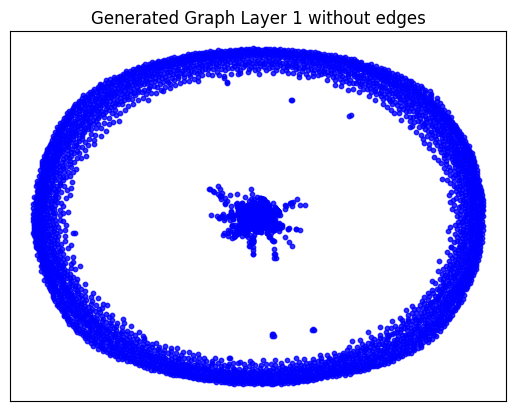

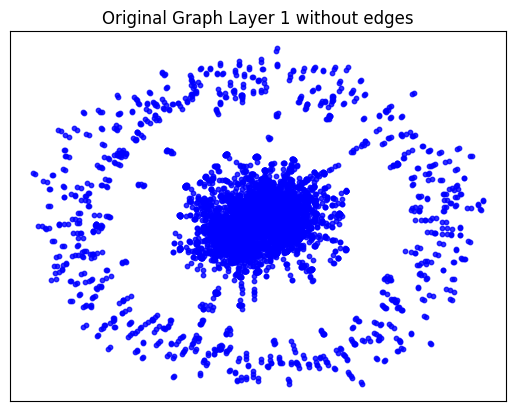

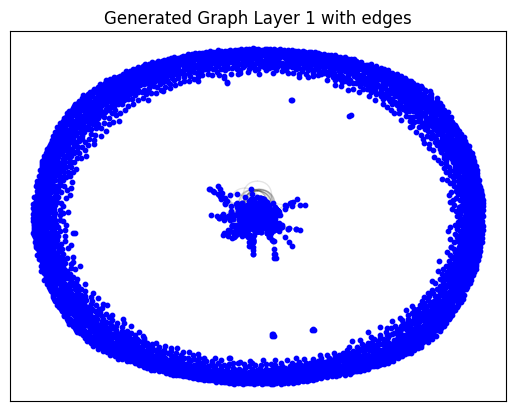

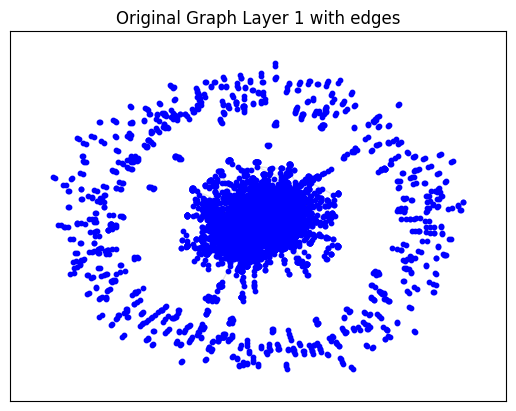

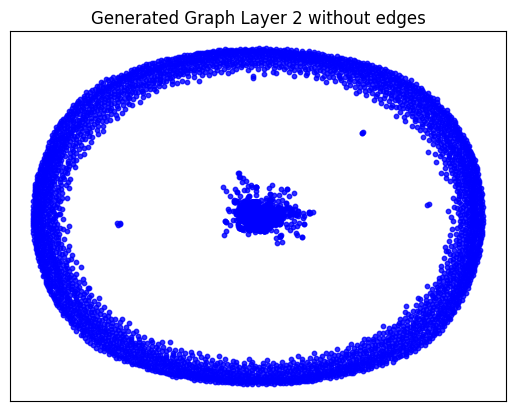

...

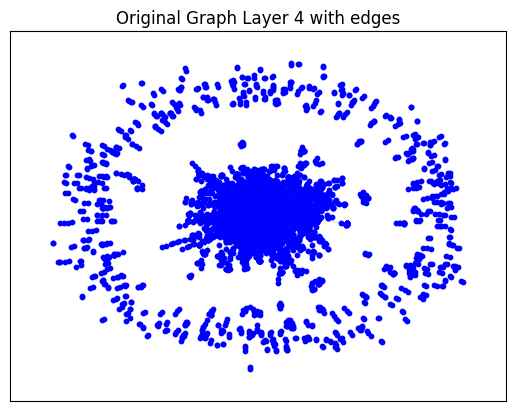

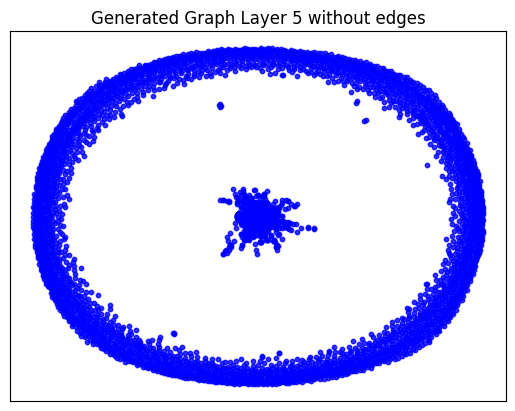

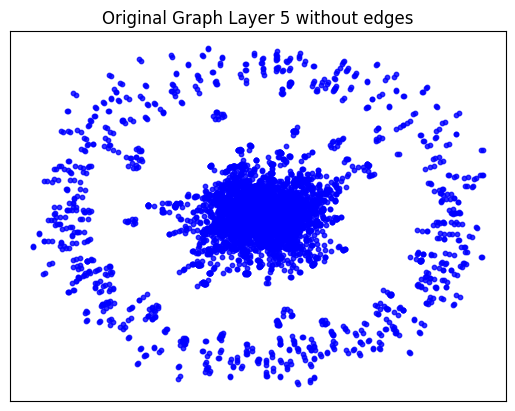

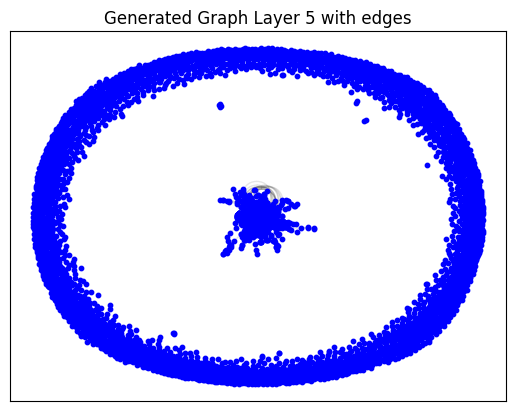

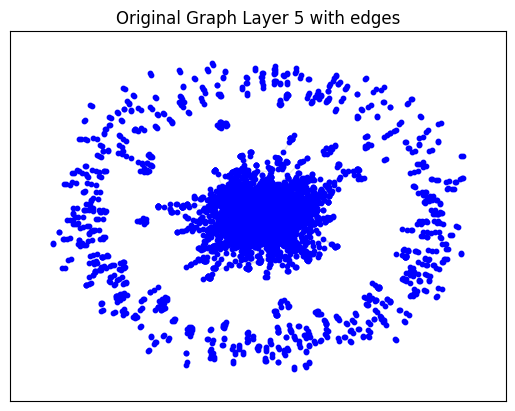

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_10.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.027197837829589844 seconds to compute statistics_degrees ---
--- 1.1672520637512207 seconds to compute statistics_LCC ---
--- 0.037439584732055664 seconds to compute statistics_wedge_count ---
--- 0.03840065002441406 seconds to compute statistics_claw_count ---
--- 0.19492220878601074 seconds to compute statistics_triangle_count ---
--- 0.02911067008972168 seconds to compute statistics_power_law_alpha ---
--- 0.028832435607910156 seconds to compute statistics_gini ---
--- 0.13519668579101562 seconds to compute statistics_edge_distribution_entropy ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04596972465515137 seconds to compute degree_assortativity_coefficient ---
--- 0.581162691116333 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 217, 'd_min': 0, 'd': 1.2025680013515796, 'LCC': 940, 'wedge_count': 130933.0, 'claw_count': 3689418.0, 'triangle_count': 11056, 'power_law_exp': 1.9659070376386378, 'gini': 0.9490482666128541, 'rel_edge_distr_entropy': 0.678286823052205, 'assortativity': -0.25274628392038984, 'clustering_coefficient': 0.008990035826788942, 'n_components': 4969}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 11.758550698743582
KL divergence between original network and the network generated by Random E-R: 5.344189740194692
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 11.576352633348149
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.656756906658247
KL divergence between original network and the network generated by Random E-R: 13.278537116015933
KL divergence between original network and the network generated by Random B-A: 1.915745638399847
KL divergence between original network and the network generated by GAE: 40.89247692157454


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

11 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_11.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_11'
args.filename = 'pubmed_11_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_11'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 9.5863
Epoch: [ 2] time: 9.9136
Epoch: [ 3] time: 10.2401
Epoch: [ 4] time: 10.5672
Epoch: [ 5] time: 10.8940
Epoch: [ 6] time: 11.2206
Epoch: [ 7] time: 11.5476
Epoch: [ 8] time: 11.8747
Epoch: [ 9] time: 12.2012
Epoch: [10] time: 12.5281
Epoch: [11] time: 12.8556
Epoch: [12] time: 13.1821
Epoch: [13] time: 13.5095
Epoch: [14] time: 13.8362
Epoch: [15] time: 14.1629
Epoch: [16] time: 14.4894
Epoch: [17] time: 14.8160
Epoch: [18] time: 15.1428
Epoch: [19] time: 15.4694
Epoch: [20] time: 15.7968
Epoch: [21] time: 16.1228
Epoch: [22] time: 16.4491
Epoch: [23] time: 16.7761
Epoch: [24] time: 17.1031
Epoch: [25] time: 17.4300
Epoch: [26] time: 17.7573
Epoch: [27] time: 18.0840
Epoch: [28] time: 18.4100
Epoch: [29] time: 18.7366
Epoch: [30] time: 19.0645
Epoch: [31] time: 19.3921
Epoch: [32] time: 19.7198
Epoch: [33] time: 20.0477
Epoch: [34] time: 20.3746
Epoch: [35] time: 20.7021
Epoch: [36] time: 21.0293
Epoch: [37] time: 21.4155
Epoch: [38] ti

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-51-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([6029, 48])
Shape of h_subset: torch.Size([348, 48])
Shape of idx: torch.Size([348])
Shape of new_h before assignment: torch.Size([6029, 48])
Shape of h_subset: torch.Size([278, 48])
Shape of idx: torch.Size([278])
Shape of new_h before assignment: torch.Size([6029, 48])
Shape of h_subset: torch.Size([194, 48])
Shape of idx: torch.Size([194])
Computing metrics for original graph
--- 0.027849197387695312 seconds to compute statistics_degrees ---
--- 1.2617669105529785 seconds to compute statistics_LCC ---
--- 0.041188716888427734 seconds to compute statistics_wedge_count ---
--- 0.04034137725830078 seconds to compute statistics_claw_count ---
--- 0.2201690673828125 seconds to compute statistics_triangle_count ---
--- 0.02977299690246582 seconds to compute statistics_power_law_alpha ---
--- 0.03031778335571289 seconds to compute statistics_gini ---
--- 0.14205145835876465 seconds to compute statistics_edge_distribution_entropy ---
--- 0.053803

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6197128295898438 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 97.0, 'd_min': 0.0, 'd': 2.2731795, 'LCC': 2093, 'wedge_count': 169270.0, 'claw_count': 2378307.0, 'triangle_count': 6987, 'power_law_exp': 1.7347378564597156, 'gini': 0.889153500994736, 'rel_edge_distr_entropy': 0.7757833028253993, 'assortativity': 0.1777995796307068, 'clustering_coefficient': 0.008813412229792032, 'n_components': 3900}


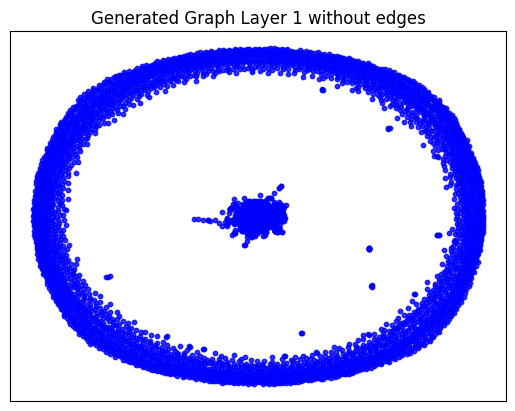

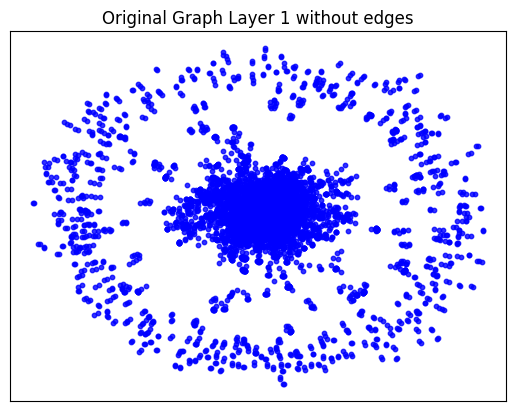

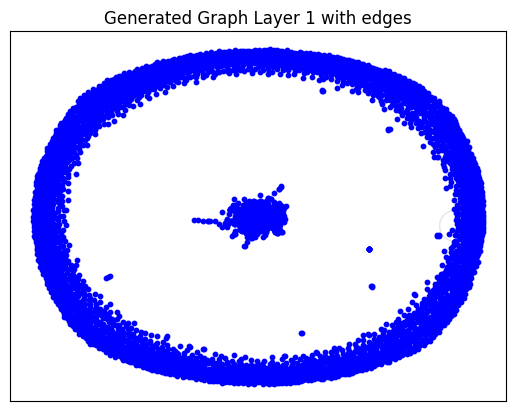

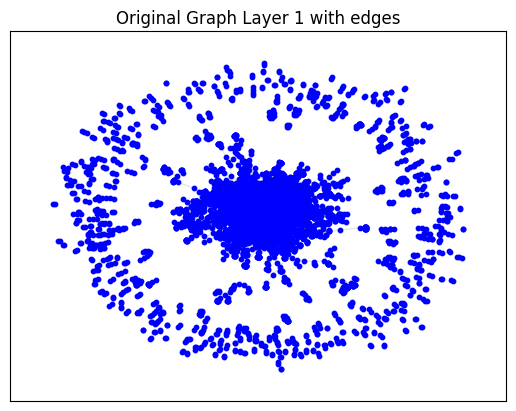

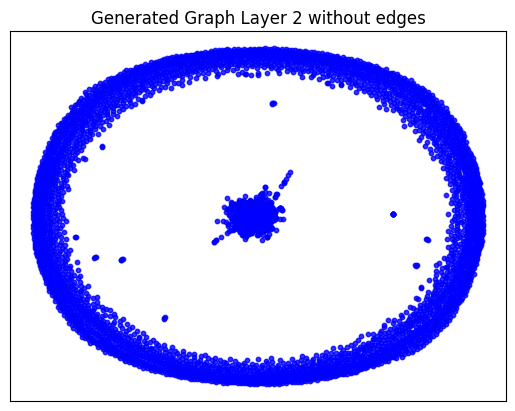

...

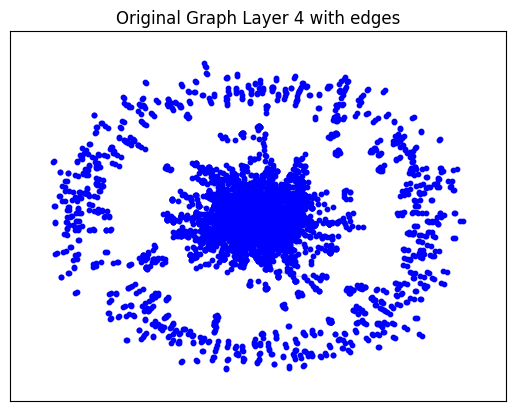

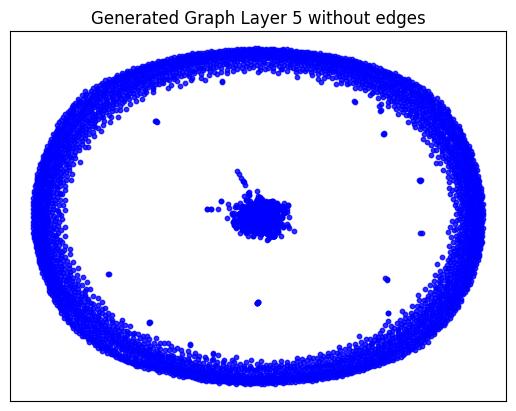

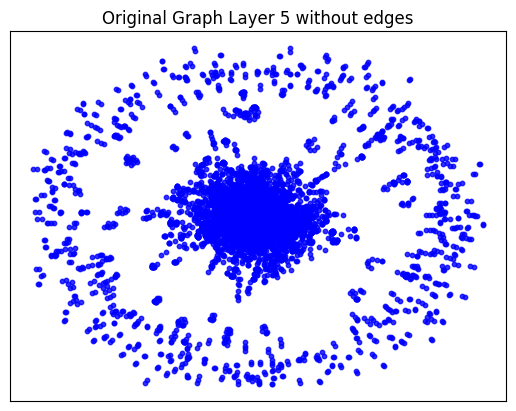

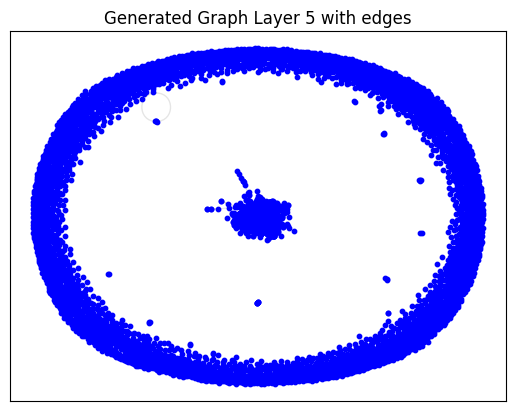

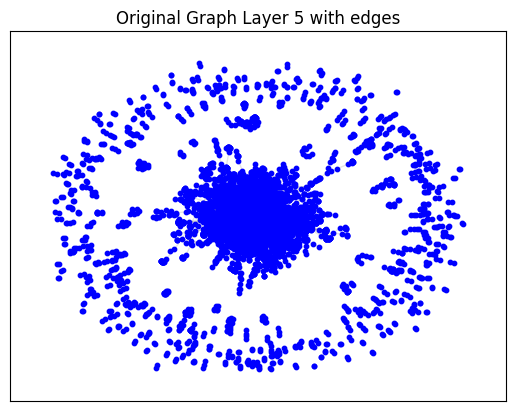

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_11.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.027570724487304688 seconds to compute statistics_degrees ---
--- 1.2107648849487305 seconds to compute statistics_LCC ---
--- 0.03855586051940918 seconds to compute statistics_wedge_count ---
--- 0.03938865661621094 seconds to compute statistics_claw_count ---
--- 0.20305371284484863 seconds to compute statistics_triangle_count ---
--- 0.02827310562133789 seconds to compute statistics_power_law_alpha ---
--- 0.028191566467285156 seconds to compute statistics_gini ---
--- 0.14078259468078613 seconds to compute statistics_edge_distribution_entropy ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.0467829704284668 seconds to compute degree_assortativity_coefficient ---
--- 0.6028201580047607 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 246, 'd_min': 0, 'd': 1.1704809286898838, 'LCC': 736, 'wedge_count': 177492.0, 'claw_count': 7475155.0, 'triangle_count': 13768, 'power_law_exp': 1.7757836573937622, 'gini': 0.95591147878253, 'rel_edge_distr_entropy': 0.6570406760444663, 'assortativity': -0.23601082152611016, 'clustering_coefficient': 0.005525504153425581, 'n_components': 5247}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.7510906929582899
KL divergence between original network and the network generated by Random E-R: 5.1929041087733
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 3.7687132953765508
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.4510053067072084
KL divergence between original network and the network generated by Random E-R: 3.9406286981652903
KL divergence between original network and the network generated by Random B-A: 1.8323055406624562
KL divergence between original network and the network generated by GAE: 47.81809962894762


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

12 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_12.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_12'
args.filename = 'pubmed_12_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_12'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 9.2865
Epoch: [ 2] time: 9.5026
Epoch: [ 3] time: 9.7192
Epoch: [ 4] time: 9.9348
Epoch: [ 5] time: 10.1505
Epoch: [ 6] time: 10.3668
Epoch: [ 7] time: 10.5830
Epoch: [ 8] time: 10.7985
Epoch: [ 9] time: 11.0144
Epoch: [10] time: 11.2305
Epoch: [11] time: 11.4465
Epoch: [12] time: 11.6624
Epoch: [13] time: 11.8778
Epoch: [14] time: 12.0934
Epoch: [15] time: 12.3093
Epoch: [16] time: 12.5256
Epoch: [17] time: 12.7414
Epoch: [18] time: 12.9568
Epoch: [19] time: 13.1728
Epoch: [20] time: 13.3884
Epoch: [21] time: 13.6046
Epoch: [22] time: 13.8214
Epoch: [23] time: 14.0373
Epoch: [24] time: 14.2533
Epoch: [25] time: 14.4700
Epoch: [26] time: 14.6865
Epoch: [27] time: 14.9038
Epoch: [28] time: 15.1207
Epoch: [29] time: 15.3378
Epoch: [30] time: 15.5581
Epoch: [31] time: 15.7740
Epoch: [32] time: 15.9900
Epoch: [33] time: 16.2070
Epoch: [34] time: 16.4243
Epoch: [35] time: 16.6415
Epoch: [36] time: 16.8582
Epoch: [37] time: 17.0739
Epoch: [38] time

Testing PubMed

<ipython-input-29-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-29-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS
 [*] Reading checkpoint...
 [*] Load SUCCESS


<ipython-input-51-1bf135de03e2>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Shape of new_h before assignment: torch.Size([4868, 48])
Shape of h_subset: torch.Size([280, 48])
Shape of idx: torch.Size([280])
Shape of new_h before assignment: torch.Size([4868, 48])
Shape of h_subset: torch.Size([224, 48])
Shape of idx: torch.Size([224])
Shape of new_h before assignment: torch.Size([4868, 48])
Shape of h_subset: torch.Size([156, 48])
Shape of idx: torch.Size([156])
Computing metrics for original graph
--- 0.017928361892700195 seconds to compute statistics_degrees ---
--- 0.7843046188354492 seconds to compute statistics_LCC ---
--- 0.026503324508666992 seconds to compute statistics_wedge_count ---
--- 0.027138471603393555 seconds to compute statistics_claw_count ---
--- 0.1483607292175293 seconds to compute statistics_triangle_count ---
--- 0.019433021545410156 seconds to compute statistics_power_law_alpha ---
--- 0.019088029861450195 seconds to compute statistics_gini ---
--- 0.09034395217895508 seconds to compute statistics_edge_distribution_entropy ---
--- 0.042

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.4013335704803467 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 73.0, 'd_min': 0.0, 'd': 2.1657765, 'LCC': 1761, 'wedge_count': 120803.0, 'claw_count': 1500536.0, 'triangle_count': 1384, 'power_law_exp': 1.6987983055684897, 'gini': 0.8939123077842739, 'rel_edge_distr_entropy': 0.766793967089952, 'assortativity': -0.17718489142755142, 'clustering_coefficient': 0.0027670112546450067, 'n_components': 3099}


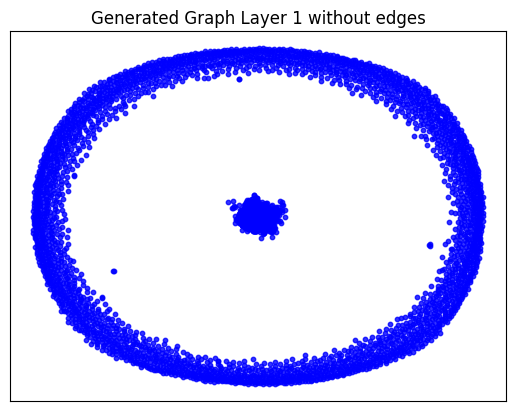

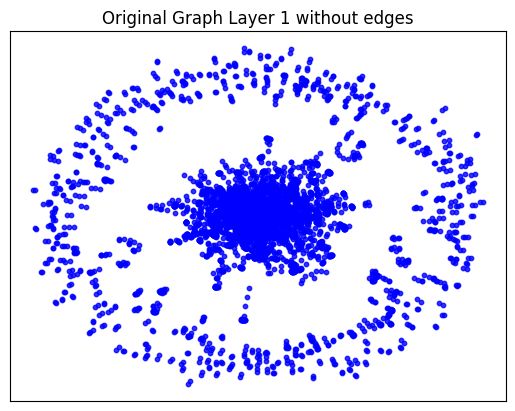

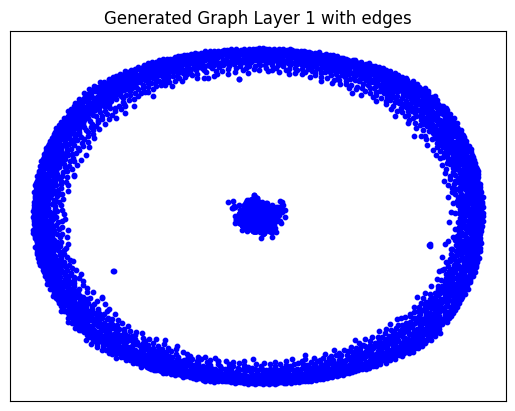

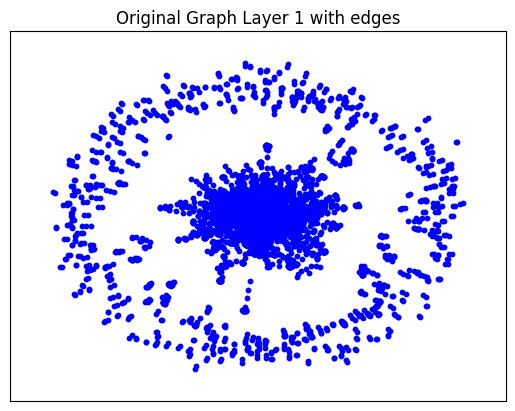

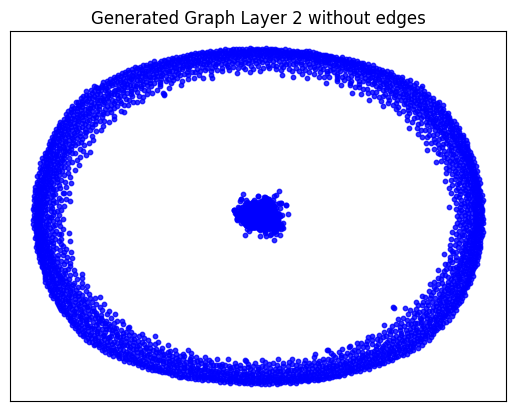

...

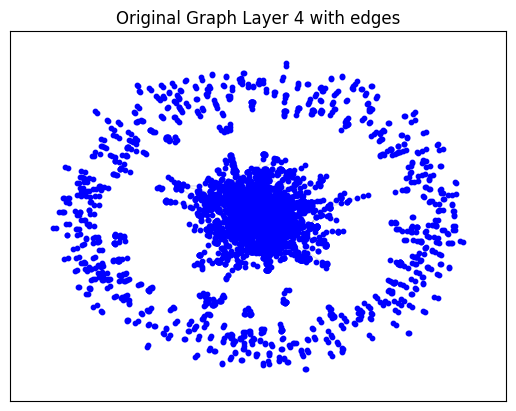

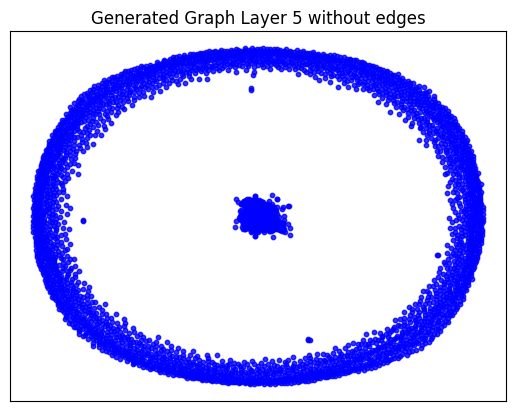

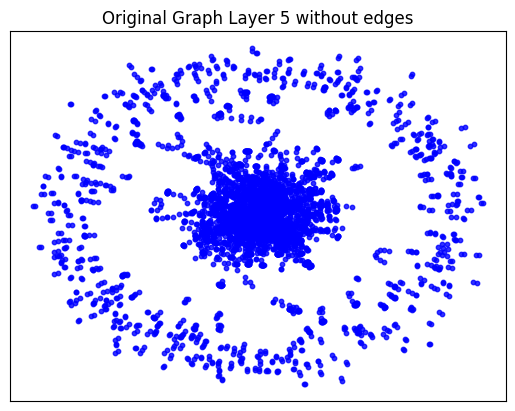

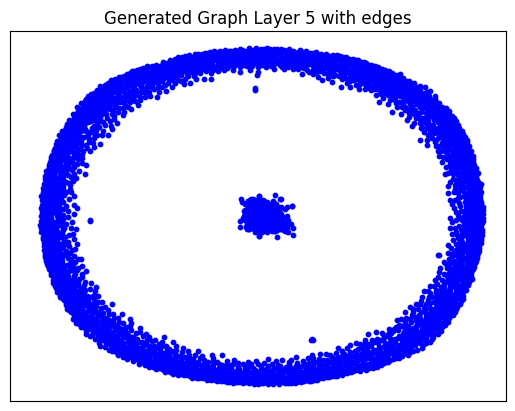

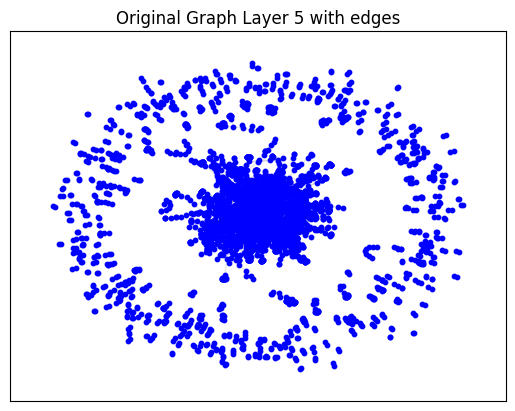

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_12.
GAE Optimization Finished!
Generating graph by GAE algorithm.
Computing metrics for graph generated by GAE
--- 0.01974630355834961 seconds to compute statistics_degrees ---
--- 0.8296818733215332 seconds to compute statistics_LCC ---
--- 0.027027368545532227 seconds to compute statistics_wedge_count ---
--- 0.02779388427734375 seconds to compute statistics_claw_count ---
--- 0.1342449188232422 seconds to compute statistics_triangle_count ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.021522045135498047 seconds to compute statistics_power_law_alpha ---
--- 0.020699024200439453 seconds to compute statistics_gini ---
--- 0.09248018264770508 seconds to compute statistics_edge_distribution_entropy ---
--- 0.03634333610534668 seconds to compute degree_assortativity_coefficient ---
--- 0.39165234565734863 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 114, 'd_min': 0, 'd': 1.1090573012939002, 'LCC': 265, 'wedge_count': 104224.0, 'claw_count': 2068053.0, 'triangle_count': 14236, 'power_law_exp': 1.43559178213424, 'gini': 0.9705059978853365, 'rel_edge_distr_entropy': 0.6143739474090786, 'assortativity': -0.04157563786955596, 'clustering_coefficient': 0.020651308259507856, 'n_components': 4600}
Evaluation Results:
Start computing graph degree


<ipython-input-49-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-49-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-49-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-49-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 1.5796331457255284
KL divergence between original network and the network generated by Random E-R: 5.940059283570239
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.2254890433472119
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 4.021574019212111
KL divergence between original network and the network generated by Random E-R: 3.8322787405375416
KL divergence between original network and the network generated by Random B-A: 1.7969515752037821
KL divergence between original network and the network generated by GAE: 0.7266900656936177


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()